# ASSIGNMENT 3
# Submission Deadline: 20/03/2024 at 10 AM
# Submission Link: https://forms.gle/b8s6xYHUYqTJtSNeA

# Table of Contents

1. [Provide Information](#Provide-Information)
2. [Instructions](#Instructions)
3. [Environment](#Environment)
4. [Hyperparameters](#Hyperparameters)
5. [Helper Functions](#helper)
6. [Deep Value Based RL Agents](#deep-value-based)
7. [Deep Policy Based RL Agents](#deep-policy-based)
8. [Experiments to Run](#experiments)

# Provide Information
<a id="Provide-Information"></a>

Name: **Rajarshi Dutta**

Roll No.: **200762**

IITK EMail: **rajarshi20@iitk.ac.in**

# Instructions
<a id="Instructions"></a>


**Read all the instructions below carefully before you start working on the assignment.**
- The purpose of this course is that you learn RL and the best way to do that is by implementation and experimentation.
- The assignment requires your to implement some algorithms and you are required report your findings after experimenting with those algorithms.
- **You are required to submit ZIP file containing a Jupyter notebook (.ipynb), and an image folder. The notebook would include the code, graphs/plots of the experiments you run and your findings/observations. Image folder is the folder having plots, images, etc.**
- In case you use any maths in your explanations, render it using latex in the Jupyter notebook.
- You are expected to implement algorithms on your own and not copy it from other sources/class mates. Of course, you can refer to lecture slides.
- If you use any reference or material (including code), please cite the source, else it will be considered plagiarism. But referring to other sources that directly solve the problems given in the assignment is not allowed. There is a limit to which you can refer to outside material.
- This is an individual assignment.
- In case your solution is found to have an overlap with solution by someone else (including external sources), all the parties involved will get zero in this and all future assignments plus further more penalties in the overall grade. We will check not just for lexical but also semantic overlap. Same applies for the code as well. Even an iota of cheating would NOT be tolerated. If you cheat one line or cheat one page the penalty would be same.
- Be a smart agent, think long term, if you cheat we will discover it somehow, the price you would be paying is not worth it.
- In case you are struggling with the assignment, seek help from TAs. Cheating is not an option! I respect honesty and would be lenient if you are not able to solve some questions due to difficulty in understanding. Remember we are there to help you out, seek help if something is difficult to understand.
- The deadline for the submission is given above. Submit at least 30 minutes before the deadline, lot can happen at the last moment, your internet can fail, there can be a power failure, you can be abducted by aliens, etc.
- You have to submit your assignment via the Google Form (link above)
- The form would close after the deadline and we will not accept any solution. No reason what-so-ever would be accepted for not being able to submit before the deadline.
- Since the assignment involves experimentation, reporting your results and observations, there is a lot of scope for creativity and innovation and presenting new perspectives. Such efforts would be highly appreciated and accordingly well rewarded. Be an exploratory agent!
- Your code should be very well documented, there are marks for that.
- In your plots, have a clear legend and clear lines, etc. Of course you would generating the plots in your code but you must also put these plots in your notebook. Generate high resolution pdf/svg version of the plots so that it doesn't pixilate on zooming.
- For all experiments, report about the seed used in the code documentation, write about the seed used.
- In your notebook write about all things that are not obvious from the code e.g., if you have made any assumptions, references/sources, running time, etc.
-  **DO NOT Forget to write name, roll no and email details above**
- **In addition to checking your code, we will be conducting one-on-one viva for the evaluation. So please make sure that you do not cheat!**
- **Use of LLMs based tools or AI-based code tools is strictly prohibited! Use of ChatGPT, VS Code, Gemini, CO-Pilot, etc. is not allowed. NOTE VS code is also not allowed. Even in Colab disable the AI assistant. If you use it, we will know it very easily. Use of any of the tools would be counted as cheating and would be given a ZERO, with no questions asked.**
- For each of the sub-part in the question create a new cell below the question and put your answer in there. This includes the plots as well

In [2]:
!pip3 install gymnasium


[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: pip install --upgrade pip


# OpenAI Gym Environments
<a id="Environment"></a>

### Global Seed = 123
### Instance Seed = Global Seed + instance (5 different instances of gym environemnt averaged in each plot)

In [1]:
# all imports go in here
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.distributions import Categorical
import time
import random
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In this assignment we will be exploring Deep RL algorithms and for this we will be using environmentd provided by OpenAI Gym. In particualr we will be exploring "CartPole-v0" and "MountainCar-v0" environments (https://gymnasium.farama.org/environments/classic_control/ ). The code to instantiate the environments are given in the cells below. Run these cells and play with the environments to learn more details about the environments.

In [3]:
# Create CartPole environment
#https://gymnasium.farama.org/environments/classic_control/cart_pole/

env1 = gym.make('CartPole-v0')
# env.seed(34)
s = env1.reset()
# print(s)
print("Observation Space = ")
print(env1.observation_space)
print("Action Space = ")
print(env1.action_space)
done = False
for episode in range(20):
    print("In episode {}".format(episode))
    for i in range(100):
        env1.render()
        print(s)
        a = env1.action_space.sample()
        step_result = env1.step(a)
        s, r, terminated, truncated, _ = env1.step(a)
        if terminated or truncated:
            print("Finished after {} timestep".format(i+1))
env1.close()

Observation Space = 
Box([-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38], [4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38], (4,), float32)
Action Space = 
Discrete(2)
In episode 0
(array([-0.00198526, -0.02762555, -0.04049017, -0.03065558], dtype=float32), {})
[-0.00698066 -0.41665575 -0.03612364  0.5284223 ]
[-0.01973467 -0.025567   -0.02106361 -0.0760541 ]
[-0.02465362 -0.4151726  -0.0183865   0.4953834 ]
[-0.037353   -0.02455407 -0.00453957 -0.09838241]
[-0.03443143  0.36584634 -0.0143571  -0.6872215 ]
[-0.01589121  0.7566515  -0.04778932 -1.2857649 ]
[ 0.01048521  0.36810145 -0.09367301 -0.73969454]
[ 0.02133502 -0.01904767 -0.11802489 -0.22127633]
[ 0.01670802 -0.40547478 -0.12181102  0.2836487 ]
[-0.00337483 -0.79198164 -0.1054267   0.7895165 ]
[-0.03892466 -1.1793355  -0.06869119  1.3105123 ]
[-0.08998184 -1.5681148  -0.01086238  1.860066  ]
[-0.15660645 -1.9584868   0.06932608  2.4500544 ]
[-0.23105656 -1.5702283   0.16191554  1.9254727 ]
Finished after 1

In [4]:
# Create MountainCar environment:
# https://gymnasium.farama.org/environments/classic_control/mountain_car/

env2 = gym.make('MountainCar-v0')
# env.seed(45)
s = env2.reset()
print("Observation Space = ")
print(env2.observation_space)
print("Action Space = ")
print(env2.action_space)
done = False
for episode in range(20):
    print("In episode {}".format(episode))
    for i in range(100):
        env2.render()
        print(s)
        a = env2.action_space.sample()
        s, r, terminated, truncated, _ = env2.step(a)
        if terminated or truncated:
            print("Finished after {} timestep".format(i+1))
env2.close()

Observation Space = 
Box([-1.2  -0.07], [0.6  0.07], (2,), float32)
Action Space = 
Discrete(3)
In episode 0
(array([-0.48915443,  0.        ], dtype=float32), {})
[-0.4904123  -0.00125787]
[-0.49091864 -0.00050636]
[-4.9066973e-01  2.4893068e-04]
[-0.48966736  0.00100236]
[-4.8991904e-01 -2.5168213e-04]
[-0.49042287 -0.00050385]
[-0.49117514 -0.00075226]
[-4.911702e-01  4.946942e-06]
[-0.4924081  -0.00123788]
[-0.49387956 -0.00147147]
[-0.49557364 -0.00169407]
[-0.49647763 -0.00090401]
[-4.96584833e-01 -1.07197004e-04]
[-4.9689442e-01 -3.0957983e-04]
[-0.49740407 -0.00050965]
[-0.49910998 -0.00170591]
[-0.5009994  -0.00188941]
[-0.50305814 -0.00205877]
[-0.5042709  -0.00121273]
[-0.50562847 -0.00135761]
[-0.5071208  -0.00149232]
[-0.50973666 -0.00261585]
[-0.51345646 -0.00371979]
[-0.5182523  -0.00479585]
[-0.5230882  -0.00483594]
[-0.52892804 -0.00583977]
[-0.5357278 -0.0067998]
[-0.54243666 -0.00670886]
[-0.5500043  -0.00756765]
[-0.55837417 -0.00836981]
[-0.5654836  -0.00710947]
[-

/home/rajarshi/autogpt/SemEval/str/lib/python3.10/site-packages/gymnasium/envs/classic_control/mountain_car.py:173: UserWarning: WARN: You are calling render method without specifying any render mode. You can specify the render_mode at initialization, e.g. gym.make("MountainCar-v0", render_mode="rgb_array")
  gym.logger.warn(


# Hyperparameters
<a id="Hyperparameters"></a>

All your hyperparameters should be stated here. We will change their value here and your code should work  accordingly.

In [5]:
# mention the values of all the hyperparameters (you can add more hyper-paramters as well) to be used in the entire notebook, put the values that gave the best
# performance and were finally used for the agent

gamma = 0.99
epsilon = 1.0
temp = 1.0
delta = 0.25
tau = 0.2
alpha = 0.9
beta = 0.3
beta_rate = 0.996
MAX_TRAIN_EPISODES = 80
MAX_EVAL_EPISODES = 1
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Helper Functions
<a id="helper"></a>

Write all the helper functions that will be used for value-based and policy based algorithms below. In case you want to add more helper functions, please feel free to add.

In [6]:
def selectGreedyAction(net, state):
    #this function gets q-values via the network and selects greedy action from q-values and returns it

    # converting the state to a pytorch tensor
    if isinstance(state, tuple):
      state = state[0]
    else:
      state = state

    state = torch.from_numpy(state).float().unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        q_values = net(state)
    greedyAction = np.argmax(q_values.cpu().data.numpy())

    return greedyAction

In [160]:
def selectEpsilonGreedyAction(net,  state, epsilon):
    #this function gets q-values via the network and selects an action from q-values using epsilon greedy strategy
    #and returns it
    #note this function can be used for decaying epsilon greedy strategy,
    #you would need to create a wrapper function that will handle decaying epsilon
    #you can create this wrapper in this helper function section
    #for the agents you would be implementing it would be nice to play with decaying parameter to get optimal results
    if isinstance(state, tuple):
        state = state[0]
    else:
        state = state

    state = torch.from_numpy(state).float().unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        q_values = net(state)

    if np.random.rand() < epsilon:
      num_actions = q_values.shape[-1]

      eGreedyAction = np.random.randint(0, num_actions)
    else:
      eGreedyAction = np.argmax(q_values.cpu().data.numpy())
    return eGreedyAction

# decay epsilon
def decayEpsilon(initial_epsilon, min_epsilon, decay_rate, epoch):
  # This function applies exponential decay to epsilon.
  
  epsilon = max(min_epsilon, initial_epsilon * np.exp(-decay_rate * epoch))
  return epsilon

In [159]:
def softmax(x):
  return np.exp(x) / np.sum(np.exp(x), axis=0)

def selectSoftMaxAction(net, state, temp):
    #this function gets q-values via the network and selects an action from q-values using softmax strategy
    #and returns it
    #note this function can be used for decaying temperature softmax strategy,
    #you would need to create a wrapper function that will handle decaying temperature
    #you can create this wrapper in this helper function section
    #for the agents you would be implementing it would be nice to play with decaying parameter to get optimal results

    # converting the state to a pytorch tensor
    if isinstance(state, tuple):
      state = state[0]
    else:
      state = state
    state = torch.from_numpy(state).float().unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        q_values = net(state)

    probs = torch.softmax(q_values / temp, dim=1).cpu().numpy()
    probs = probs.ravel()
    probs /= probs.sum()  

    softAction = np.random.choice(len(probs), p = probs)

    return softAction

# decay temperature
def decayTemperature(initial_temp, min_temp, decay_rate, epoch):
  ## This function applies exponential decay to temperature.
  
  temp = max(min_temp, initial_temp * np.exp(-decay_rate * epoch))
  return temp

In [9]:
#Value Network

class ValueNetwork(nn.Module):

  def __init__(self, inDim, outDim, hDim=[32, 32], activation=F.relu):
    super(ValueNetwork, self).__init__()
    self.activation = activation
    self.hidden_layers = nn.ModuleList([nn.Linear(inDim, hDim[0])])

    # Declare hidden layers
    layer_sizes = zip(hDim[:-1], hDim[1:])
    self.hidden_layers.extend([nn.Linear(h1, h2) for h1, h2 in layer_sizes])

    self.output_layer = nn.Linear(hDim[-1], outDim)

  def forward(self, x):
    for hidden_layer in self.hidden_layers:
      x = self.activation(hidden_layer(x))

    output = self.output_layer(x)
    return output

def createValueNetwork(inDim, outDim, hDim = [32,32], activation = F.relu):
    #this creates a Feed Forward Neural Network class and instantiates it and returns the class
    #the class should be derived from torch nn.Module and it should have init and forward method at the very least
    #the forward function should return q-value for each possible action

    valueNetwork = ValueNetwork(inDim, outDim, hDim, activation)

    return valueNetwork

In [10]:
#Dueling Network

class DuelingNetwork(nn.Module):

  def __init__(self, inDim, outDim, hDim = [32, 32], activation = F.relu):
    super(DuelingNetwork, self).__init__()

    self.activation = activation
    self.hidden_layers = nn.ModuleList([nn.Linear(inDim, hDim[0])])

    # declare hidden layers
    layer_sizes = zip(hDim[:-1], hDim[1:])
    self.hidden_layers.extend([nn.Linear(h1, h2) for h1, h2 in layer_sizes])
    self.value_layer = nn.Linear(hDim[1], 1) # outputs V(state)
    self.advantage_layer =  nn.Linear(hDim[1], outDim) # outputs advantage a(state, action)

  def forward(self, x):
    for hidden_layer in self.hidden_layers:
      x = self.activation(hidden_layer(x))

    state_value = self.value_layer(x)
    advantage = self.advantage_layer(x)
    advantage_mean = advantage.mean(dim = 1, keepdim = True)

    q_values = state_value + (advantage - advantage_mean)

    return q_values


def createDuelingNetwork(inDim, outDim, hDim = [32,32], activation = F.relu):
    #this creates a Feed Forward Neural Network class and instantiates it and returns the class
    #the class should be derived from torch nn.Module and it should have init and forward method at the very least
    #the forward function should return q-value which is derived
    #internally from action-advantage function and v-function,
    #Note we center the advantage values, basically we subtract the mean from each state-action value

    duelNetwork = DuelingNetwork(inDim, outDim, hDim, activation)

    return duelNetwork

In [12]:
#Policy Network

class PolicyNetwork(nn.Module):

  def __init__(self, inDim, outDim, hDim=[32, 32], activation=F.relu):
    
    super(PolicyNetwork, self).__init__()
    self.layers = nn.ModuleList()
    prev_dim = inDim
    for dim in hDim:
        self.layers.append(nn.Linear(prev_dim, dim))
        prev_dim = dim
    self.output_layer = nn.Linear(prev_dim, outDim)
    self.activation = activation
    self.softmax = nn.Softmax(dim = -1)

  def forward(self, x):
    for hidden_layer in self.layers:
      x = self.activation(hidden_layer(x))

    x = self.output_layer(x)
    output = self.softmax(x)
    return output

def createPolicyNetwork(inDim, outDim, hDim = [32,32], activation = F.relu):
    #this creates a Feed Forward Neural Network class and instantiates it and returns the class
    #the class should be derived from torch nn.Module and it should have init and forward method at the very least
    #the forward function should return action logit vector

    policyNetwork = PolicyNetwork(inDim, outDim, hDim, activation)

    return policyNetwork

In [13]:
def plotQuantity(quantityListDict, totalEpisodeCount, descriptionList, filename):
    #this function takes in the quantityListDict and plots quantity vs episodes.
    #quantityListListDict = {envInstanceCount: quantityList}
    #quantityList is list of the qunatity per episode,
    #for example it could be mean reward per episode, traintime per episode, etc.
    #
    #NOTE: len(quantityList) == totalEpisodeCount
    #
    #Since we run multiple instances of the environment, there will be variance across environments
    #so in the plot, you will plot per episode maximum, minimum and average value across all env instances
    #Basically, you need to envelop (e.g., via color) the quantity between max and min with mean value in between
    #
    #use the descriptionList parameter to put legends, title, etc.
    #For each of the plot, create the legend on the left/right side so that it doesn't overlay on the plot lines/envelop.
    #
    #this is a generic function and can be used to plot any of the quantity of interest
    #In particular we will be using this function to plot:
    #        mean train rewards vs episodes
    #        mean evaluation rewards vs episodes
    #        total steps vs episode
    #        train time vs episode
    #        wall clock time vs episode
    #
    #
    mean_values = []
    max_values = []
    min_values = []

    for episode in range(totalEpisodeCount):
        episode_values = [quantityList[episode] for quantityList in quantityListDict.values()]
        mean_values.append(np.mean(episode_values))
        max_values.append(np.max(episode_values))
        min_values.append(np.min(episode_values))

    episodes = np.arange(1, totalEpisodeCount + 1)

    plt.figure(figsize=(10, 6))
    plt.fill_between(episodes, min_values, max_values, color='skyblue', alpha=0.5, label='Min-Max Range')
    plt.plot(episodes, mean_values, label='Mean', linewidth=2)
    # plt.plot(episodes, max_values, label='Max', color='darkgreen', linewidth=1.5)
    # plt.plot(episodes, min_values, label='Min', color='darkred', linewidth=1.5)

    if descriptionList:
        plt.title(descriptionList[0])
        plt.xlabel(descriptionList[1])
        plt.ylabel(descriptionList[2])
    plt.legend(loc='best')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()

    plt.savefig(filename, format='png', dpi=300)
    plt.show()
    plt.close()

In [14]:
def huberLoss(error, delta):
    #this function calculates the huber loss for the error using the delta parameter
    abs_error = torch.abs(error)
    quadratic_term = torch.where(abs_error <= delta, 0.5 * torch.pow(abs_error, 2), torch.tensor(0.0))
    linear_term = torch.where(abs_error > delta, delta * (abs_error - 0.5 * delta), torch.tensor(0.0))
    # Summing both terms gives the Huber loss
    hLoss = quadratic_term + linear_term
    return hLoss

In [15]:
#in case you want to create any other helper function, the code goes in here

In [16]:
#in case you want to create any other helper function, the code goes in here

# Deep Value Based RL agents.
<a id="deep-value-based"></a>

### The purpose of this part is to learn about different Deep Value Based RL agents.

In this part of the assignment you will be implementing Deep RL algorithms we learnt in Lectures. Namely, we will be implementing NFQ, DQN, Double DQN (DDQN), Duelling Double DQN (D3QN), and Duelling Double DQN with Prioritized Experience Replay (D3QN-PER). For all the algorithms below, this time we will not be specifying the hyper-parameters, please play with the hyper-params to come up with the best values. This way you will learn to tune the model. Some of the values were specified in the lecture, that would be a good starting point. Your aim is to develop the best NFQ/DQN/DDQN/D3QN/D3QN-PER agent for each of the setting.  

For those of you who follow TEDEd, here is an interesting video by TED on DQN and Atari Games: https://www.youtube.com/watch?v=PP8Zc778B8s

Also since these environments are available in Gymanasium, there are public leaderboards (https://github.com/openai/gym/wiki/Leaderboard) for each of these environments. Compare where does your agent stand on these leaderboard for each of these environments, try to tune your agents so that it is on the top of the leaderboard. In fact, if your agent performs well on these environments, you can alse make your entry on the leaderboard.  

## <font color='green'> Do not change any Class/Methods definition. We have split the class methods across cells for code readibility purposes. This requires to inherit the same class, please do not change it. </font>

## ReplayBuffer

In next few cells, you will implement replaybuffer class.

This class creates a buffer for storing and retrieving experiences. This is a generic class and can be used
for different agents like NFQ, DQN, DDQN, PER_DDQN, etc.
Following are the methods for this class which are implemented in subsequent cells

```
class ReplayBuffer():
    def __init__(self, bufferSize, **kwargs)
    def store(self, experience)
    def update(self, indices, priorities)
    def collectExperiences(env, state, explorationStrategy, net = None)
    def sample(self, batchSize, **kwargs)
    def splitExperiences(self, experiences)
    def length(self)
```   

In [17]:
class ReplayBuffer():
    def __init__(self, bufferSize, bufferType = 'DQN', **kwargs):
        # this function creates the relevant data-structures, and intializes all relevant variables
        # it can take variable number of parameters like alpha, beta, beta_rate (required for PER)
        # here the bufferType variable can be used to maintain one class for all types of agents
        # using the bufferType parameter in the methods below, you can implement all possible functionalities
        # that could be used for different types of agents
        # permissible values for bufferType = NFQ, DQN, DDQN, D3QN and PER-D3QN

        self.bufferSize = bufferSize
        self.bufferType = bufferType
        self.position = 0
        self.buffer = [] # stores the experiences for sampling later

        if self.bufferType == 'PER-D3QN':
          self.max_priority = 1.0
          self.priorities = []
          self.alpha = kwargs.get('alpha', 1.0)
          self.beta = kwargs.get('beta', 0.4)
          self.beta_rate = kwargs.get('beta_rate', 0.2)


In [18]:
class ReplayBuffer(ReplayBuffer):
    def store(self, experience):
        #stores the experiences, based on parameters in init it can assign priorities, etc.
        #
        #this function does not return anything
        if len(self.buffer) < self.bufferSize:
            self.buffer.append(experience)
        else:
            self.buffer[self.position] = experience
        if self.bufferType == 'PER-D3QN':
            if len(self.priorities) < self.bufferSize:
                self.priorities.append(self.max_priority)
            else:
                self.priorities[self.position] = self.max_priority
        self.position = (self.position + 1) % self.bufferSize



In [19]:
class ReplayBuffer(ReplayBuffer):
    def update(self, indices, priorities):
        #this is mainly used for PER-DDQN
        #otherwise just have a pass in this method
        #
        #this function does not return anything
        #
        temp = 1e-5
        if self.bufferType == 'PER-D3QN':
          for index, priority in zip(indices, priorities):
            self.priorities[index] = np.power(priority + temp, self.alpha)
            self.max_priority = max(priority, self.max_priority)
        else:
          pass


In [20]:
class ReplayBuffer(ReplayBuffer):
    def collectExperiences(self, env, state, explorationStrategy, countExperiences, net = None):
        #this method allows the agent to interact with the environment starting from a state and it collects
        #experiences during the interaction, it uses network to get the value function and uses exploration strategy
        #to select action. It collects countExperiences and in case the environment terminates before that it returns
        #the function calling this method needs to handle early termination accordingly.
        experiences = []
        initial_temp = 1.0
        min_temp = 0.01
        initial_epsilon = 1.0
        min_epsilon = 0.2
        decay_rate = 0.2

        for idx in range(countExperiences):
          if explorationStrategy == 'greedy':
            action = selectGreedyAction(net, state)
          elif explorationStrategy == 'softmax':
            temp = decayTemperature(initial_temp, min_temp, decay_rate, idx)
            action = selectSoftMaxAction(net, state, temp)
          elif explorationStrategy == 'epsilon greedy':
            epsilon = decayEpsilon(initial_epsilon, min_epsilon, decay_rate, idx)
            action = selectEpsilonGreedyAction(net, state, epsilon)

          next_state, reward, terminated, truncated, _ = env.step(action)
          # Store the experience (state, action, reward, next_state, done)
          experience = (state, action, reward, next_state, terminated)
          # self.store(experiences)
          experiences.append(experience)

          if terminated or truncated:
              state = env.reset()
          else:
              state = next_state
          if (terminated or truncated) and len(experiences) < countExperiences:
              break

        return

In [21]:
class ReplayBuffer(ReplayBuffer):
    def sample(self, batchSize, **kwargs):
        # this method returns batchSize number of experiences
        # based on extra arguments, it could do sampling or it could return the latest batchSize experiences or
        # via some other strategy
        #
        # in the case of Prioritized Experience Replay (PER) the sampling needs to take into account the priorities
        #
        # this function returns experiences samples
        #
        if self.bufferType == 'PER-D3QN':
          total_priority = sum(self.priorities)
          probs = [priority / total_priority for priority in self.priorities]
          sampled_indices = np.random.choice(len(self.buffer), batchSize, p = probs) # sampling a minibatch from the replay buffer
          samples = [self.buffer[idx] for idx in sampled_indices]
          weights = [(len(self.buffer) * probs[idx]) ** -self.beta for idx in sampled_indices]
          self.beta = min(1.0, self.beta + self.beta_rate)
          return samples, weights, sampled_indices
        else:
          samples = random.sample(self.buffer, min(len(self.buffer), batchSize))
          return samples

In [22]:
class ReplayBuffer(ReplayBuffer):
    def splitExperiences(self, experiences):
        #it takes in experiences and gives the following:
        #states, actions, rewards, nextStates, dones
        #
        states, actions, rewards, nextStates, dones = list(map(list, zip(*experiences)))
        return states, actions, rewards, nextStates, dones

In [23]:
class ReplayBuffer(ReplayBuffer):
    def length(self):
        #tells the number of experiences stored in the internal buffer

        return len(self.buffer)

## Neural Fitted Q (NFQ)

Implement the Neural Fitted Q algorithm. We have studied about NFQ algorithm in the Lecture. Use the function definitions (given below).

This class implements the NFQ Agent, you are required to implement the various methods of this class
as outlined below. Note this class is generic and should work with any permissible Gym environment.
Also please feel free to play with different exploration strategies with decaying paramters (epsilon/temperature)

```
class NFQ():
    def __init__(env, seed, gamma, epochs,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn)
    def initBookKeeping(self)
    def performBookKeeping(self, train = True)
    def runNFQ(self)
    def trainAgent(self)
    def trainNetwork(self, experiences, epochs)
    def evaluateAgent(self)
```

In [24]:
class NFQ():
    def __init__(self, env, 
                 seed, 
                 gamma, 
                 epochs,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn):
        #this NFQ method
        # 1. creates and initializes (with seed) the environment, train/eval episodes, gamma, etc.
        # 2. creates and intializes all the variables required for book-keeping values via the initBookKeeping method
        # 3. creates Q-network using the createValueNetwork above
        # 4. creates and initializes (with network params) the optimizer function
        # 5. sets the explorationStartegy variables/functions for train and evaluation
        # 6. sets the batchSize for the number of experiences
        # 7. Creates the replayBuffer
        self.env = env
        self.seed = seed
        self.gamma = gamma
        self.epochs = epochs
        self.criterion = nn.MSELoss()
        self.bufferSize = bufferSize
        self.batchSize = batchSize
        self.optimizerFn = optimizerFn
        self.optimizerLR = optimizerLR
        self.MAX_TRAIN_EPISODES = MAX_TRAIN_EPISODES
        self.MAX_EVAL_EPISODES = MAX_EVAL_EPISODES
        self.EVAL_FREQUENCY = 1
        self.explorationStrategyTrainFn = explorationStrategyTrainFn
        self.explorationStrategyEvalFn = explorationStrategyEvalFn
        self.initial_temp = 1.0
        self.initial_epsilon = 1.0
        self.decay_rate = 0.3
        self.min_epsilon = 0.2
        self.min_temp = 0.3

        torch.manual_seed(seed)

        # Replay Buffer
        self.replaybuffer = ReplayBuffer(bufferSize, bufferType = 'NFQ')

        # initialize all the variables
        self.initBookKeeping()

        self.q_network = createValueNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        if optimizerFn.lower() == 'adam':
            self.optimizer = optim.Adam(self.q_network.parameters(), lr=optimizerLR)
        if optimizerFn.lower() == 'rmsprop':
            self.optimizer = optim.RMSprop(self.q_network.parameters(), lr=optimizerLR)


In [25]:
class NFQ(NFQ):
    def initBookKeeping(self):
        #this method creates and intializes all the variables required for book-keeping values and it is called
        #init method
        self.trainRewardsList = []
        self.trainTimeList = []
        self.evalRewardsList = []
        self.wallClockTimeList = []
        self.finalEvalRewards = []
        self.totalStepsList = []


In [26]:
class NFQ(NFQ):
    def performBookKeeping(self, train = True):
        #this method updates relevant variables for the bookKeeping, this can be called
        #multiple times during training
        #if you want you can print information using this, so it may help to monitor progress and also help to debug
        pass

In [27]:
class NFQ(NFQ):
    def runNFQ(self):
        #this is the main method, it trains the agent, performs bookkeeping while training and finally evaluates
        #the agent and returns the following quantities:
        #1. episode wise mean train rewards
        #2. epsiode wise mean eval rewards
        #2. episode wise trainTime (in seconds): time elapsed during training since the start of the first episode
        #3. episode wise wallClockTime (in seconds): actual time elapsed since the start of training,
        #                               note this will include time for BookKeeping and evaluation
        # Note both trainTime and wallClockTime get accumulated as episodes proceed.


        self.initBookKeeping()

        self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList = self.trainAgent()

        final_evaluation_start_time = time.time()
        self.finalEvalRewards = self.evaluateAgent()  # Ensure this method returns total rewards for the final evaluation
        final_evaluation_time = time.time() - final_evaluation_start_time

        mean_train_rewards = np.mean(self.trainRewardsList) if self.trainRewardsList else 0
        mean_eval_rewards = np.mean(self.finalEvalRewards) if self.finalEvalRewards else 0
        cumulative_train_time = np.cumsum(self.trainTimeList).tolist() if self.trainTimeList else []
        cumulative_wall_clock_time = np.cumsum(self.wallClockTimeList).tolist() if self.wallClockTimeList else []
        cumulative_wall_clock_time.append(cumulative_wall_clock_time[-1] + final_evaluation_time if cumulative_wall_clock_time else final_evaluation_time)

        # print(f"Mean Train Rewards: {mean_train_rewards}")
        # print(f"Mean Evaluation Rewards: {mean_eval_rewards}")
        # print(f"Total Training Time: {cumulative_train_time[-1] if cumulative_train_time else 0}s")
        # print(f"Total Wall Clock Time: {cumulative_wall_clock_time[-1] if cumulative_wall_clock_time else 0}s")

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.finalEvalRewards, self.totalStepsList

In [28]:
class NFQ(NFQ):
    def trainAgent(self):
        #this method collects experiences and trains the NFQ agent and does BookKeeping while training.
        #this calls the trainNetwork() method internally, it also evaluates the agent per episode
        #it trains the agent for MAX_TRAIN_EPISODES

        # trainRewardsList, trainTimeList, evalRewardsList, wallClockTimeList = [], [], [], []
        training_start_time = time.time()
        total_steps = 0
        
        for episode in range(self.MAX_TRAIN_EPISODES):
          start_time = time.time()
          state = self.env.reset()
          
          if isinstance(state, tuple):
            state = state[0]
          
          total_reward = 0
          done = False
          counter = 0
          steps_per_episode = 0
          
          while not done:
            if self.explorationStrategyTrainFn == 'greedy':
              action = selectGreedyAction(self.q_network, state)
            elif self.explorationStrategyTrainFn == 'softmax':
              temp = decayTemperature(self.initial_temp, self.min_temp, self.decay_rate, episode)
              action = selectSoftMaxAction(self.q_network, state, temp)
            elif self.explorationStrategyTrainFn == 'epsilon greedy':
              epsilon = decayEpsilon(self.initial_epsilon, self.min_epsilon, self.decay_rate, episode)
              action = selectEpsilonGreedyAction(self.q_network, state, epsilon)

            next_state, reward, done, truncated, _ = self.env.step(action)

            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
              
              if position > self.env.goal_position or counter >= 200:
                  done = True
              counter += 1

            self.replaybuffer.store((state, action, reward, next_state, done))
            state = next_state
            total_reward += reward
            counter += 1
            steps_per_episode += 1
            total_steps += 1

          # Check whether it's time to train the q network using the experiences received from the Replay Buffer
          if self.replaybuffer.length() >= self.bufferSize:
              experiences = self.replaybuffer.sample(self.batchSize)
              self.trainNetwork(experiences, self.epochs)
          
          # print(total_reward)
          # print(total_steps)
          
          self.trainRewardsList.append(total_reward)
          self.trainTimeList.append(time.time() - start_time)
          self.totalStepsList.append(total_steps)

          if episode % self.EVAL_FREQUENCY == 0:
              eval_reward = self.evaluateAgent()
              self.evalRewardsList.append(eval_reward)
              self.wallClockTimeList.append(time.time() - training_start_time)
              
        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList


In [29]:
class NFQ(NFQ):
    def trainNetwork(self, experiences, epochs):
        # this method trains the value network epoch number of times and is called by the trainAgent function
        # it essentially uses the experiences to calculate target, using the targets it calculates the error, which
        # is further used for calulating the loss. It then uses the optimizer over the loss
        # to update the params of the network by backpropagating through the network
        # this function does not return anything
        # you can try out other loss functions other than MSE like Huber loss, MAE, etc.

        # Unpack experiences
        states, actions, rewards, next_states, dones = list(map(list, zip(*experiences)))

        states = torch.tensor(np.array(states)).float().to(DEVICE)
        next_states = torch.tensor(np.array(next_states)).float().to(DEVICE)
        actions = torch.LongTensor(actions).to(DEVICE).view(-1, 1)
        rewards = torch.FloatTensor(rewards).to(DEVICE).view(-1, 1)
        dones = torch.IntTensor(dones).to(DEVICE).view(-1, 1)

        
        # print("Q Network training Started")
        for epoch in range(epochs):

          q_values = self.q_network(states)
          q_value = q_values.gather(1, actions)
          max_next_q_value = self.q_network(next_states).detach().max(1)[0].unsqueeze(1)
          expected_q_value = rewards + self.gamma * max_next_q_value * (1 - dones)

          # Compute loss
          loss = F.mse_loss(q_value, expected_q_value)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()

          # print(f'Epoch {epoch + 1}/{epochs}, Loss: {loss.item()}')


In [30]:
class NFQ(NFQ):
    def evaluateAgent(self):
        #this function evaluates the agent using the value network, it evaluates agent for MAX_EVAL_EPISODES
        #typcially MAX_EVAL_EPISODES = 1
        evalRewards = []
        for episode in range(self.MAX_EVAL_EPISODES):
          state = self.env.reset()
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0

          while not done:
            action = selectGreedyAction(self.q_network, state)
            next_state, reward, done, truncated, _ = self.env.step(action)

            # Environment-specific termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                  done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2
              if abs(position) >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1

            state = next_state
            total_reward += reward
            counter += 1

          evalRewards.append(total_reward)

        return evalRewards

In [31]:
def plot_stats_nfq(num_instances = 5,
                   train_episodes = 100,
                    chosen_env = env1, 
                    plot_train_rewards = True, 
                    plot_train_times = True, 
                    plot_wall_clock_times = True,
                    plot_total_steps = True, 
                    plot_eval_rewards = True):
    
    # Number of environment instances you want to run
    num_instances = num_instances
    env_name = chosen_env.spec.id
    # print(chosen_env.goal_position)
    # Dictionary to store rewards, training times, and wall clock times for all instances
    all_train_rewards = {}
    all_train_times = {}
    all_wall_clock_times = {}
    all_eval_rewards = {}
    all_total_steps = {}

    for instance in range(num_instances):
        # Initialize NFQ for the current instance
        instance_seed = 123 + instance
        nfq_network = NFQ(chosen_env,
                        seed = instance_seed,
                        gamma = 0.99,
                        epochs = 20,
                        bufferSize = 32,
                        batchSize = 32,
                        optimizerFn = 'adam',
                        optimizerLR = 0.0005,
                        MAX_TRAIN_EPISODES = train_episodes,
                        MAX_EVAL_EPISODES = 1,
                        explorationStrategyTrainFn = 'epsilon greedy',
                        explorationStrategyEvalFn = 'greedy')

        train_rewards, train_times, eval_rewards, wall_clock_times, _, total_steps = nfq_network.runNFQ()
        all_train_rewards[f'Instance {instance + 1}'] = train_rewards
        all_train_times[f'Instance {instance + 1}'] = train_times
        all_wall_clock_times[f'Instance {instance + 1}'] = wall_clock_times
        all_eval_rewards[f'Instance {instance + 1}'] = eval_rewards
        all_total_steps[f'Instance {instance + 1}'] = total_steps

    if plot_train_times:
        plotQuantity(all_train_times, nfq_network.MAX_TRAIN_EPISODES, ['Training Times {} NFQ'.format(env_name), 'Episodes', 'Time (s)'], "images/nfq_train_times_{}.png".format(env_name))
    
    if plot_train_rewards:    
        plotQuantity(all_train_rewards, nfq_network.MAX_TRAIN_EPISODES, ['Training Rewards {} NFQ'.format(env_name), 'Episodes', 'Rewards'], "images/nfq_train_rewards_{}.png".format(env_name))
    
    if plot_wall_clock_times:
        plotQuantity(all_wall_clock_times, nfq_network.MAX_TRAIN_EPISODES // nfq_network.MAX_EVAL_EPISODES, ['Wall Clock Times {} NFQ'.format(env_name), 'Episodes', 'Time (s)'], "images/nfq_wall_clock_times_{}.png".format(env_name))
    
    if plot_eval_rewards:
        plotQuantity(all_eval_rewards, nfq_network.MAX_TRAIN_EPISODES // nfq_network.MAX_EVAL_EPISODES, ['Eval Rewards {} NFQ'.format(env_name), 'Episodes', 'Time (s)'], "images/nfq_eval_rewards_{}.png".format(env_name))
    
    if plot_total_steps:
        plotQuantity(all_total_steps, nfq_network.MAX_TRAIN_EPISODES , ['Total Steps {} NFQ'.format(env_name), 'Episodes', 'Time (s)'], "images/nfq_total_steps_{}.png".format(env_name))
    
# plot_stats_nfq(num_instances = 3,
#                train_episodes = 10,
#                 chosen_env = env2, 
#                 plot_train_rewards = True, 
#                 plot_train_times = True, 
#                 plot_wall_clock_times = True,
#                 plot_total_steps = True, 
#                 plot_eval_rewards = True)

## Deep Q-Network (DQN)

Implement the Deep Q algorithm. We have studied about DQN algorithm in the Lecture. Use the function definitions (given below).

This class implements the DQN Agent, you are required to implement the various methods of this class
as outlined below. Note this class is generic and should work with any permissible Gym environment

```
class DQN():
    def __init__(env, seed, gamma,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency)
    def initBookKeeping(self)
    def performBookKeeping(self, train = True)
    def runDQN(self)
    def trainAgent(self)
    def trainNetwork(self, experiences)
    def updateNetwork(self, onlineNet, targetNet)
    def evaluateAgent(self)
```

In [32]:
class DQN():
    def __init__(self, env, seed, gamma,
                 epochs,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency):
        #this DQN method
        # 1. creates and initializes (with seed) the environment, train/eval episodes, gamma, etc.
        # 2. creates and intializes all the variables required for book-keeping values via the initBookKeeping method
        # 3. creates traget and online Q-networks using the createValueNetwork above
        # 4. creates and initializes (with network params) the optimizer function
        # 5. sets the explorationStartegy variables/functions for train and evaluation
        # 6. sets the batchSize for the number of experiences
        # 7. Creates the replayBuffer

        self.env = env
        self.seed = seed
        self.gamma = gamma
        self.epochs = epochs
        self.bufferSize = bufferSize
        self.batchSize = batchSize
        self.optimizerFn = optimizerFn
        self.optimizerLR = optimizerLR
        self.MAX_TRAIN_EPISODES = MAX_TRAIN_EPISODES
        self.MAX_EVAL_EPISODES = MAX_EVAL_EPISODES
        self.explorationStrategyTrainFn = explorationStrategyTrainFn
        self.explorationStrategyEvalFn = explorationStrategyEvalFn
        self.updateFrequency = updateFrequency
        self.initial_temp = 1.0
        self.initial_epsilon = 1.0
        self.decay_rate = 0.08
        self.min_epsilon = 0.2
        self.min_temp = 0.3

        torch.manual_seed(seed)

        # Replay Buffer
        self.replaybuffer = ReplayBuffer(bufferSize, bufferType = 'DQN')

        # initialize all the variables
        self.initBookKeeping()

        self.online_network = createValueNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.target_network = createValueNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.target_network.load_state_dict(self.online_network.state_dict())
        self.target_network.eval() # target network is fixed for multiple steps

        if optimizerFn.lower() == 'adam':
            self.optimizer = optim.Adam(self.online_network.parameters(), lr=optimizerLR)

In [33]:
class DQN(DQN):
    def initBookKeeping(self):
        #this method creates and intializes all the variables required for book-keeping values and it is called
        #init method
        self.trainRewardsList = []
        self.trainTimeList = []
        self.evalRewardsList = []
        self.wallClockTimeList = []
        self.finalEvalRewards = []
        self.totalStepsList = []

In [34]:
class DQN(DQN):
    def performBookKeeping(self, train = True):
        #this method updates relevant variables for the bookKeeping, this can be called
        #multiple times during training
        #if you want you can print information using this, so it may help to monitor progress and also help to debug
        pass

In [35]:
class DQN(DQN):
    def runDQN(self):
        #this is the main method, it trains the agent, performs bookkeeping while training and finally evaluates
        #the agent and returns the following quantities:
        #1. episode wise mean train rewards
        #2. epsiode wise mean eval rewards
        #2. episode wise trainTime (in seconds): time elapsed during training since the start of the first episode
        #3. episode wise wallClockTime (in seconds): actual time elapsed since the start of training,
        #                               note this will include time for BookKeeping and evaluation
        # Note both trainTime and wallClockTime get accumulated as episodes proceed.
        self.initBookKeeping()

        self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList = self.trainAgent()

        final_evaluation_start_time = time.time()
        self.finalEvalRewards = self.evaluateAgent()
        final_evaluation_time = time.time() - final_evaluation_start_time

        mean_train_rewards = np.mean(self.trainRewardsList) if self.trainRewardsList else 0
        mean_eval_rewards = np.mean(self.finalEvalRewards) if self.finalEvalRewards else 0
        cumulative_train_time = np.cumsum(self.trainTimeList).tolist() if self.trainTimeList else []
        cumulative_wall_clock_time = np.cumsum(self.wallClockTimeList).tolist() if self.wallClockTimeList else []
        cumulative_wall_clock_time.append(cumulative_wall_clock_time[-1] + final_evaluation_time if cumulative_wall_clock_time else final_evaluation_time)

        # print(f"Mean Train Rewards: {mean_train_rewards}")
        # print(f"Mean Evaluation Rewards: {mean_eval_rewards}")
        # print(f"Total Training Time: {cumulative_train_time[-1] if cumulative_train_time else 0}s")
        # print(f"Total Wall Clock Time: {cumulative_wall_clock_time[-1] if cumulative_wall_clock_time else 0}s")


        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.finalEvalRewards, self.totalStepsList

In [36]:
class DQN(DQN):
    def trainAgent(self):
        #this method collects experiences and trains the agent and does BookKeeping while training.
        #this calls the trainNetwork() method internally, it also evaluates the agent per episode
        #it trains the agent for MAX_TRAIN_EPISODES

        training_start_time = time.time()
        total_steps = 0
        
        for episode in range(self.MAX_TRAIN_EPISODES):
          start_time = time.time()
          state = self.env.reset()

          # checking inconsistencies in the state dtype
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          steps_per_episode = 0
          done = False
          counter = 0
          
          while not done:
            if self.explorationStrategyTrainFn == 'greedy':
              action = selectGreedyAction(self.online_network, state)
            elif self.explorationStrategyTrainFn == 'softmax':
              temp = decayTemperature(self.initial_temp, self.min_temp, self.decay_rate, episode)
              action = selectSoftMaxAction(self.online_network, state, temp)
            elif self.explorationStrategyTrainFn == 'epsilon greedy':
              epsilon = decayEpsilon(self.initial_epsilon, self.min_epsilon, self.decay_rate, episode)
              action = selectEpsilonGreedyAction(self.online_network, state, epsilon)

            next_state, reward, done, truncated, _ = self.env.step(action)
            self.replaybuffer.store((state, action, reward, next_state, done))
   
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
              
            state = next_state
            total_reward += reward
            steps_per_episode += 1
            total_steps += 1
                    
          if self.bufferSize >= self.batchSize:
            experiences = self.replaybuffer.sample(self.batchSize)
            self.trainNetwork(experiences, self.epochs)
          
          self.trainRewardsList.append(total_reward)
          self.trainTimeList.append(time.time() - start_time)
          self.totalStepsList.append(total_steps)

          if episode % self.updateFrequency == 0:
            self.updateNetwork(self.online_network, self.target_network)
            eval_reward = self.evaluateAgent()
            self.evalRewardsList.append(eval_reward)
            self.wallClockTimeList.append(time.time() - training_start_time)

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList

In [37]:
class DQN(DQN):
    def trainNetwork(self, experiences, epochs):
        # this method trains the value network epoch number of times and is called by the trainAgent function
        # it essentially uses the experiences to calculate target, using the targets it calculates the error, which
        # is further used for calulating the loss. It then uses the optimizer over the loss
        # to update the params of the network by backpropagating through the network
        # this function does not return anything
        # you can try out other loss functions other than MSE like Huber loss, MAE, etc.

        # unpack experiences
        states, actions, rewards, next_states, dones = list(map(list, zip(*experiences)))

        states = torch.tensor(np.array(states)).float().to(DEVICE)
        next_states = torch.tensor(np.array(next_states)).float().to(DEVICE)
        actions = torch.LongTensor(actions).to(DEVICE).view(-1, 1)
        rewards = torch.FloatTensor(rewards).to(DEVICE).view(-1, 1)
        dones = torch.IntTensor(dones).to(DEVICE).view(-1, 1)

        # print("Q Network training Started")
        for epoch in range(epochs):

          current_q_value = self.online_network(states).gather(1, actions)
          next_q_values = self.target_network(next_states).detach().max(1)[0].unsqueeze(1)
          expected_q_value = rewards + (self.gamma * next_q_values * (1 - dones))
          loss = F.mse_loss(current_q_value, expected_q_value)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()

          # print(f'Epoch {epoch + 1}/{epochs}, Loss: {loss.item()}')


In [38]:
class DQN(DQN):
    def updateNetwork(self, onlineNet, targetNet):
        #this function updates the onlineNetwork with the target network
        self.target_network.load_state_dict(self.online_network.state_dict())

In [39]:
class DQN(DQN):
    def evaluateAgent(self):
        #this function evaluates the agent using the value network, it evaluates agent for MAX_EVAL_EPISODES
        #typcially MAX_EVAL_EPISODES = 1
        evalRewards = []
        for episode in range(self.MAX_EVAL_EPISODES):
          state = self.env.reset()
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0

          while not done:
            action = selectGreedyAction(self.target_network, state)
            next_state, reward, done, truncated, _ = self.env.step(action)
            
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
              
            state = next_state
            total_reward += reward

          evalRewards.append(total_reward)

        return evalRewards

In [40]:
def plot_stats_dqn(num_instances = 5,
                   train_episodes = 100,
                    chosen_env = env1, 
                    plot_train_rewards = True, 
                    plot_train_times = True, 
                    plot_wall_clock_times = True,
                    plot_total_steps = True, 
                    plot_eval_rewards = True):

    # Number of environment instances you want to run
    num_instances = num_instances
    env_name = chosen_env.spec.id
    # Dictionary to store rewards, training times, and wall clock times for all instances
    all_train_rewards = {}
    all_train_times = {}
    all_wall_clock_times = {}
    all_eval_rewards = {}
    all_total_steps = {}
    
    for instance in range(num_instances):
        # Initialize DQN for the current instance for cartpole environment
        instance_seed = 123 + instance
        dqn_network = DQN(chosen_env,
                        seed = instance_seed,
                        gamma = 0.99,
                        epochs = 15,
                        bufferSize = 32,
                        batchSize = 16,
                        optimizerFn = 'adam',
                        optimizerLR = 0.0005,
                        MAX_TRAIN_EPISODES = train_episodes,
                        MAX_EVAL_EPISODES = 1,
                        explorationStrategyTrainFn = 'softmax',
                        explorationStrategyEvalFn = 'greedy',
                        updateFrequency = 1)

        train_rewards, train_times, eval_rewards, wall_clock_times, _, total_steps = dqn_network.runDQN()
        all_train_rewards[f'Instance {instance + 1}'] = train_rewards
        all_train_times[f'Instance {instance + 1}'] = train_times
        all_wall_clock_times[f'Instance {instance + 1}'] = wall_clock_times
        all_eval_rewards[f'Instance {instance + 1}'] = eval_rewards
        all_total_steps[f'Instance {instance + 1}'] = total_steps


    if plot_train_rewards:
        plotQuantity(all_train_rewards, dqn_network.MAX_TRAIN_EPISODES, ['Training Rewards {} DQN'.format(env_name), 'Episodes', 'Rewards'], "images/dqn_train_rewards_{}.png".format(env_name))
    
    if plot_train_times:
        plotQuantity(all_train_times, dqn_network.MAX_TRAIN_EPISODES, ['Training Times {} DQN'.format(env_name), 'Episodes', 'Time (s)'], "images/dqn_train_times_{}.png".format(env_name))
    
    if plot_wall_clock_times:
        plotQuantity(all_wall_clock_times, dqn_network.MAX_TRAIN_EPISODES // dqn_network.MAX_EVAL_EPISODES,  ['Wall Clock Times {} DQN'.format(env_name), 'Episodes', 'Time (s)'], "images/dqn_wall_clock_times_{}.png".format(env_name))
    
    if plot_eval_rewards:
        plotQuantity(all_eval_rewards, dqn_network.MAX_TRAIN_EPISODES // dqn_network.MAX_EVAL_EPISODES, ['Eval Rewards {} DQN'.format(env_name), 'Episodes', 'Time (s)'], "images/dqn_eval_rewards_{}.png".format(env_name))

    if plot_total_steps:
        plotQuantity(all_total_steps, dqn_network.MAX_TRAIN_EPISODES, ['Total Steps {} DQN'.format(env_name), 'Episodes', 'Time (s)'], "images/dqn_total_steps_{}.png".format(env_name))

# plot_stats_dqn(num_instances = 5,
#                train_episodes = 10,
#                     chosen_env = env2, 
#                     plot_train_rewards = True, 
#                     plot_train_times = True, 
#                     plot_wall_clock_times = True,
#                     plot_total_steps = True, 
#                     plot_eval_rewards = True)

## Double DQN (DDQN)

Implement the Double DQN agent. We have studied about Double DQN agent in the Lecture. Use the function definitions (given below).

This class implements the Double DQN agent, you are required to implement the various methods of this class
as outlined below. Note this class is generic and should work with any permissible Gym environment

```
class DDQN():
    def __init__(env, seed, gamma,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency)
    def initBookKeeping(self)
    def performBookKeeping(self, train = True)
    def runDDQN(self)
    def trainAgent(self)
    def trainNetwork(self, experiences)
    def updateNetwork(self, onlineNet, targetNet)
    def evaluateAgent(self)
```

In [41]:
class DDQN():
    def __init__(self,
                 env, seed, gamma,
                 epochs,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency):
        #this DDQN method
        # 1. creates and initializes (with seed) the environment, train/eval episodes, gamma, etc.
        # 2. creates and intializes all the variables required for book-keeping values via the initBookKeeping method
        # 3. creates tareget and online Q-networks using the createValueNetwork above
        # 4. creates and initializes (with network params) the optimizer function
        # 5. sets the explorationStartegy variables/functions for train and evaluation
        # 6. sets the batchSize for the number of experiences
        # 7. Creates the replayBuffer

        self.env = env
        self.seed = seed
        self.gamma = gamma
        self.epochs = epochs
        self.bufferSize = bufferSize
        self.batchSize = batchSize
        self.optimizerFn = optimizerFn
        self.optimizerLR = optimizerLR
        self.MAX_TRAIN_EPISODES = MAX_TRAIN_EPISODES
        self.MAX_EVAL_EPISODES = MAX_EVAL_EPISODES
        self.explorationStrategyTrainFn = explorationStrategyTrainFn
        self.explorationStrategyEvalFn = explorationStrategyEvalFn
        self.updateFrequency = updateFrequency
        self.initial_temp = 1.0
        self.initial_epsilon = 1.0
        self.decay_rate = 0.08
        self.min_epsilon = 0.2
        self.min_temp = 0.3
        self.iteration = 0

        torch.manual_seed(seed)

        # Replay Buffer
        self.replaybuffer = ReplayBuffer(bufferSize, bufferType = 'DDQN')

        # initialize all the variables
        self.initBookKeeping()

        self.online_network = createValueNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.target_network = createValueNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.target_network.load_state_dict(self.online_network.state_dict())
        self.target_network.eval() # target network is fixed for multiple steps

        if optimizerFn.lower() == "rmsprop":
            self.optimizer = optim.RMSprop(self.online_network.parameters(), lr=optimizerLR)
        elif optimizerFn.lower() == "adam":
            self.optimizer = optim.Adam(self.online_network.parameters(), lr=optimizerLR)

In [42]:
class DDQN(DDQN):
    def initBookKeeping(self):
        #this method creates and intializes all the variables required for book-keeping values and it is called
        #init method
        self.trainRewardsList = []
        self.trainTimeList = []
        self.evalRewardsList = []
        self.wallClockTimeList = []
        self.finalEvalRewards = []
        self.totalStepsList = []

In [43]:
class DDQN(DDQN):
    def performBookKeeping(self, train = True):
        #this method updates relevant variables for the bookKeeping, this can be called
        #multiple times during training
        #if you want you can print information using this, so it may help to monitor progress and also help to debug
        pass

In [44]:
class DDQN(DDQN):
    def runDDQN(self):
        #this is the main method, it trains the agent, performs bookkeeping while training and finally evaluates
        #the agent and returns the following quantities:
        #1. episode wise mean train rewards
        #2. epsiode wise mean eval rewards
        #2. episode wise trainTime (in seconds): time elapsed during training since the start of the first episode
        #3. episode wise wallClockTime (in seconds): actual time elapsed since the start of training,
        #                               note this will include time for BookKeeping and evaluation
        # Note both trainTime and wallClockTime get accumulated as episodes proceed.

        self.initBookKeeping()

        self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList = self.trainAgent()

        final_evaluation_start_time = time.time()
        self.finalEvalRewards = self.evaluateAgent()
        final_evaluation_time = time.time() - final_evaluation_start_time

        mean_train_rewards = np.mean(self.trainRewardsList) if self.trainRewardsList else 0
        mean_eval_rewards = np.mean(self.finalEvalRewards) if self.finalEvalRewards else 0
        cumulative_train_time = np.cumsum(self.trainTimeList).tolist() if self.trainTimeList else []
        cumulative_wall_clock_time = np.cumsum(self.wallClockTimeList).tolist() if self.wallClockTimeList else []
        cumulative_wall_clock_time.append(cumulative_wall_clock_time[-1] + final_evaluation_time if cumulative_wall_clock_time else final_evaluation_time)

        # print(f"Mean Train Rewards: {mean_train_rewards}")
        # print(f"Mean Evaluation Rewards: {mean_eval_rewards}")
        # print(f"Total Training Time: {cumulative_train_time[-1] if cumulative_train_time else 0}s")
        # print(f"Total Wall Clock Time: {cumulative_wall_clock_time[-1] if cumulative_wall_clock_time else 0}s")

        totalEpisodeCount = len(self.trainRewardsList)

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.finalEvalRewards, self.totalStepsList

In [45]:
class DDQN(DDQN):
    def trainAgent(self):
        #this method collects experiences and trains the agent and does BookKeeping while training.
        #this calls the trainNetwork() method internally, it also evaluates the agent per episode
        #it trains the agent for MAX_TRAIN_EPISODES

        training_start_time = time.time()
        total_steps = 0
        
        for episode in range(self.MAX_TRAIN_EPISODES):
          start_time = time.time()
          state = self.env.reset()

          # checking inconsistencies in the state dtype
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0
          steps_per_episode = 0
          
          while not done:
            if self.explorationStrategyTrainFn == 'greedy':
              action = selectGreedyAction(self.online_network, state)
            elif self.explorationStrategyTrainFn == 'softmax':
              temp = decayTemperature(self.initial_temp, self.min_temp, self.decay_rate, episode)
              action = selectSoftMaxAction(self.online_network, state, temp)
            elif self.explorationStrategyTrainFn == 'epsilon greedy':
              epsilon = decayEpsilon(self.initial_epsilon, self.min_epsilon, self.decay_rate, episode)
              action = selectEpsilonGreedyAction(self.online_network, state, epsilon)

            next_state, reward, done, truncated, _ = self.env.step(action)
            self.replaybuffer.store((state, action, reward, next_state, done))
            
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
              
            state = next_state
            total_reward += reward
            steps_per_episode += 1
            total_steps += 1

          if self.bufferSize >= self.batchSize:
              experiences = self.replaybuffer.sample(self.batchSize)
              self.trainNetwork(experiences, self.epochs)

          self.trainRewardsList.append(total_reward)
          self.trainTimeList.append(time.time() - start_time)
          self.totalStepsList.append(total_steps)


          if episode % self.updateFrequency == 0:
            self.updateNetwork()
            eval_reward = self.evaluateAgent()
            self.evalRewardsList.append(eval_reward)
            self.wallClockTimeList.append(time.time() - training_start_time)

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList

In [46]:
class DDQN(DDQN):
    def trainNetwork(self, experiences, epochs):
        # this method trains the value network epoch number of times and is called by the trainAgent function
        # it essentially uses the experiences to calculate target, using the targets it calculates the error, which
        # is further used for calulating the loss. It then uses the optimizer over the loss
        # to update the params of the network by backpropagating through the network
        # this function does not return anything
        # you can try out other loss functions other than MSE like Huber loss, MAE, etc.

        # unpack experiences
        states, actions, rewards, next_states, dones = list(map(list, zip(*experiences)))

        states = torch.tensor(np.array(states)).float().to(DEVICE)
        next_states = torch.tensor(np.array(next_states)).float().to(DEVICE)
        actions = torch.LongTensor(actions).to(DEVICE).view(-1, 1)
        rewards = torch.FloatTensor(rewards).to(DEVICE).view(-1, 1)
        dones = torch.IntTensor(dones).to(DEVICE).view(-1, 1)


        # print("Q Network training Started, Iteration : {}".format(self.iteration))
        for epoch in range(epochs):

          current_q_value = self.online_network(states).gather(1, actions)
          next_actions = self.online_network(next_states).max(1)[1].unsqueeze(1)
          next_q_values = self.target_network(next_states).gather(1, next_actions).detach()
          expected_q_value = rewards + (self.gamma * next_q_values * (1 - dones))
          loss = F.mse_loss(current_q_value, expected_q_value)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()

          # print(f'Epoch {epoch + 1}/{epochs}, Loss: {loss.item()}')

        self.iteration += 1

In [47]:
class DDQN(DDQN):
    def updateNetwork(self):
        #this function updates the onlineNetwork with the target network
        self.target_network.load_state_dict(self.online_network.state_dict())

In [48]:
class DDQN(DDQN):
    def evaluateAgent(self):
        #this function evaluates the agent using the value network, it evaluates agent for MAX_EVAL_EPISODES
        #typcially MAX_EVAL_EPISODES = 1

        evalRewards = []
        for episode in range(self.MAX_EVAL_EPISODES):
          state = self.env.reset()
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0

          while not done:
            action = selectGreedyAction(self.target_network, state)
            next_state, reward, done, truncated, _ = self.env.step(action)
            
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
              
            state = next_state
            total_reward += reward

          evalRewards.append(total_reward)

        return evalRewards

In [49]:
def plot_stats_ddqn(num_instances = 5,
                    train_episodes = 100,
                    chosen_env = env1, 
                    plot_train_rewards = True, 
                    plot_train_times = True, 
                    plot_wall_clock_times = True,
                    plot_total_steps = True, 
                    plot_eval_rewards = True):

    # Number of environment instances you want to run
    num_instances = num_instances
    env_name = chosen_env.spec.id
    # Dictionary to store rewards, training times, and wall clock times for all instances
    all_train_rewards = {}
    all_train_times = {}
    all_wall_clock_times = {}
    all_eval_rewards = {}
    all_total_steps = {}

    for instance in range(num_instances):
        # Initialize DDQN for the current instance for cartpole environment
        instance_seed = 123 + instance
        ddqn_network = DDQN(chosen_env,
                        seed = instance_seed,
                        gamma = 0.99,
                        epochs = 15,
                        bufferSize = 32,
                        batchSize = 16,
                        optimizerFn = "rmsprop",
                        optimizerLR = 0.0004,
                        MAX_TRAIN_EPISODES = train_episodes,
                        MAX_EVAL_EPISODES = 1,
                        explorationStrategyTrainFn = 'epsilon greedy',
                        explorationStrategyEvalFn = 'greedy',
                        updateFrequency = 1)

        train_rewards, train_times, eval_rewards, wall_clock_times, _, total_steps = ddqn_network.runDDQN()
        all_train_rewards[f'Instance {instance + 1}'] = train_rewards
        all_train_times[f'Instance {instance + 1}'] = train_times
        all_wall_clock_times[f'Instance {instance + 1}'] = wall_clock_times
        all_eval_rewards[f'Instance {instance + 1}'] = eval_rewards
        all_total_steps[f'Instance {instance + 1}'] = total_steps

    eval_rewards_length = sum(len(value) for value in all_eval_rewards.values())
    wall_clock_length = sum(len(value) for value in all_wall_clock_times.values())

    if plot_train_times:
        plotQuantity(all_train_times, ddqn_network.MAX_TRAIN_EPISODES, ['Training Times {} DDQN'.format(env_name), 'Episodes', 'Time (s)'], "images/ddqn_train_times_{}.png".format(env_name))
    
    if plot_train_rewards:
        plotQuantity(all_train_rewards, ddqn_network.MAX_TRAIN_EPISODES, ['Training Rewards {} DDQN'.format(env_name), 'Episodes', 'Rewards'], "images/ddqn_train_rewards_{}.png".format(env_name))
    
    if plot_eval_rewards:
        plotQuantity(all_eval_rewards, ddqn_network.MAX_TRAIN_EPISODES // ddqn_network.MAX_EVAL_EPISODES, ['Eval Rewards {} DDQN'.format(env_name), 'Episodes', 'Time (s)'], "images/ddqn_eval_rewards_{}.png".format(env_name))
    
    if plot_wall_clock_times:
        plotQuantity(all_wall_clock_times, ddqn_network.MAX_TRAIN_EPISODES // ddqn_network.MAX_EVAL_EPISODES, ['Wall Clock Times {} DDQN'.format(env_name), 'Episodes', 'Time (s)'], "images/ddqn_wall_clock_times_{}.png".format(env_name))
    
    if plot_total_steps:
        plotQuantity(all_total_steps, ddqn_network.MAX_TRAIN_EPISODES, ['Total Steps {} DDQN'.format(env_name), 'Episodes', 'Time (s)'], "images/ddqn_total_steps_{}.png".format(env_name))

# plot_stats_ddqn(num_instances = 5,
#                 train_episodes = 100,
#                     chosen_env = env2, 
#                     plot_train_rewards = True, 
#                     plot_train_times = True, 
#                     plot_wall_clock_times = True,
#                     plot_total_steps = True, 
#                     plot_eval_rewards = True)

## Dueling DDQN

Implement the Dueling Double Deep Q algorithm. We have studied about Dueling Double DQN agent in the Lecture. Use the function definitions (given below).

This class implements the Dueling Double DQN agent, you are required to implement the various methods of this class
as outlined below. Note this class is generic and should work with any permissible Gym environment

```
class D3QN():
    def __init__(env, seed, gamma, tau,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency)
    def initBookKeeping(self)
    def performBookKeeping(self, train = True)
    def runD3QN(self)
    def trainAgent(self)
    def trainNetwork(self, experiences)
    def updateNetwork(self, onlineNet, targetNet)
    def evaluateAgent(self)
```

In [50]:
class D3QN():
    def __init__(self,
                 env, seed, gamma, tau,
                 epochs,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency):
        #this D3QN method
        # 1. creates and initializes (with seed) the environment, train/eval episodes, gamma, etc.
        # 2. creates and intializes all the variables required for book-keeping values via the initBookKeeping method
        # 3. creates tareget and online Q-networks using the createValueNetwork above
        # 4. creates and initializes (with network params) the optimizer function
        # 5. sets the explorationStartegy variables/functions for train and evaluation
        # 6. sets the batchSize for the number of experiences
        # 7. Creates the replayBuffer

        self.env = env
        self.seed = seed
        self.gamma = gamma
        self.tau = tau
        self.epochs = epochs
        self.bufferSize = bufferSize
        self.batchSize = batchSize
        self.optimizerFn = optimizerFn
        self.optimizerLR = optimizerLR
        self.MAX_TRAIN_EPISODES = MAX_TRAIN_EPISODES
        self.MAX_EVAL_EPISODES = MAX_EVAL_EPISODES
        self.explorationStrategyTrainFn = explorationStrategyTrainFn
        self.explorationStrategyEvalFn = explorationStrategyEvalFn
        self.updateFrequency = updateFrequency
        self.initial_temp = 1.0
        self.initial_epsilon = 1.0
        self.decay_rate = 0.08
        self.min_epsilon = 0.2
        self.min_temp = 0.3
        self.iteration = 0

        torch.manual_seed(seed)

        # Replay Buffer
        self.replaybuffer = ReplayBuffer(bufferSize, bufferType = "D3QN")

        # initialize all the variables
        self.initBookKeeping()

        self.online_network = createDuelingNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.target_network = createDuelingNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.updateNetwork(self.target_network, self.online_network)
        self.target_network.eval() # target network is fixed for multiple steps

        if optimizerFn.lower() == "rmsprop":
            self.optimizer = optim.RMSprop(self.online_network.parameters(), lr=optimizerLR)
        elif optimizerFn.lower() == "adam":
            self.optimizer = optim.Adam(self.online_network.parameters(), lr=optimizerLR)

In [51]:
class D3QN(D3QN):
    def initBookKeeping(self):
        #this method creates and intializes all the variables required for book-keeping values and it is called
        #init method
        self.trainRewardsList = []
        self.trainTimeList = []
        self.evalRewardsList = []
        self.wallClockTimeList = []
        self.finalEvalRewards = []
        self.totalStepsList = []

In [52]:
class D3QN(D3QN):
    def performBookKeeping(self, train = True):
        #this method updates relevant variables for the bookKeeping, this can be called
        #multiple times during training
        #if you want you can print information using this, so it may help to monitor progress and also help to debug
        pass

In [53]:
class D3QN(D3QN):
    def runD3QN(self):
        #this is the main method, it trains the agent, performs bookkeeping while training and finally evaluates
        #the agent and returns the following quantities:
        #1. episode wise mean train rewards
        #2. epsiode wise mean eval rewards
        #2. episode wise trainTime (in seconds): time elapsed during training since the start of the first episode
        #3. episode wise wallClockTime (in seconds): actual time elapsed since the start of training,
        #                               note this will include time for BookKeeping and evaluation
        # Note both trainTime and wallClockTime get accumulated as episodes proceed.
        self.initBookKeeping()

        self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList = self.trainAgent()

        final_evaluation_start_time = time.time()
        self.finalEvalRewards = self.evaluateAgent()
        final_evaluation_time = time.time() - final_evaluation_start_time

        mean_train_rewards = np.mean(self.trainRewardsList) if self.trainRewardsList else 0
        mean_eval_rewards = np.mean(self.finalEvalRewards) if self.finalEvalRewards else 0
        cumulative_train_time = np.cumsum(self.trainTimeList).tolist() if self.trainTimeList else []
        cumulative_wall_clock_time = np.cumsum(self.wallClockTimeList).tolist() if self.wallClockTimeList else []
        cumulative_wall_clock_time.append(cumulative_wall_clock_time[-1] + final_evaluation_time if cumulative_wall_clock_time else final_evaluation_time)

        # print(f"Mean Train Rewards: {mean_train_rewards}")
        # print(f"Mean Evaluation Rewards: {mean_eval_rewards}")
        # print(f"Total Training Time: {cumulative_train_time[-1] if cumulative_train_time else 0}s")
        # print(f"Total Wall Clock Time: {cumulative_wall_clock_time[-1] if cumulative_wall_clock_time else 0}s")

        totalEpisodeCount = len(self.trainRewardsList)

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.finalEvalRewards, self.totalStepsList

In [54]:
class D3QN(D3QN):
    def trainAgent(self):
        #this method collects experiences and trains the agent and does BookKeeping while training.
        #this calls the trainNetwork() method internally, it also evaluates the agent per episode
        #it trains the agent for MAX_TRAIN_EPISODES

        training_start_time = time.time()
        total_steps = 0
        
        for episode in range(self.MAX_TRAIN_EPISODES):
          start_time = time.time()
          state = self.env.reset()

          # checking inconsistencies in the state dtype
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0
          steps_per_episode = 0
          
          while not done:
            if self.explorationStrategyTrainFn == 'greedy':
              action = selectGreedyAction(self.online_network, state)
            elif self.explorationStrategyTrainFn == 'softmax':
              temp = decayTemperature(self.initial_temp, self.min_temp, self.decay_rate, episode)
              action = selectSoftMaxAction(self.online_network, state, temp)
            elif self.explorationStrategyTrainFn == 'epsilon greedy':
              epsilon = decayEpsilon(self.initial_epsilon, self.min_epsilon, self.decay_rate, episode)
              action = selectEpsilonGreedyAction(self.online_network, state, epsilon)

            next_state, reward, done, truncated, _ = self.env.step(action)
            self.replaybuffer.store((state, action, reward, next_state, done))
            
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
            
            state = next_state
            total_reward += reward
            steps_per_episode += 1
            total_steps += 1

          if self.bufferSize >= self.batchSize:
            experiences = self.replaybuffer.sample(self.batchSize)
            self.trainNetwork(experiences, self.epochs)

          self.trainRewardsList.append(total_reward)
          self.trainTimeList.append(time.time() - start_time)
          self.totalStepsList.append(total_steps)


          if episode % self.updateFrequency == 0:
            self.updateNetwork(self.online_network, self.target_network)
            eval_reward = self.evaluateAgent()
            self.evalRewardsList.append(eval_reward)
            self.wallClockTimeList.append(time.time() - training_start_time)

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList

In [55]:
class D3QN(D3QN):
    def trainNetwork(self, experiences, epochs):
        # this method trains the value network epoch number of times and is called by the trainAgent function
        # it essentially uses the experiences to calculate target, using the targets it calculates the error, which
        # is further used for calulating the loss. It then uses the optimizer over the loss
        # to update the params of the network by backpropagating through the network
        # this function does not return anything
        # you can try out other loss functions other than MSE like Huber loss, MAE, etc.
        states, actions, rewards, next_states, dones = list(map(list, zip(*experiences)))

        states = torch.tensor(np.array(states)).float().to(DEVICE)
        next_states = torch.tensor(np.array(next_states)).float().to(DEVICE)
        actions = torch.LongTensor(actions).to(DEVICE).view(-1, 1)
        rewards = torch.FloatTensor(rewards).to(DEVICE).view(-1, 1)
        dones = torch.IntTensor(dones).to(DEVICE).view(-1, 1)

        # print("Q Network training Started, Iteration: {}".format(self.iteration))
        for epoch in range(epochs):

          current_q_value = self.online_network(states).gather(1, actions)
          next_actions = self.online_network(next_states).max(1)[1].unsqueeze(1)
          next_q_values = self.target_network(next_states).gather(1, next_actions).detach()
          expected_q_value = rewards + (self.gamma * next_q_values * (1 - dones))
          loss = F.mse_loss(current_q_value, expected_q_value)
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()

          # print(f'Epoch {epoch + 1}/{epochs}, Loss: {loss.item()}')

        self.iteration += 1

In [56]:
class D3QN(D3QN):
    def updateNetwork(self, onlineNet, targetNet):
        #this function updates the onlineNetwork with the target network using Polyak averaging
        for target_param, online_param in zip(targetNet.parameters(), onlineNet.parameters()):
            target_param.data.copy_(self.tau * online_param.data + (1.0 - self.tau) * target_param.data)


In [57]:
class D3QN(D3QN):
    def evaluateAgent(self):
        #this function evaluates the agent using the value network, it evaluates agent for MAX_EVAL_EPISODES
        #typcially MAX_EVAL_EPISODES = 1
        evalRewards = []
        for episode in range(self.MAX_EVAL_EPISODES):
          state = self.env.reset()
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0

          while not done:
            action = selectGreedyAction(self.target_network, state)
            next_state, reward, done, truncated, _ = self.env.step(action)
            
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
              
            total_reward += reward
            state = next_state

          evalRewards.append(total_reward)

        return evalRewards

In [58]:
def plot_stats_d3qn(num_instances = 5,
                    chosen_env = env1, 
                    train_episodes = 100,
                    plot_train_rewards = True, 
                    plot_train_times = True, 
                    plot_wall_clock_times = True,
                    plot_total_steps = True, 
                    plot_eval_rewards = True):

    # Number of environment instances you want to run
    num_instances = num_instances
    env_name = chosen_env.spec.id
    # Dictionary to store rewards, training times, and wall clock times for all instances
    all_train_rewards = {}
    all_train_times = {}
    all_wall_clock_times = {}
    all_eval_rewards = {}
    all_total_steps = {}

    for instance in range(num_instances):
        # Initialize D3QN for the current instance for cartpole environment
        instance_seed = 123 + instance
        d3qn_network = D3QN(chosen_env,
                        seed = instance_seed,
                        gamma = 0.99,
                        tau = 0.2,
                        epochs = 20,
                        bufferSize = 32,
                        batchSize = 16,
                        optimizerFn = "adam",
                        optimizerLR = 0.0005,
                        MAX_TRAIN_EPISODES = train_episodes,
                        MAX_EVAL_EPISODES = 1,
                        explorationStrategyTrainFn = 'epsilon greedy',
                        explorationStrategyEvalFn = 'greedy',
                        updateFrequency = 1)

        train_rewards, train_times, eval_rewards, wall_clock_times, _, total_steps = d3qn_network.runD3QN()
        all_train_rewards[f'Instance {instance + 1}'] = train_rewards
        all_train_times[f'Instance {instance + 1}'] = train_times
        all_wall_clock_times[f'Instance {instance + 1}'] = wall_clock_times
        all_eval_rewards[f'Instance {instance + 1}'] = eval_rewards
        all_total_steps[f'Instance {instance + 1}'] = total_steps

    
    if plot_train_rewards:
        plotQuantity(all_train_rewards, d3qn_network.MAX_TRAIN_EPISODES, ['Training Rewards {} D3QN'.format(env_name), 'Episodes', 'Rewards'], "images/d3qn_train_rewards_{}.png".format(env_name))
        
    if plot_train_times:
        plotQuantity(all_train_times, d3qn_network.MAX_TRAIN_EPISODES, ['Training Times {} D3QN'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_train_times_{}.png".format(env_name))
    
    if plot_total_steps:
        plotQuantity(all_total_steps, d3qn_network.MAX_TRAIN_EPISODES, ['Total Steps {} D3QN'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_total_steps_{}.png".format(env_name))
    
    if plot_eval_rewards:
        plotQuantity(all_eval_rewards, d3qn_network.MAX_TRAIN_EPISODES // d3qn_network.MAX_EVAL_EPISODES, ['Eval Rewards {} D3QN'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_eval_rewards_{}.png".format(env_name))
    
    if plot_wall_clock_times:
        plotQuantity(all_wall_clock_times, d3qn_network.MAX_TRAIN_EPISODES // d3qn_network.MAX_EVAL_EPISODES, ['Wall Clock Times {} D3QN'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_wall_clock_times_{}.png".format(env_name))
        
    
# plot_stats_d3qn(num_instances = 5,
#                   train_episodes = 10,
#                     chosen_env = env2, 
#                     plot_train_rewards = True, 
#                     plot_train_times = True, 
#                     plot_wall_clock_times = True,
#                     plot_total_steps = True, 
#                     plot_eval_rewards = True)

## Dueling Double Deep Q Network with Prioritized Experience Replay (D3QN-PER)

Implement the Dueling Double DQN with Prioritized Experience Replay (D3QN-PER) agent. We have studied about D3QN-PER agent in the Lecture. Use the function definitions (given below).

This class implements the D3QN-PER agent, you are required to implement the various methods of this class
as outlined below. Note this class is generic and should work with any permissible Gym environment

```
class D3QN_PER():
    def __init__(env, seed, gamma, tau, alpha, beta, beta_rate,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency)
    def initBookKeeping(self)
    def performBookKeeping(self, train = True)
    def runD3QN_PER(self)
    def trainAgent(self)
    def trainNetwork(self, experiences)
    def updateNetwork(self, onlineNet, targetNet)
    def evaluateAgent(self)
```

In [59]:
class D3QN_PER():
    def __init__(self, env, seed, gamma, tau, alpha, beta, beta_rate,
                 epochs,
                 bufferSize,
                 batchSize,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn,
                 updateFrequency):
        #this D3QN method
        # 1. creates and initializes (with seed) the environment, train/eval episodes, gamma, etc.
        # 2. creates and intializes all the variables required for book-keeping values via the initBookKeeping method
        # 3. creates tareget and online Q-networks using the createValueNetwork above
        # 4. creates and initializes (with network params) the optimizer function
        # 5. sets the explorationStartegy variables/functions for train and evaluation
        # 6. sets the batchSize for the number of experiences
        # 7. Creates the replayBuffer,
        #    the replayBuffer takes the parameters bufferSize, alpha, beta and beta_rate
        #
        self.env = env
        self.seed = seed
        self.gamma = gamma
        self.tau = tau
        self.alpha = alpha
        self.beta = beta
        self.beta_rate = beta_rate
        self.epochs = epochs
        self.bufferSize = bufferSize
        self.batchSize = batchSize
        self.optimizerFn = optimizerFn
        self.optimizerLR = optimizerLR
        self.MAX_TRAIN_EPISODES = MAX_TRAIN_EPISODES
        self.MAX_EVAL_EPISODES = MAX_EVAL_EPISODES
        self.explorationStrategyTrainFn = explorationStrategyTrainFn
        self.explorationStrategyEvalFn = explorationStrategyEvalFn
        self.updateFrequency = updateFrequency
        self.initial_temp = 1.0
        self.initial_epsilon = 1.0
        self.decay_rate = 0.08
        self.min_epsilon = 0.2
        self.min_temp = 0.3

        torch.manual_seed(seed)

        # Replay Buffer for prioritized experience case
        self.replaybuffer = ReplayBuffer(bufferSize, bufferType = "PER-D3QN", alpha = self.alpha, beta = self.beta, beta_rate = self.beta_rate)

        # initialize all the variables
        self.initBookKeeping()

        self.online_network = createDuelingNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.target_network = createDuelingNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [256, 128], activation = F.relu).to(DEVICE)
        self.updateNetwork(self.target_network, self.online_network)
        self.target_network.eval() # target network is fixed for multiple steps

        if optimizerFn.lower() == "rmsprop":
            self.optimizer = optim.RMSprop(self.online_network.parameters(), lr=optimizerLR)
        elif optimizerFn.lower() == "adam":
            self.optimizer = optim.Adam(self.online_network.parameters(), lr=optimizerLR)

In [60]:
class D3QN_PER(D3QN_PER):
    def initBookKeeping(self):
        #this method creates and intializes all the variables required for book-keeping values and it is called
        #init method
        self.trainRewardsList = []
        self.trainTimeList = []
        self.evalRewardsList = []
        self.wallClockTimeList = []
        self.finalEvalRewards = []
        self.totalStepsList = []

In [61]:
class D3QN_PER(D3QN_PER):
    def performBookKeeping(self, train = True):
        #this method updates relevant variables for the bookKeeping, this can be called
        #multiple times during training
        #if you want you can print information using this, so it may help to monitor progress and also help to debug
        pass

In [62]:
class D3QN_PER(D3QN_PER):
    def runD3QN_PER(self):
        #this is the main method, it trains the agent, performs bookkeeping while training and finally evaluates
        #the agent and returns the following quantities:
        #1. episode wise mean train rewards
        #2. epsiode wise mean eval rewards
        #2. episode wise trainTime (in seconds): time elapsed during training since the start of the first episode
        #3. episode wise wallClockTime (in seconds): actual time elapsed since the start of training,
        #                               note this will include time for BookKeeping and evaluation
        # Note both trainTime and wallClockTime get accumulated as episodes proceed.
        self.initBookKeeping()

        self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList = self.trainAgent()

        final_evaluation_start_time = time.time()
        self.finalEvalRewards = self.evaluateAgent()
        final_evaluation_time = time.time() - final_evaluation_start_time

        mean_train_rewards = np.mean(self.trainRewardsList) if self.trainRewardsList else 0
        mean_eval_rewards = np.mean(self.finalEvalRewards) if self.finalEvalRewards else 0
        cumulative_train_time = np.cumsum(self.trainTimeList).tolist() if self.trainTimeList else []
        cumulative_wall_clock_time = np.cumsum(self.wallClockTimeList).tolist() if self.wallClockTimeList else []
        cumulative_wall_clock_time.append(cumulative_wall_clock_time[-1] + final_evaluation_time if cumulative_wall_clock_time else final_evaluation_time)

        # print(f"Mean Train Rewards: {mean_train_rewards}")
        # print(f"Mean Evaluation Rewards: {mean_eval_rewards}")
        # print(f"Total Training Time: {cumulative_train_time[-1] if cumulative_train_time else 0}s")
        # print(f"Total Wall Clock Time: {cumulative_wall_clock_time[-1] if cumulative_wall_clock_time else 0}s")

        # totalEpisodeCount = len(self.trainRewardsList)

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.finalEvalRewards, self.totalStepsList

In [63]:
class D3QN_PER(D3QN_PER):
    def trainAgent(self):
        #this method collects experiences and trains the agent and does BookKeeping while training.
        #this calls the trainNetwork() method internally, it also evaluates the agent per episode
        #it trains the agent for MAX_TRAIN_EPISODES
        training_start_time = time.time()
        total_steps = 0

        for episode in range(self.MAX_TRAIN_EPISODES):
          start_time = time.time()
          state = self.env.reset()

          # checking inconsistencies in the state dtype
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0
          steps_per_episode = 0
          
          while not done:
            if self.explorationStrategyTrainFn == 'greedy':
              action = selectGreedyAction(self.online_network, state)
            elif self.explorationStrategyTrainFn == 'softmax':
              temp = decayTemperature(self.initial_temp, self.min_temp, self.decay_rate, episode)
              action = selectSoftMaxAction(self.online_network, state, temp)
            elif self.explorationStrategyTrainFn == 'epsilon greedy':
              epsilon = decayEpsilon(self.initial_epsilon, self.min_epsilon, self.decay_rate, episode)
              action = selectEpsilonGreedyAction(self.online_network, state, epsilon)

            next_state, reward, done, truncated, _ = self.env.step(action)
            self.replaybuffer.store((state, action, reward, next_state, done))
            
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
              
            state = next_state
            total_reward += reward
            total_steps += 1
            steps_per_episode += 1

          if self.bufferSize >= self.batchSize:
            experiences, weights, indices = self.replaybuffer.sample(self.batchSize)
            self.trainNetwork(experiences, weights, indices,  self.epochs)

          self.trainRewardsList.append(total_reward)
          self.trainTimeList.append(time.time() - start_time)
          self.totalStepsList.append(total_steps)

          if episode % self.updateFrequency == 0:
            self.updateNetwork(self.target_network, self.online_network)
            eval_reward = self.evaluateAgent()
            self.evalRewardsList.append(eval_reward)
            self.wallClockTimeList.append(time.time() - training_start_time)

        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList

In [64]:
class D3QN_PER(D3QN_PER):
    def trainNetwork(self, experiences, weights, indices, epochs):
        # this method trains the value network epoch number of times and is called by the trainAgent function
        # it essentially uses the experiences to calculate target, using the targets it calculates the error, which
        # is further used for calulating the loss. It then uses the optimizer over the loss
        # to update the params of the network by backpropagating through the network
        # this function does not return anything
        # you can try out other loss functions other than MSE like Huber loss, MAE, etc.
        states, actions, rewards, next_states, dones = list(map(list, zip(*experiences)))

        states = torch.tensor(np.array(states)).float().to(DEVICE)
        next_states = torch.tensor(np.array(next_states)).float().to(DEVICE)
        actions = torch.LongTensor(actions).to(DEVICE).view(-1, 1)
        rewards = torch.FloatTensor(rewards).to(DEVICE).view(-1, 1)
        dones = torch.IntTensor(dones).to(DEVICE).view(-1, 1)
        weights = torch.FloatTensor(weights).to(DEVICE).view(-1, 1)

        # print("Q Network training Started")
        for epoch in range(epochs):

          current_q_value = self.online_network(states).gather(1, actions)
          next_actions = self.online_network(next_states).max(1)[1].unsqueeze(1)
          next_q_values = self.target_network(next_states).gather(1, next_actions).detach()
          expected_q_value = rewards + (self.gamma * next_q_values * (1 - dones))
          td_errors = (expected_q_value - current_q_value)
          priorities = td_errors.abs().squeeze()
          loss = (weights * F.mse_loss(current_q_value, expected_q_value, reduction = "none")).mean()
          self.optimizer.zero_grad()
          loss.backward()
          self.optimizer.step()

          # calculating the priorities of experiences
          self.replaybuffer.update(indices, priorities.cpu().data.numpy())

          # print(f'Epoch {epoch + 1}/{epochs}, Loss: {loss.item()}')

In [65]:
class D3QN_PER(D3QN_PER):
    def updateNetwork(self, onlineNet, targetNet):
        #this function updates the onlineNetwork with the target network using Polyak averaging \
        for target_param, online_param in zip(targetNet.parameters(), onlineNet.parameters()):
            target_param.data.copy_(self.tau * online_param.data + (1.0 - self.tau) * target_param.data)

In [66]:
class D3QN_PER(D3QN_PER):
    def evaluateAgent(self):
        #this function evaluates the agent using the value network, it evaluates agent for MAX_EVAL_EPISODES
        #typcially MAX_EVAL_EPISODES = 1
        evalRewards = []
        for episode in range(self.MAX_EVAL_EPISODES):
          state = self.env.reset()
          
          if isinstance(state, tuple):
            state = state[0]

          total_reward = 0
          done = False
          counter = 0

          while not done:
            action = selectGreedyAction(self.target_network, state)
            next_state, reward, done, truncated, _ = self.env.step(action)
            
            # Check for termination conditions
            if 'CartPole' in str(self.env):
              cart_pos, _, pole_angle, _ = next_state
              if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                  done = True
              if counter > 500:
                    done = True
              counter += 1

            elif 'MountainCar' in str(self.env):
              position, velocity = next_state
              reward = reward + (self.env.goal_position + position) ** 2
              if position >= 0.5:
                  done = True
              if counter > 200:
                  done = True
              counter += 1
              
            total_reward += reward
            state = next_state

          evalRewards.append(total_reward)

        return evalRewards

In [67]:
def plot_stats_d3qn_per(num_instances = 5,
                        train_episodes = 100,
                        chosen_env = env1, 
                        plot_train_rewards = True, 
                        plot_train_times = True, 
                        plot_wall_clock_times = True,
                        plot_total_steps = True, 
                        plot_eval_rewards = True):

    # Number of environment instances you want to run
    num_instances = num_instances
    env_name = chosen_env.spec.id

    # Dictionary to store rewards, training times, and wall clock times for all instances
    all_train_rewards = {}
    all_train_times = {}
    all_wall_clock_times = {}
    all_eval_rewards = {}
    all_total_steps = {}

    for instance in range(num_instances):
        # Initialize D3QN-PER for the current instance for cartpole environment
        instance_seed = 123 + instance
        d3qn_per_network = D3QN_PER(chosen_env,
                        seed = instance_seed,
                        gamma = 0.99,
                        tau = tau,
                        alpha = alpha,
                        beta = beta,
                        beta_rate = beta_rate,
                        epochs = 30,
                        bufferSize = 64,
                        batchSize = 32,
                        optimizerFn = "adam",
                        optimizerLR = 0.0004,
                        MAX_TRAIN_EPISODES = train_episodes,
                        MAX_EVAL_EPISODES = 1,
                        explorationStrategyTrainFn = 'epsilon greedy',
                        explorationStrategyEvalFn = 'greedy',
                        updateFrequency = 1)

        train_rewards, train_times, eval_rewards, wall_clock_times, _, total_steps = d3qn_per_network.runD3QN_PER()
        all_train_rewards[f'Instance {instance + 1}'] = train_rewards
        all_train_times[f'Instance {instance + 1}'] = train_times
        all_wall_clock_times[f'Instance {instance + 1}'] = wall_clock_times
        all_eval_rewards[f'Instance {instance + 1}'] = eval_rewards
        all_total_steps[f'Instance {instance + 1}'] = total_steps
    
    if plot_train_rewards:
        plotQuantity(all_train_rewards, d3qn_per_network.MAX_TRAIN_EPISODES, ['Training Rewards {} D3QN-PER'.format(env_name), 'Episodes', 'Rewards'], "images/d3qn_per_train_rewards_{}.png".format(env_name))
    
    if plot_total_steps:
        plotQuantity(all_total_steps, d3qn_per_network.MAX_TRAIN_EPISODES, ['Total Steps {} D3QN-PER'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_per_total_steps_{}.png".format(env_name))
        
    if plot_eval_rewards:
        plotQuantity(all_eval_rewards, d3qn_per_network.MAX_TRAIN_EPISODES, ['Eval Rewards {} D3QN-PER'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_per_eval_rewards_{}.png".format(env_name))
        
    if plot_wall_clock_times:
        plotQuantity(all_wall_clock_times, d3qn_per_network.MAX_TRAIN_EPISODES // d3qn_per_network.MAX_EVAL_EPISODES, ['Wall Clock Times {} D3QN-PER'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_per_wall_clock_times_{}.png".format(env_name))
        
    if plot_train_times:
        plotQuantity(all_train_times, d3qn_per_network.MAX_TRAIN_EPISODES, ['Training Times {} D3QN-PER'.format(env_name), 'Episodes', 'Time (s)'], "images/d3qn_per_train_times_{}.png".format(env_name))


# plot_stats_d3qn_per(num_instances = 5,
#                         train_episodes = 100,
#                         chosen_env = env1, 
#                         plot_train_rewards = True, 
#                         plot_train_times = True, 
#                         plot_wall_clock_times = True,
#                         plot_total_steps = True, 
#                         plot_eval_rewards = True)

# Deep Policy Based RL agents.
<a id="deep-policy-based"></a>

### The purpose of this part is to learn about different Deep Policy Based RL agents.

In this part of the assignment you will be implementing Deep Policy based RL algorithms we learnt in Lectures. Namely, we will be implementing REINFORCE and VPG.

For all the algorithms below, this time we will not be specifying the hyper-parameters, please play with the hyper-params to come up with the best values. This way you will learn to tune the model. Some of the values were specified in the lecture, that would be a good starting point.

## REINFORCE

Implement the REINFORCE algorithm. We have studied about REINFORCE algorithm in the Lecture. Use the function definitions (given below).

This class implements the REINFORCE Agent, you are required to implement the various methods of this class
as outlined below. Note this class is generic and should work with any permissible Gym environment

```
class REINFORCE():
    def __init__(env, seed, gamma,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn)
    def initBookKeeping(self)
    def performBookKeeping(self, train = True)
    def runREINFORCE(self)
    def trainAgent(self)
    def trainPolicyNetwork(self, experiences)
    def evaluateAgent(self)
```

### Implement the methods for the REINFORCE class below

In [68]:
class REINFORCE():
    def __init__(self, env, seed, gamma,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES,
                 MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn):

        self.seed = seed
        self.env = env
        self.gamma = gamma
        self.optimizerFn = optimizerFn
        self.optimizerLR = optimizerLR
        self.MAX_TRAIN_EPISODES = MAX_TRAIN_EPISODES
        self.MAX_EVAL_EPISODES = MAX_EVAL_EPISODES
        self.explorationStrategyTrainFn = explorationStrategyTrainFn
        self.explorationStrategyEvalFn = explorationStrategyEvalFn
        self.initial_temp = 1.0
        self.initial_epsilon = 1.0
        self.decay_rate = 0.08
        self.min_epsilon = 0.2
        self.min_temp = 0.3
        self.iteration = 0
        self.EVAL_FREQUENCY = 1

        torch.manual_seed(seed)

        self.initBookKeeping()

        self.policy_network = createPolicyNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [512, 128], activation = F.relu).to(DEVICE)


        if optimizerFn.lower() == "rmsprop":
            self.optimizer = optim.RMSprop(self.policy_network.parameters(), lr=optimizerLR)
        elif optimizerFn.lower() == "adam":
            self.optimizer = optim.Adam(self.policy_network.parameters(), lr=optimizerLR)


In [69]:
class REINFORCE(REINFORCE):
    def initBookKeeping(self):
        #this method creates and intializes all the variables required for book-keeping values and it is called
        #init method
        self.trainRewardsList = []
        self.trainTimeList = []
        self.evalRewardsList = []
        self.wallClockTimeList = []
        self.finalEvalRewards = []
        self.totalStepsList = []


In [70]:
class REINFORCE(REINFORCE):
    def performBookKeeping(self, train = True):
        #this method updates relevant variables for the bookKeeping, this can be called
        #multiple times during training
        #if you want you can print information using this, so it may help to monitor progress and also help to debug
        pass

In [71]:
class REINFORCE(REINFORCE):
    def runREINFORCE(self):

        self.initBookKeeping()

        self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList = self.trainAgent()

        final_evaluation_start_time = time.time()
        self.finalEvalRewards = self.evaluateAgent()
        final_evaluation_time = time.time() - final_evaluation_start_time

        mean_train_rewards = np.mean(self.trainRewardsList) if self.trainRewardsList else 0
        mean_eval_rewards = np.mean(self.finalEvalRewards) if self.finalEvalRewards else 0
        cumulative_train_time = np.cumsum(self.trainTimeList).tolist() if self.trainTimeList else []
        cumulative_wall_clock_time = np.cumsum(self.wallClockTimeList).tolist() if self.wallClockTimeList else []
        cumulative_wall_clock_time.append(cumulative_wall_clock_time[-1] + final_evaluation_time if cumulative_wall_clock_time else final_evaluation_time)

        # print(f"Mean Train Rewards: {mean_train_rewards}")
        # print(f"Mean Evaluation Rewards: {mean_eval_rewards}")
        # print(f"Total Training Time: {cumulative_train_time[-1] if cumulative_train_time else 0}s")
        # print(f"Total Wall Clock Time: {cumulative_wall_clock_time[-1] if cumulative_wall_clock_time else 0}s")


        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.finalEvalRewards, self.totalStepsList

In [72]:
class REINFORCE(REINFORCE):
    def trainAgent(self):

      training_start_time = time.time()
      total_steps = 0
      
      for episode in range(self.MAX_TRAIN_EPISODES):
        
        start_time = time.time()
        state = self.env.reset()
        
        if isinstance(state, tuple):
          state = state[0]
          
        state = torch.from_numpy(state).float().unsqueeze(0).to(DEVICE)
        total_reward = 0
        rewards, log_probs = [], []
        done = False
        counter = 0
        steps_per_episode = 0

        while not done:

          probs = self.policy_network(state)
          m = torch.distributions.Categorical(probs)
          action = m.sample()

          next_state, reward, done, truncated, _ = self.env.step(action.item())
                
          # Check for termination conditions
          if 'CartPole' in str(self.env):
            cart_pos, _, pole_angle, _ = next_state
            if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                done = True
            if counter > 500:
                  done = True
            counter += 1

          elif 'MountainCar' in str(self.env):
            position, velocity = next_state
            reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
            if position >= 0.5:
                done = True
            if counter > 200:
                done = True
            counter += 1
              
          total_reward += reward
          total_steps +=1 
          steps_per_episode += 1
          
          rewards.append(reward)
          log_probs.append(m.log_prob(action))
          state = torch.from_numpy(next_state).float().unsqueeze(0).to(DEVICE)

        self.trainPolicyNetwork(rewards, log_probs)
        self.trainRewardsList.append(total_reward)
        self.trainTimeList.append(time.time() - start_time)
        self.totalStepsList.append(total_steps)

        if (episode + 1) % self.EVAL_FREQUENCY == 0:
            eval_reward = self.evaluateAgent()
            self.evalRewardsList.append(eval_reward)
            self.wallClockTimeList.append(time.time() - training_start_time)

      return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList

In [73]:
class REINFORCE(REINFORCE):
    def trainPolicyNetwork(self, rewards, log_probs):

        # print("Training policy network")

        R = 0
        rewards = list(reversed(rewards))
        rewards = torch.tensor(rewards, dtype=torch.float32).to(DEVICE)

        discounted_rewards = []
        for r in rewards:
            R = r + self.gamma * R
            discounted_rewards.insert(0, R)

        discounted_rewards = torch.tensor(discounted_rewards, dtype=torch.float32).to(DEVICE)
        discounted_rewards = (discounted_rewards - discounted_rewards.mean()) / (discounted_rewards.std() + 1e-6)
        log_probs = torch.stack(log_probs).to(DEVICE)

        # policy gradient loss
        loss = -torch.sum(log_probs * discounted_rewards.unsqueeze(1))

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()


In [79]:

class REINFORCE(REINFORCE):
    def evaluateAgent(self):

        evalRewards = []

        for _ in range(self.MAX_EVAL_EPISODES):

            state = self.env.reset()

            if isinstance(state, tuple):
                state = state[0]

            state = torch.from_numpy(state).float().unsqueeze(0).to(DEVICE)

            done = False
            total_rewards = 0
            counter = 0

            while not done:
                with torch.no_grad():
                    probs = self.policy_network(state)
                action = torch.argmax(probs).item()
                next_state, reward, done, truncated, _ = self.env.step(action)
                
                
                # Check for termination conditions
                if 'CartPole' in str(self.env):
                    cart_pos, _, pole_angle, _ = next_state
                    if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                        done = True
                    if counter > 500:
                            done = True
                    counter += 1

                elif 'MountainCar' in str(self.env):
                    position, velocity = next_state
                    reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
                    if position >= 0.5:
                        done = True
                    if counter > 200:
                        done = True
                    counter += 1
                
                state = torch.from_numpy(next_state).float().unsqueeze(0).to(DEVICE)
                total_rewards += reward

            evalRewards.append(total_rewards)

        return evalRewards

In [145]:

def plot_stats_reinforce(num_instances = 5,
               train_episodes = 2000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False):
    
    # Number of environment instances you want to run
    num_instances = num_instances
    env_name = chosen_env.spec.id

    # Dictionary to store rewards, training times, and wall clock times for all instances
    all_train_rewards = {}
    all_train_times = {}
    all_wall_clock_times = {}
    all_eval_rewards = {}
    all_total_steps = {}

    for instance in range(num_instances):
        # Initialize NFQ for the current instance
        instance_seed = 123 + instance
        reinforce = REINFORCE(chosen_env,
                        seed = instance_seed,
                        gamma = 0.99,
                        optimizerFn = 'adam',
                        optimizerLR = 0.0004,
                        MAX_TRAIN_EPISODES = train_episodes,
                        MAX_EVAL_EPISODES = 1,
                        explorationStrategyTrainFn = 'epsilon greedy',
                        explorationStrategyEvalFn = 'greedy')

        train_rewards, train_times, eval_rewards, wall_clock_times, _, total_steps = reinforce.runREINFORCE()
        all_train_rewards[f'Instance {instance + 1}'] = train_rewards
        all_train_times[f'Instance {instance + 1}'] = train_times
        all_wall_clock_times[f'Instance {instance + 1}'] = wall_clock_times
        all_eval_rewards[f'Instance {instance + 1}'] = eval_rewards
        all_total_steps[f'Instance {instance + 1}'] = total_steps
    
    if plot_train_rewards:
        plotQuantity(all_train_rewards, reinforce.MAX_TRAIN_EPISODES, ['Training Rewards {} REINFORCE'.format(env_name), 'Episodes', 'Rewards'], "reinforce_train_rewards_{}.png".format(env_name))
    
    if plot_train_times:
        plotQuantity(all_train_times, reinforce.MAX_TRAIN_EPISODES, ['Training Times {} REINFORCE'.format(env_name), 'Episodes', 'Time (s)'], "reinforce_train_times_{}.png".format(env_name))
    
    if plot_eval_rewards:
        plotQuantity(all_eval_rewards, reinforce.MAX_TRAIN_EPISODES // reinforce.MAX_EVAL_EPISODES, ['Eval Rewards {} REINFORCE'.format(env_name), 'Episodes', 'Time (s)'], "reinforce_eval_rewards_{}.png".format(env_name))
    
    if plot_wall_clock_times:
        plotQuantity(all_wall_clock_times, reinforce.MAX_TRAIN_EPISODES // reinforce.MAX_EVAL_EPISODES, ['Wall Clock Times {} REINFORCE', 'Episodes', 'Time (s)'], "reinforce_wall_clock_times_{}.png".format(env_name))
    
    if plot_total_steps:
        plotQuantity(all_total_steps, reinforce.MAX_TRAIN_EPISODES, ['Total Steps {} REINFORCE', 'Episodes' ,'Times (s)'], "reinforce_total_steps_{}.png".format(env_name))
        

# plot_stats_reinforce(num_instances = 5,
#                train_episodes = 20,
#                 chosen_env = env1, 
#                 plot_train_rewards = True, 
#                 plot_train_times = False, 
#                 plot_wall_clock_times = False,
#                 plot_total_steps = False, 
#                 plot_eval_rewards = False)

## Vanilla Policy Gradient (VPG)

Implement the VPG algorithm. We have studied about VPG algorithm in the Lecture. Use the function definitions (given below).

This class implements the VPG Agent, you are required to implement the various methods of this class
as outlined below. Note this class is generic and should work with any permissible Gym environment

```
class VPG():
    def __init__(env, seed, gamma, beta,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn)
    def initBookKeeping(self)
    def performBookKeeping(self, train = True)
    def runVPG(self)
    def trainAgent(self)
    def trainPolicyNetwork(self, experiences)
    def evaluateAgent(self)
```

In [120]:
class VPG():
    def __init__(self, env, seed,
                 gamma,
                 beta,
                 optimizerFn,
                 optimizerLR,
                 MAX_TRAIN_EPISODES, MAX_EVAL_EPISODES,
                 explorationStrategyTrainFn,
                 explorationStrategyEvalFn):
        self.seed = seed
        self.env = env
        self.gamma = gamma
        self.beta = beta
        self.optimizerFn = optimizerFn
        self.optimizerLR = optimizerLR
        self.MAX_TRAIN_EPISODES = MAX_TRAIN_EPISODES
        self.MAX_EVAL_EPISODES = MAX_EVAL_EPISODES
        self.explorationStrategyTrainFn = explorationStrategyTrainFn
        self.explorationStrategyEvalFn = explorationStrategyEvalFn
        self.initial_temp = 1.0
        self.initial_epsilon = 1.0
        self.decay_rate = 0.08
        self.min_epsilon = 0.2
        self.min_temp = 0.3
        self.iteration = 0
        self.EVAL_FREQUENCY = 1

        torch.manual_seed(seed)

        self.initBookKeeping()

        self.policy_network = createPolicyNetwork(env.observation_space.shape[0], env.action_space.n, hDim = [128, 64], activation = F.relu).to(DEVICE)
        self.value_network = createValueNetwork(env.observation_space.shape[0], 1, hDim = [128, 64], activation = F.relu).to(DEVICE)

        if optimizerFn.lower() == "rmsprop":
            self.policy_optimizer = optim.RMSprop(self.policy_network.parameters(), lr=optimizerLR[0])
            self.value_optimizer = optim.RMSprop(self.value_network.parameters(), lr=optimizerLR[1])
        elif optimizerFn.lower() == "adam":
            self.policy_optimizer = optim.Adam(self.policy_network.parameters(), lr=optimizerLR[0])
            self.value_optimizer = optim.Adam(self.value_network.parameters(), lr=optimizerLR[1])

In [121]:
class VPG(VPG):
    def initBookKeeping(self):
        #this method creates and intializes all the variables required for book-keeping values and it is called
        #init method
        self.trainRewardsList = []
        self.trainTimeList = []
        self.evalRewardsList = []
        self.wallClockTimeList = []
        self.finalEvalRewards = []
        self.totalStepsList = []

In [122]:
class VPG(VPG):
    def performBookKeeping(self, train = True):
        #this method updates relevant variables for the bookKeeping, this can be called
        #multiple times during training
        #if you want you can print information using this, so it may help to monitor progress and also help to debug
        pass

In [123]:
class VPG(VPG):
    def runVPG(self):

        self.initBookKeeping()

        self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList = self.trainAgent()

        final_evaluation_start_time = time.time()
        self.finalEvalRewards = self.evaluateAgent()
        final_evaluation_time = time.time() - final_evaluation_start_time

        mean_train_rewards = np.mean(self.trainRewardsList) if self.trainRewardsList else 0
        mean_eval_rewards = np.mean(self.finalEvalRewards) if self.finalEvalRewards else 0
        cumulative_train_time = np.cumsum(self.trainTimeList).tolist() if self.trainTimeList else []
        cumulative_wall_clock_time = np.cumsum(self.wallClockTimeList).tolist() if self.wallClockTimeList else []
        cumulative_wall_clock_time.append(cumulative_wall_clock_time[-1] + final_evaluation_time if cumulative_wall_clock_time else final_evaluation_time)

        # print(f"Mean Train Rewards: {mean_train_rewards}")
        # print(f"Mean Evaluation Rewards: {mean_eval_rewards}")
        # print(f"Total Training Time: {cumulative_train_time[-1] if cumulative_train_time else 0}s")
        # print(f"Total Wall Clock Time: {cumulative_wall_clock_time[-1] if cumulative_wall_clock_time else 0}s")


        return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.finalEvalRewards, self.totalStepsList

In [124]:
class VPG(VPG):
    def trainAgent(self):

      training_start_time = time.time()
      total_steps = 0
      
      for episode in range(self.MAX_TRAIN_EPISODES):
        start_time = time.time()
        state = self.env.reset()
        
        if isinstance(state, tuple):
          state = state[0]
          
        state = torch.from_numpy(state).float().unsqueeze(0).to(DEVICE)
        total_reward = 0
        rewards, log_probs, values, entropies = [], [], [], []
        done = False
        counter = 0
        steps_per_episode = 0

        while not done:

          probs = self.policy_network(state)
          m = torch.distributions.Categorical(probs)
          action = m.sample()
          log_prob = m.log_prob(action)
          entropy = m.entropy()

          next_state, reward, done, truncated, _ = self.env.step(action.item())
          
          # Check for termination conditions
          if 'CartPole' in str(self.env):
            cart_pos, _, pole_angle, _ = next_state
            if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                done = True
            if counter > 500:
                  done = True
            counter += 1

          elif 'MountainCar' in str(self.env):
            position, velocity = next_state
            reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
            if position >= 0.5:
                done = True
            if counter > 200:
                done = True
            counter += 1
            
          # calculating the value using a value network
          value = self.value_network(state)

          total_reward += reward
          total_steps += 1
          steps_per_episode += 1
          
          rewards.append(reward)
          log_probs.append(log_prob)
          values.append(value)
          entropies.append(entropy)
          state = torch.from_numpy(next_state).float().unsqueeze(0).to(DEVICE)

        self.trainValueAndPolicyNetwork(rewards, log_probs, values, entropies)
        self.trainRewardsList.append(total_reward)
        self.trainTimeList.append(time.time() - start_time)
        self.totalStepsList.append(total_steps)

        if (episode + 1) % self.EVAL_FREQUENCY == 0:
            eval_reward = self.evaluateAgent()
            self.evalRewardsList.append(eval_reward)
            self.wallClockTimeList.append(time.time() - training_start_time)

      return self.trainRewardsList, self.trainTimeList, self.evalRewardsList, self.wallClockTimeList, self.totalStepsList

In [125]:
class VPG(VPG):
    def trainValueAndPolicyNetwork(self, rewards, log_probs, values, entropies):

        # # print("Training policy network")

        values = torch.cat(values).squeeze().to(DEVICE)
        entropies = torch.cat(entropies).to(DEVICE)
        log_probs = torch.cat(log_probs).to(DEVICE)
        rewards = torch.tensor(rewards, dtype=torch.float32).to(DEVICE)
        discounted_rewards = []

        R = 0
        for r in rewards.flip(dims=[0]):
            R = r + self.gamma * R
            discounted_rewards.insert(0, R)

        discounted_rewards = torch.tensor(discounted_rewards, dtype=torch.float32).to(DEVICE)
        discounted_rewards = (discounted_rewards - discounted_rewards.mean()) / (discounted_rewards.std() + 1e-6)
        advantages = discounted_rewards.unsqueeze(1) - values

        # Calculate policy loss including entropy term
        policy_loss = -(log_probs * advantages.detach()).mean() - (self.beta * entropies.mean())

        # Calculate value loss
        value_loss = F.mse_loss(values.unsqueeze(1), discounted_rewards.unsqueeze(1))

        self.policy_optimizer.zero_grad()
        policy_loss.backward()
        self.policy_optimizer.step()

        self.value_optimizer.zero_grad()
        value_loss.backward()
        self.value_optimizer.step()

In [126]:

class VPG(VPG):
    def evaluateAgent(self):

        evalRewards = []

        for _ in range(self.MAX_EVAL_EPISODES):

            state = self.env.reset()

            if isinstance(state, tuple):
                state = state[0]

            state = torch.from_numpy(state).float().unsqueeze(0).to(DEVICE)

            done = False
            total_rewards = 0
            counter = 0

            while not done:
                with torch.no_grad():
                    probs = self.policy_network(state)
                action = torch.argmax(probs).item()
                next_state, reward, done, truncated, _ = self.env.step(action)
                
                # Check for termination conditions
                if 'CartPole' in str(self.env):
                    cart_pos, _, pole_angle, _ = next_state
                    if abs(cart_pos) > 2.4 or abs(pole_angle) > (12 * (3.14 / 180)):
                        done = True
                    if counter > 500:
                        done = True
                    counter += 1

                elif 'MountainCar' in str(self.env):
                    position, velocity = next_state
                    reward = reward + (self.env.goal_position + position) ** 2 # reward shaping
                    if position >= 0.5:
                        done = True
                    if counter > 200:
                        done = True
                    counter += 1
                
                state = torch.from_numpy(next_state).float().unsqueeze(0).to(DEVICE)
                total_rewards += reward

            evalRewards.append(total_rewards)

        return evalRewards

In [128]:

def plot_stats_vpg(num_instances = 5,
               train_episodes = 2000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False):

# Number of environment instances you want to run
    num_instances = num_instances
    env_name = chosen_env.spec.id

    # Dictionary to store rewards, training times, and wall clock times for all instances
    all_train_rewards = {}
    all_train_times = {}
    all_wall_clock_times = {}
    all_eval_rewards = {}
    all_total_steps = {}

    for instance in range(num_instances):
        # Initialize VPG for the current instance
        instance_seed = 123 + instance
        vpg =           VPG(chosen_env,
                        seed = instance_seed,
                        gamma = 0.99,
                        beta = 0.5,
                        optimizerFn = 'adam',
                        optimizerLR = [0.0004, 0.0006],
                        MAX_TRAIN_EPISODES = train_episodes,
                        MAX_EVAL_EPISODES = 1,
                        explorationStrategyTrainFn = 'softmax',
                        explorationStrategyEvalFn = 'greedy')

        train_rewards, train_times, eval_rewards, wall_clock_times, _, total_steps = vpg.runVPG()
        all_train_rewards[f'Instance {instance + 1}'] = train_rewards
        all_train_times[f'Instance {instance + 1}'] = train_times
        all_wall_clock_times[f'Instance {instance + 1}'] = wall_clock_times
        all_eval_rewards[f'Instance {instance + 1}'] = eval_rewards
        all_total_steps[f'Instance {instance + 1}'] = total_steps
        
    if plot_train_rewards:
        plotQuantity(all_train_rewards, vpg.MAX_TRAIN_EPISODES, ['Training Rewards {} VPG'.format(env_name), 'Episodes', 'Rewards'], "vpg_train_rewards_{}.png".format(env_name))
        
    if plot_train_times:
        plotQuantity(all_train_times, vpg.MAX_TRAIN_EPISODES, ['Training Times {} VPG'.format(env_name), 'Episodes', 'Time (s)'], "vpg_train_times_{}.png".format(env_name))

    if plot_eval_rewards:
        plotQuantity(all_eval_rewards, vpg.MAX_TRAIN_EPISODES // vpg.MAX_EVAL_EPISODES, ['Eval Rewards {} VPG'.format(env_name), 'Episodes', 'Time (s)'], "vpg_eval_rewards_{}.png".format(env_name))

    if plot_wall_clock_times:
        plotQuantity(all_wall_clock_times, vpg.MAX_TRAIN_EPISODES // vpg.MAX_EVAL_EPISODES, ['Wall Clock Times {} VPG'.format(env_name), 'Episodes', 'Time (s)'], "vpg_wall_clock_times_{}.png".format(env_name))

    if plot_total_steps:
        plotQuantity(all_total_steps, vpg.MAX_TRAIN_EPISODES, ['Total Steps {} VPG'.format(env_name), 'Episodes', 'Time (s)'], "vpg_total_steps_{}.png".format(env_name))


# plot_stats_vpg(num_instances = 1,
#                train_episodes = 500,
#                 chosen_env = env1, 
#                 plot_train_rewards = True, 
#                 plot_train_times = False, 
#                 plot_wall_clock_times = False,
#                 plot_total_steps = False, 
#                 plot_eval_rewards = False)

# Experiments and Plots
<a id="experiments"></a>

Run the NFQ, DQN, Double DQN, Dueling Double DQN, Dueling Double Deep Q Network with Prioritized Experience Replay, REINFORCE and VPG agent on CartPole environment and MountainCar enviroment.

Plot the following for each of the environment separately. Note based on different hyper-parameters and stratgies you use, can you have multiple plots for each of the below.

As you are aware from your past experience, single run of the agent over the environment results in plots that have lot of variance and look very noisy. One way to overcome this is to create several different instances of the environment using different seeds and then average out the results across these and plot these. For all the plots below, you this strategy. You need to run 5 different instances of the environment for each agent. As you have seen in the lecture slides, we plot the maximum and minimum values around the mean in the plots, so this gives us the shaded plot with the mean curve in the between. In this assignment, you are required to do the same. Generate plots with envelop between maximum and minimum value (check the plotQuantity() function in the helper functions).

For each of the quantity of interest, plot each of the agent within the same plot using different colors for the envelop. Choose colors such that that there is clear contrast between the plots corresponding to different agents.

1. Plot mean train rewards vs episodes for Cartpole environment.
2. Plot mean train rewards vs episodes for MountatinCar environment.
3. Plot mean evaluation rewards vs episodes
4. Plot mean evaluation rewards vs episodes
5. Plot total steps vs episode for Cartpole environment.
6. Plot total steps vs episode for MountatinCar environment.
7. Plot train time vs episode for Cartpole environment.
8. Plot train time vs episode for MountatinCar environment.
9. Plot wall clock time vs episode for Cartpole environment.
10. Plot wall clock time vs episode for MountatinCar environment.
11. Based on plots for CartPole environment, what are your observations about different agents. Compare different agents.  
12. Based on plots for MountainCar environment, what are your observations about different agents. Compare different agents. Do these observations concur with the ones for CartPole environment?
13. Based on both the environments, can you generalize some of the findings for the value-based agents? If yes what are those findings?

In [129]:
def runDeepValueBasedAgents(question_no):
    # this function will initialize 5 different instances of the env (using different seeds), run all the agents
    # over these different instances. Collects results and generate the plots state above.
    # generate your plots in the cells below
    # write the answers to part 11, 12 and 13 in the cells below the plot-cells.
    if question_no == 1: # train rewards for cartpole
        
        plot_stats_nfq(num_instances = 5,
               train_episodes = 2000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
        
        plot_stats_dqn(num_instances = 5,
               train_episodes = 2000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
        
        plot_stats_ddqn(num_instances = 5,
               train_episodes = 2000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
        
        plot_stats_d3qn(num_instances = 5,
               train_episodes = 2000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
        
        plot_stats_d3qn_per(num_instances = 5,
               train_episodes = 10000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)

    elif question_no == 2: # train rewards for mountain car
        
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = True, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = True, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = True, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = True, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 3000,
              chosen_env = env2, 
              plot_train_rewards = True, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)

    elif question_no == 3: # eval rewards for cartpole
           
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 10000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
    elif question_no == 4: # eval rewards for mountain car
       
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 3000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = True)
       
    elif question_no == 5: # total steps for cartpole
           
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 10000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)

    elif question_no == 6: # total steps for mountain car
       
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 3000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = False,
              plot_total_steps = True, 
              plot_eval_rewards = False)

    elif question_no == 7: # train times for cartpole
           
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 10000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
    elif question_no == 8: # train times for mountain car
       
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 3000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = True, 
              plot_wall_clock_times = False,
              plot_total_steps = False, 
              plot_eval_rewards = False)

    elif question_no == 9: # wall clock times for cartpole 
       
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 10000,
              chosen_env = env1, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
           
    elif question_no == 10: # wall clock times for mountain car
           
       plot_stats_nfq(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_dqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_ddqn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn(num_instances = 5,
              train_episodes = 2000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
       
       plot_stats_d3qn_per(num_instances = 5,
              train_episodes = 3000,
              chosen_env = env2, 
              plot_train_rewards = False, 
              plot_train_times = False, 
              plot_wall_clock_times = True,
              plot_total_steps = False, 
              plot_eval_rewards = False)
    

## Question 1

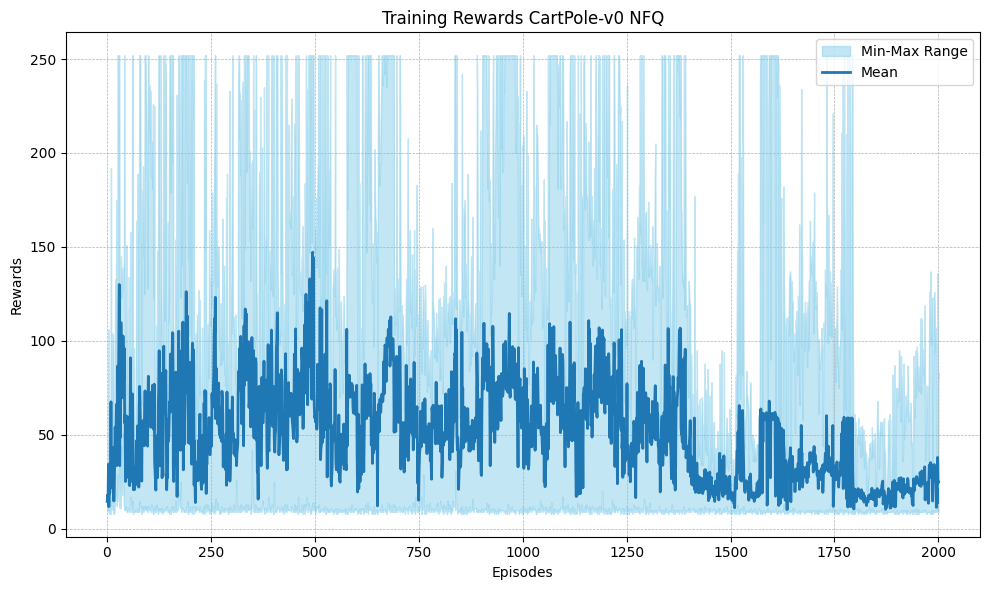

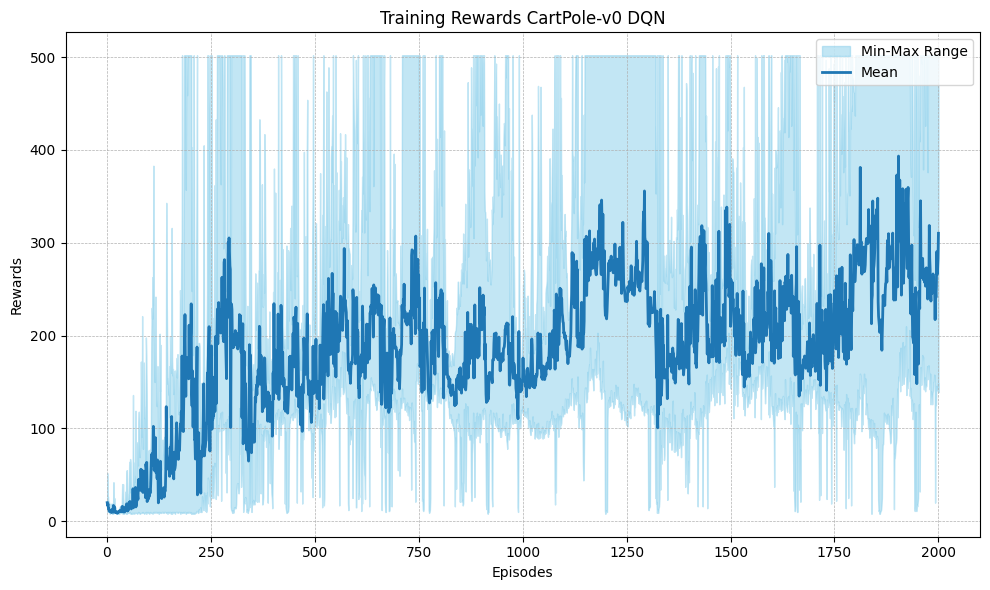

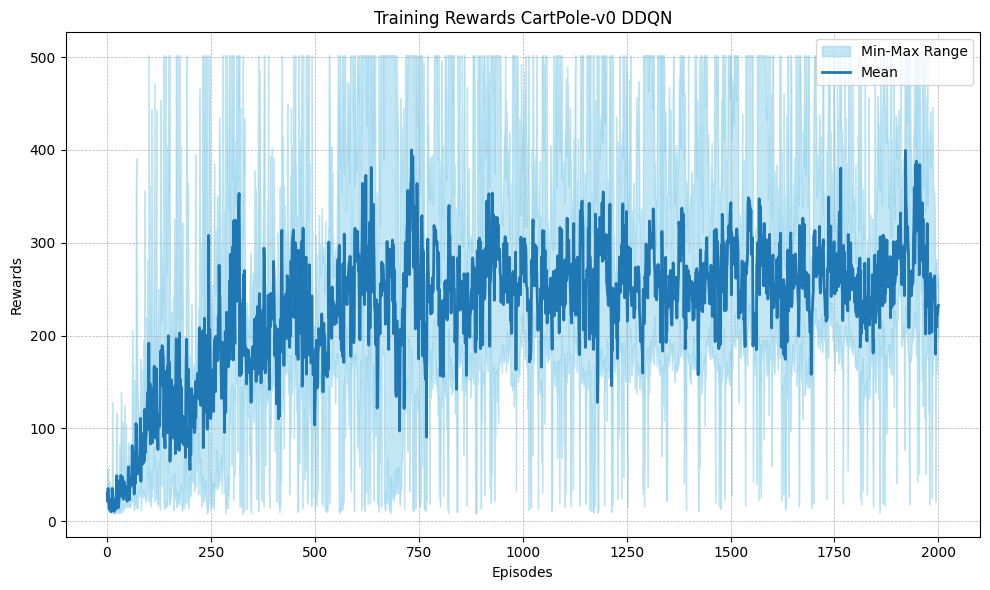

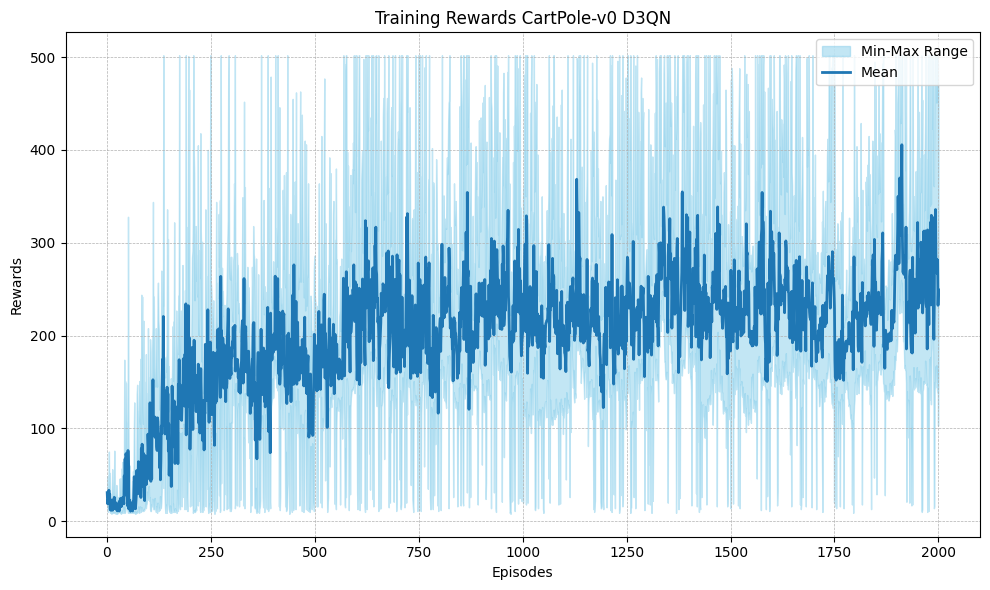

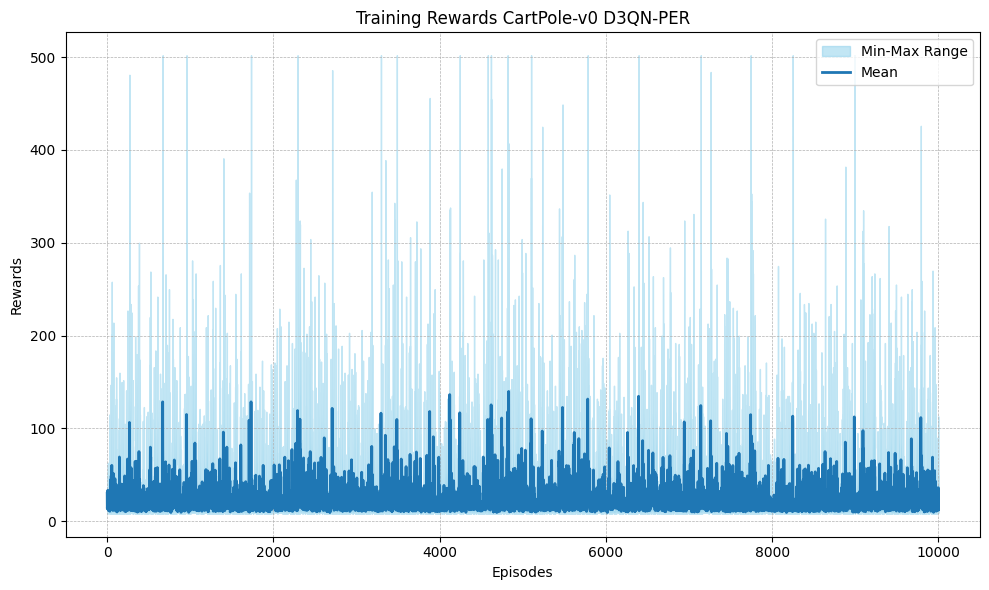

In [ ]:
runDeepValueBasedAgents(1)

# Question 2

/home/rajarshi/autogpt/SemEval/str/lib/python3.10/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.goal_position to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.goal_position` for environment variables or `env.get_wrapper_attr('goal_position')` that will search the reminding wrappers.
  logger.warn(


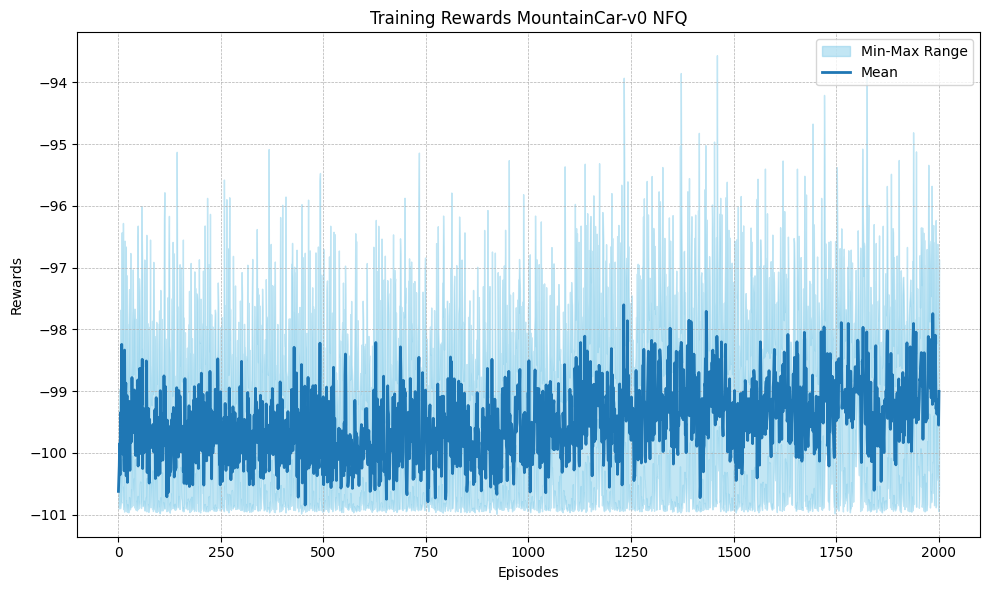

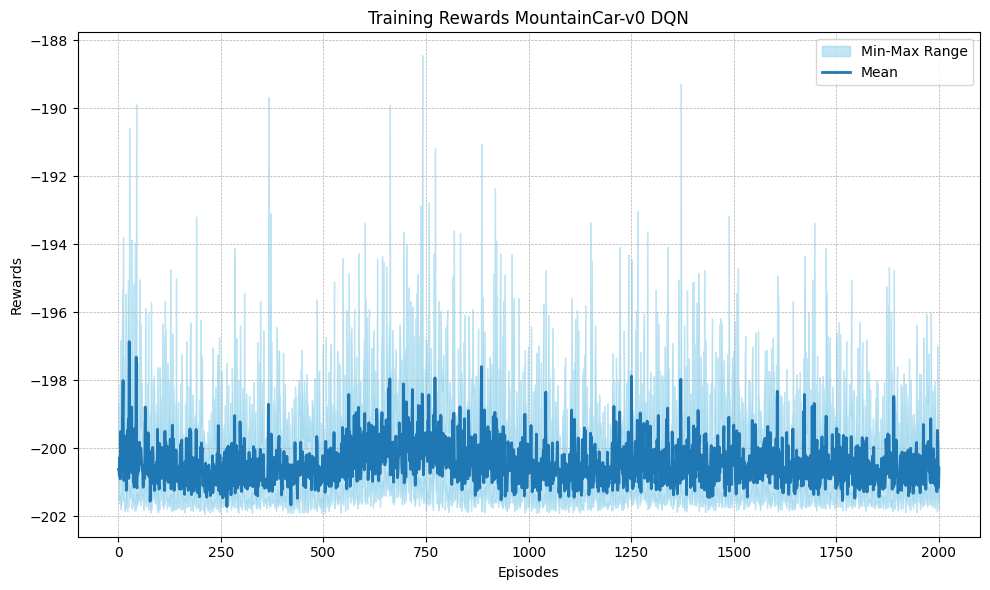

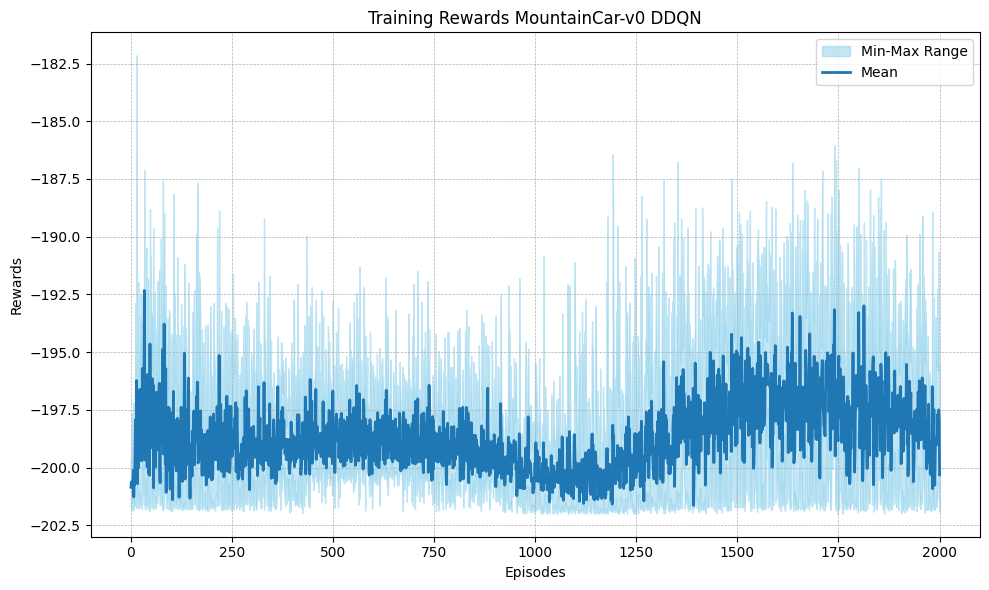

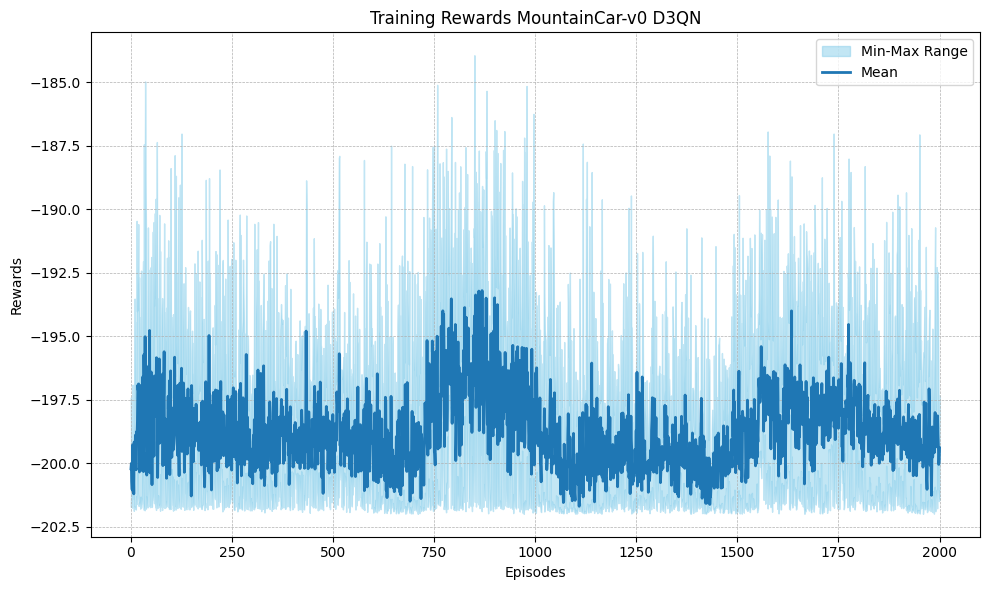

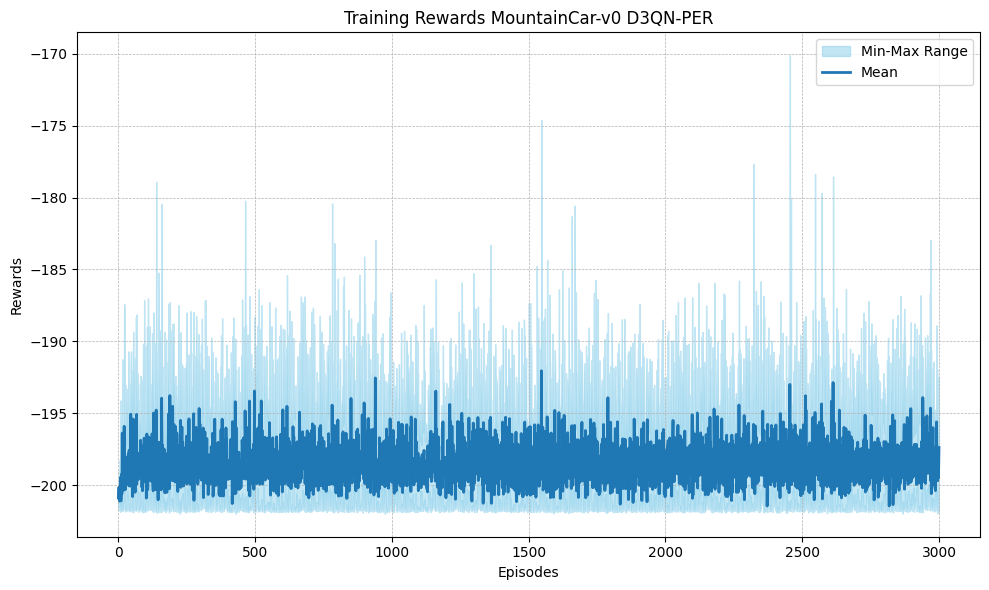

In [69]:
runDeepValueBasedAgents(2)

## Question 3

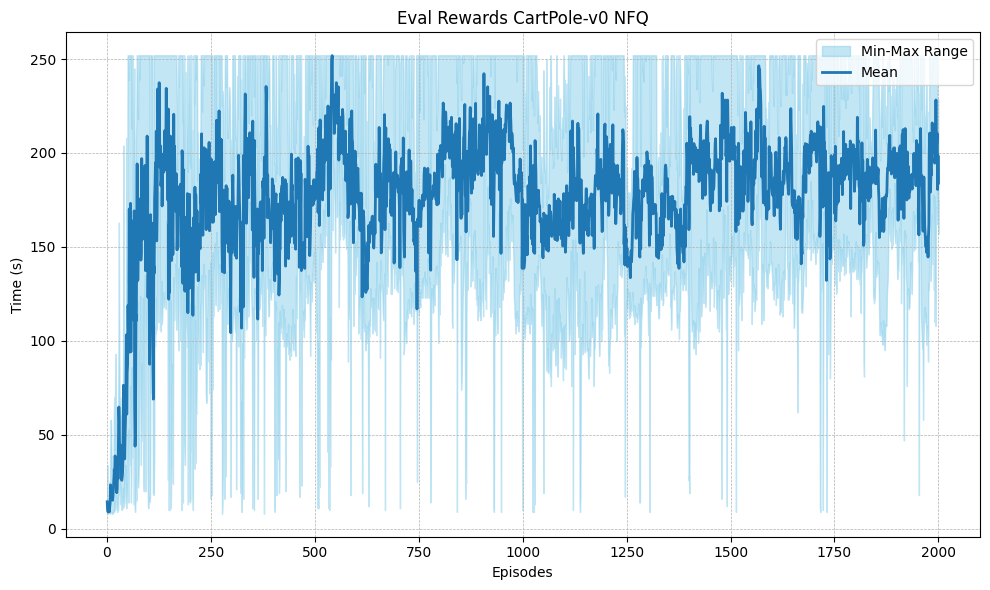

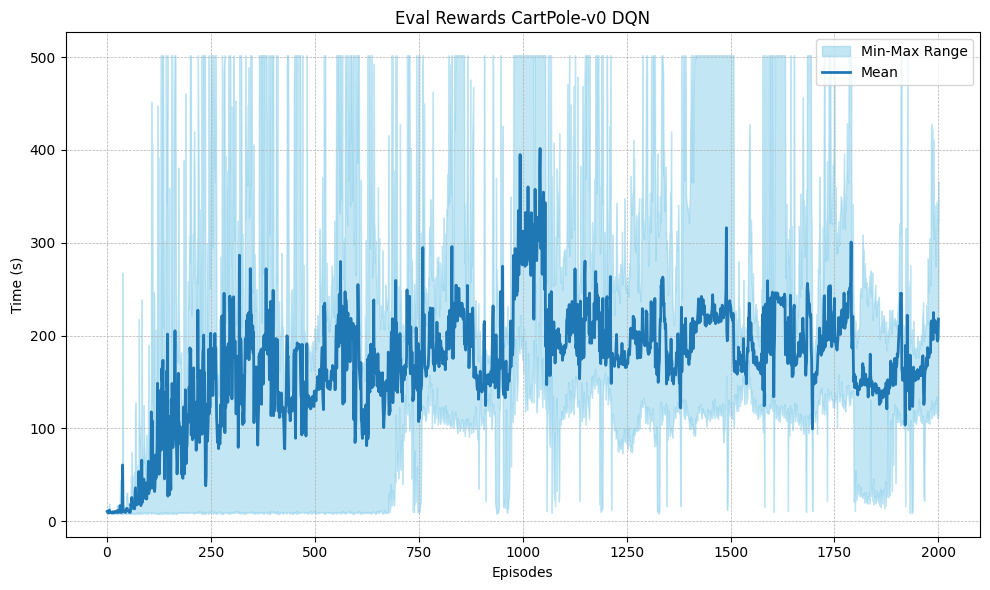

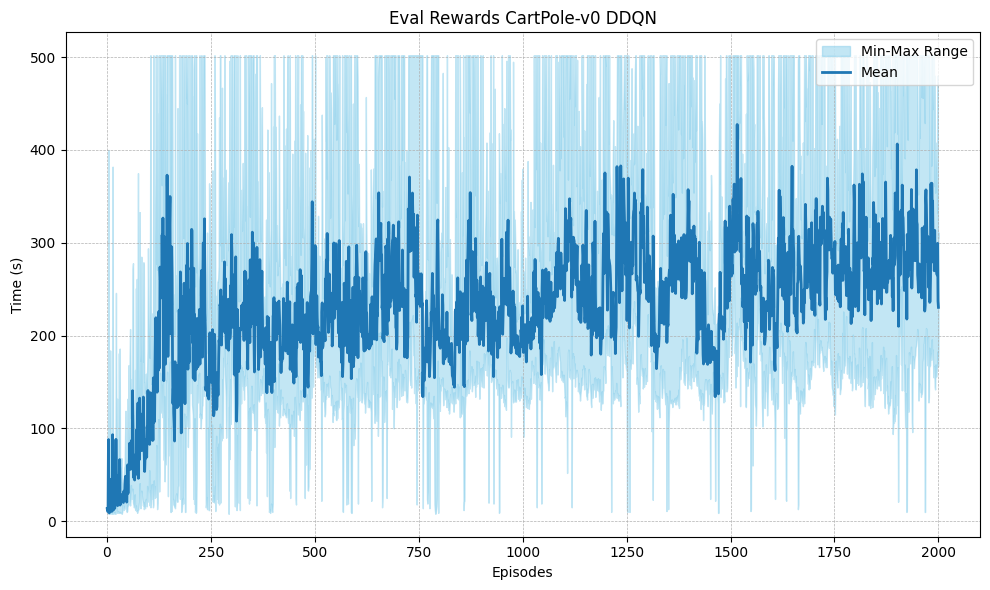

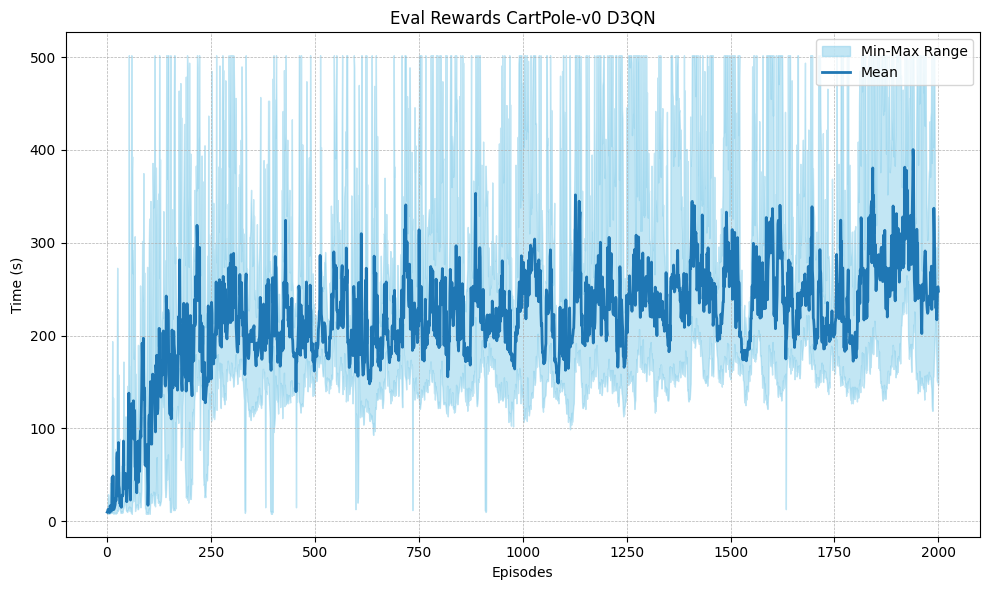

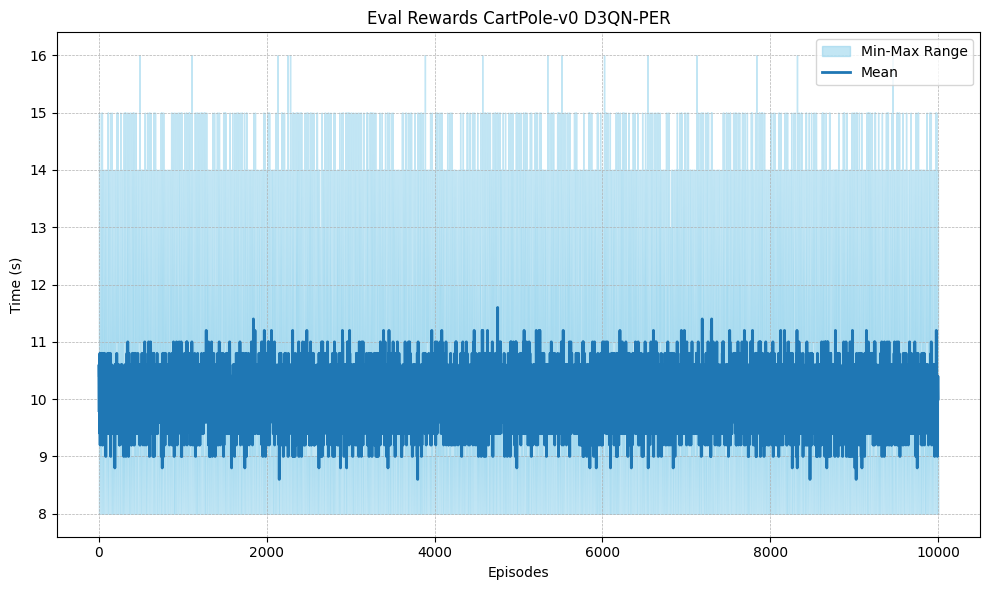

In [68]:
runDeepValueBasedAgents(3)

## Question 4

/home/rajarshi/autogpt/SemEval/str/lib/python3.10/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.goal_position to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.goal_position` for environment variables or `env.get_wrapper_attr('goal_position')` that will search the reminding wrappers.
  logger.warn(


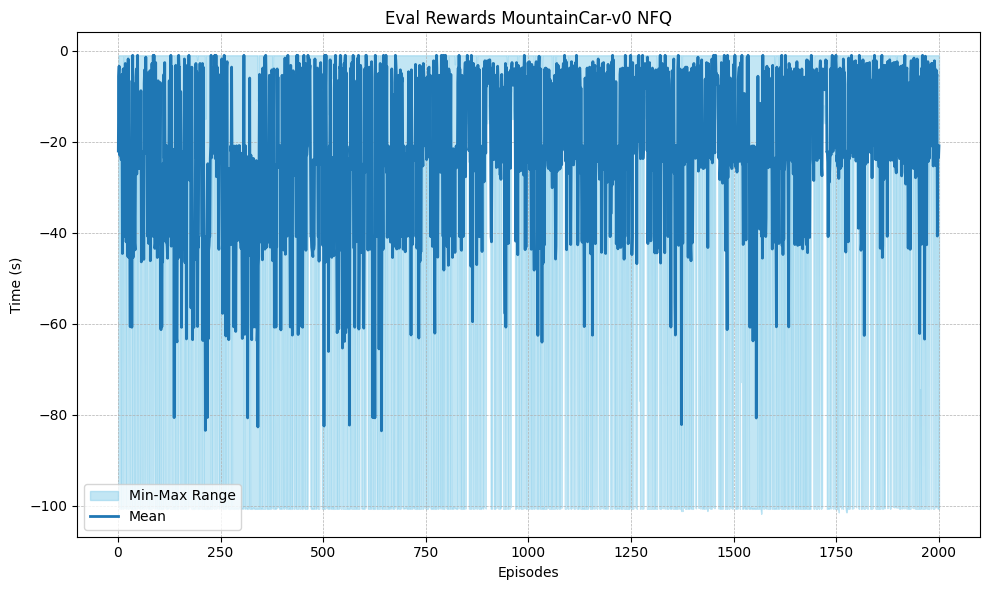

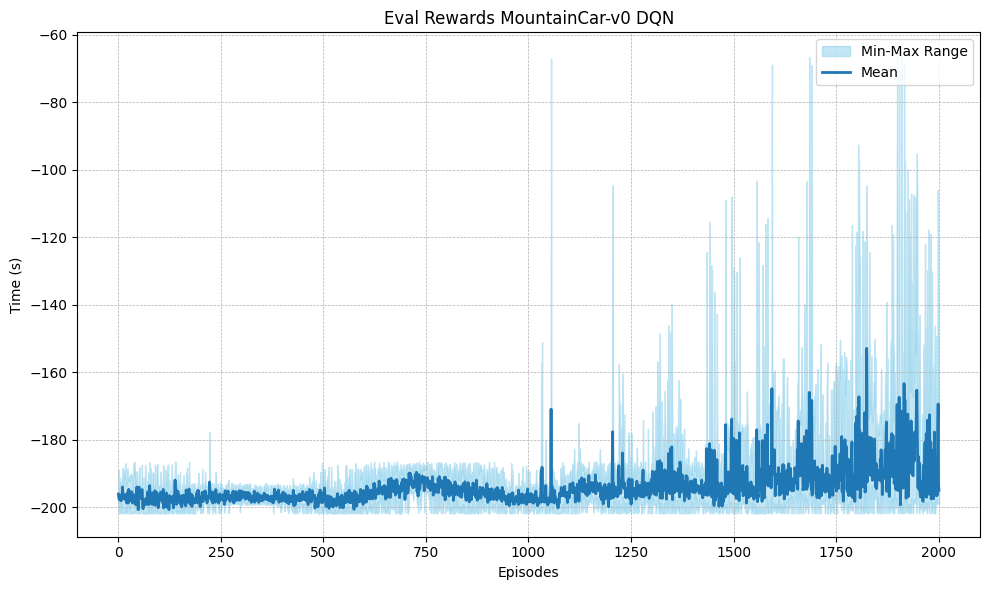

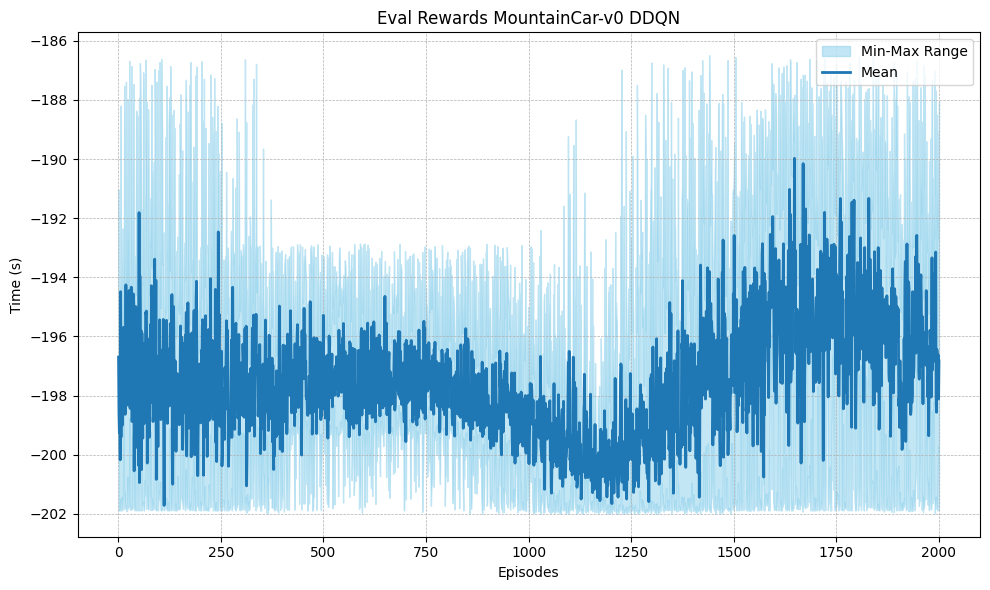

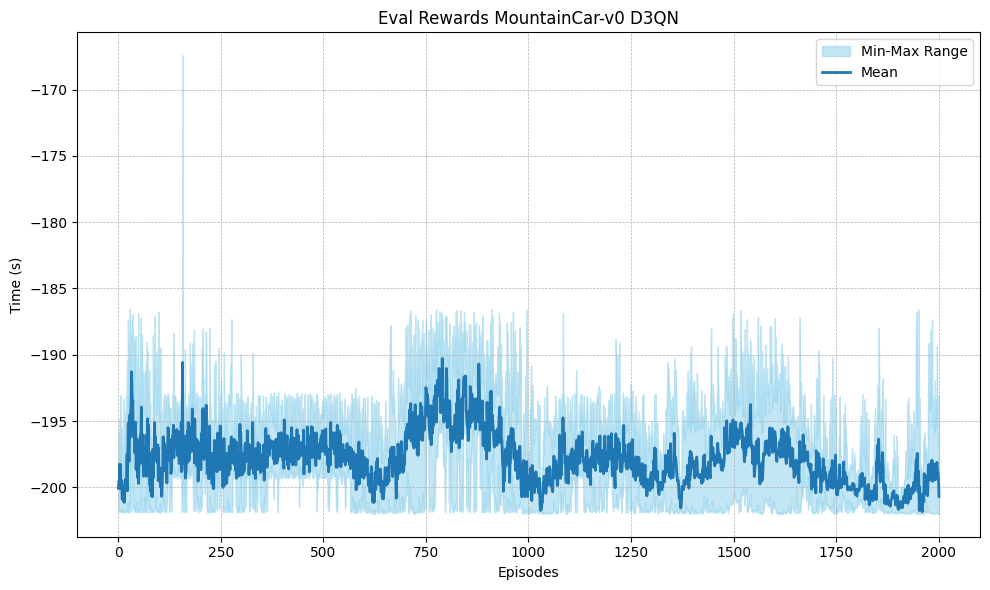

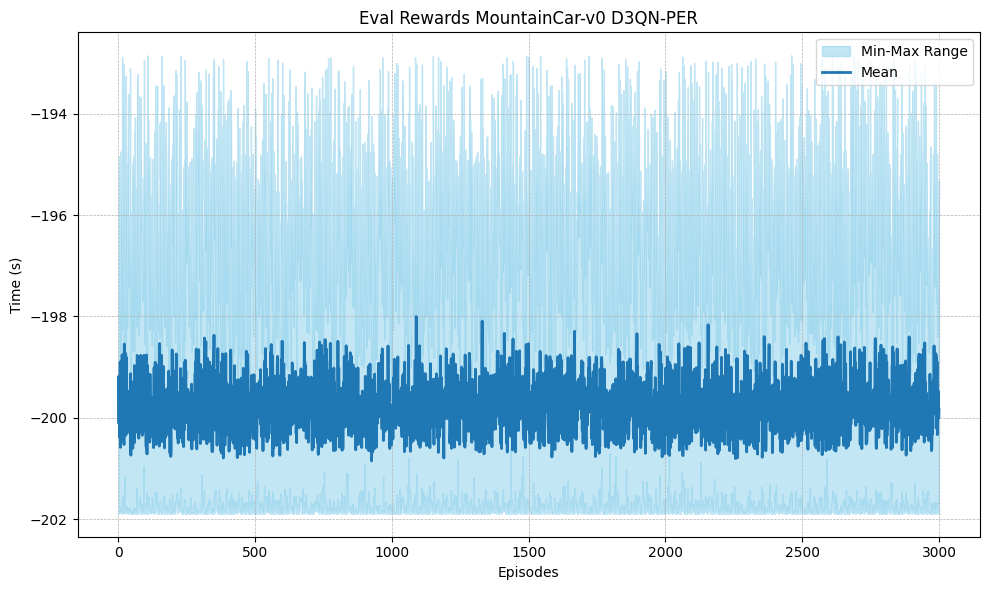

In [69]:
runDeepValueBasedAgents(4)

## Question 5

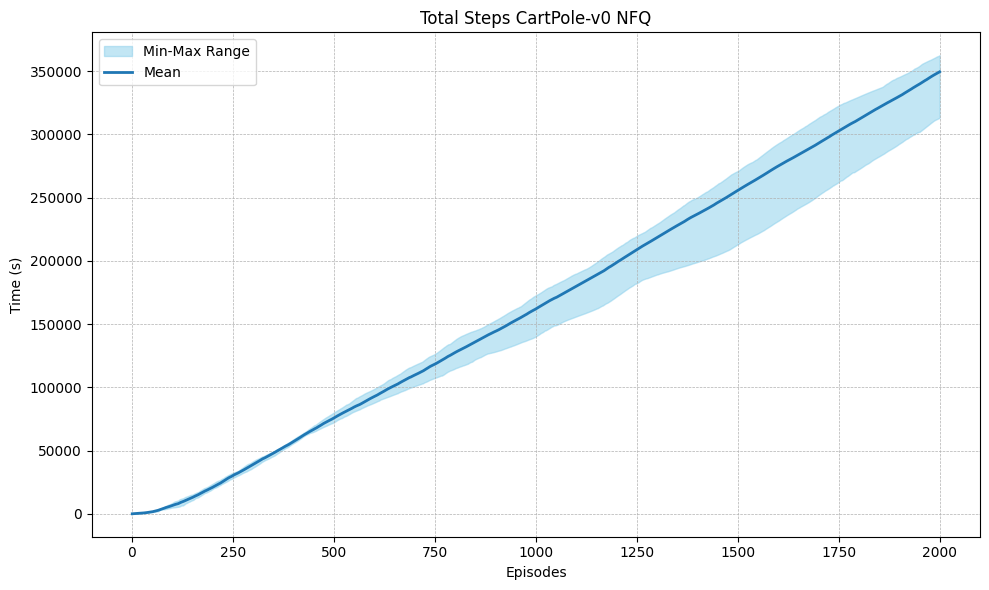

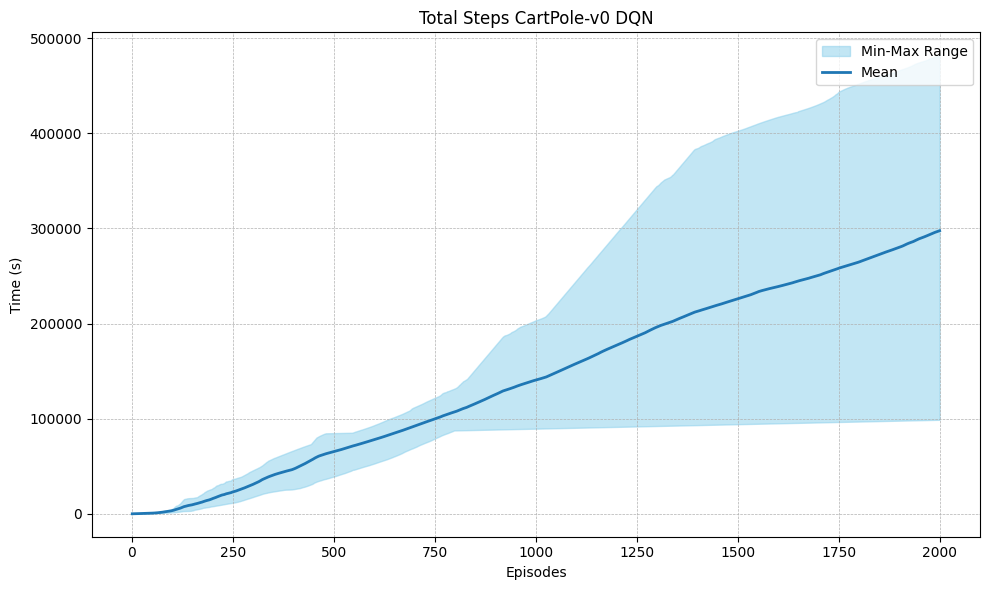

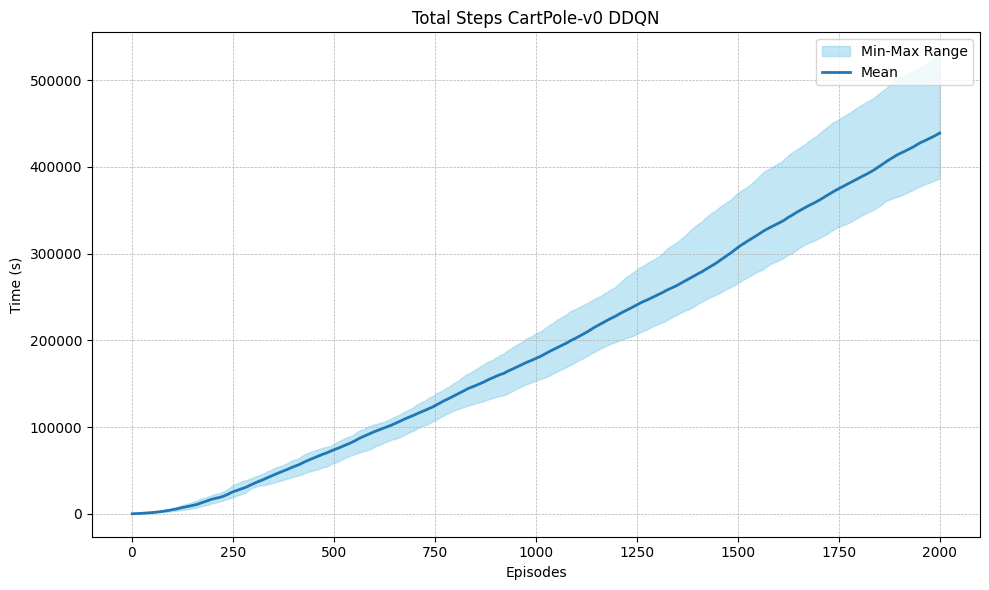

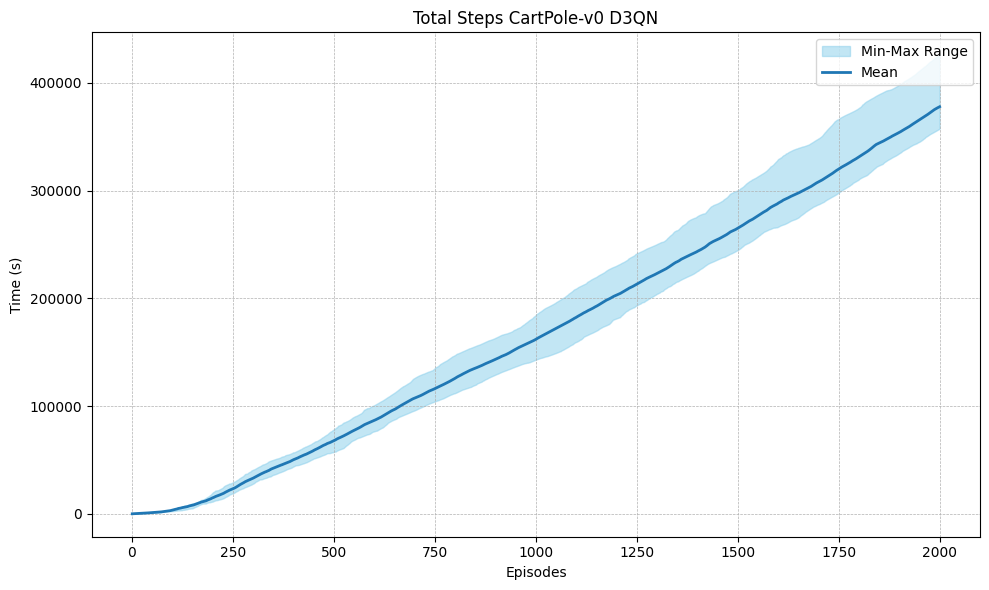

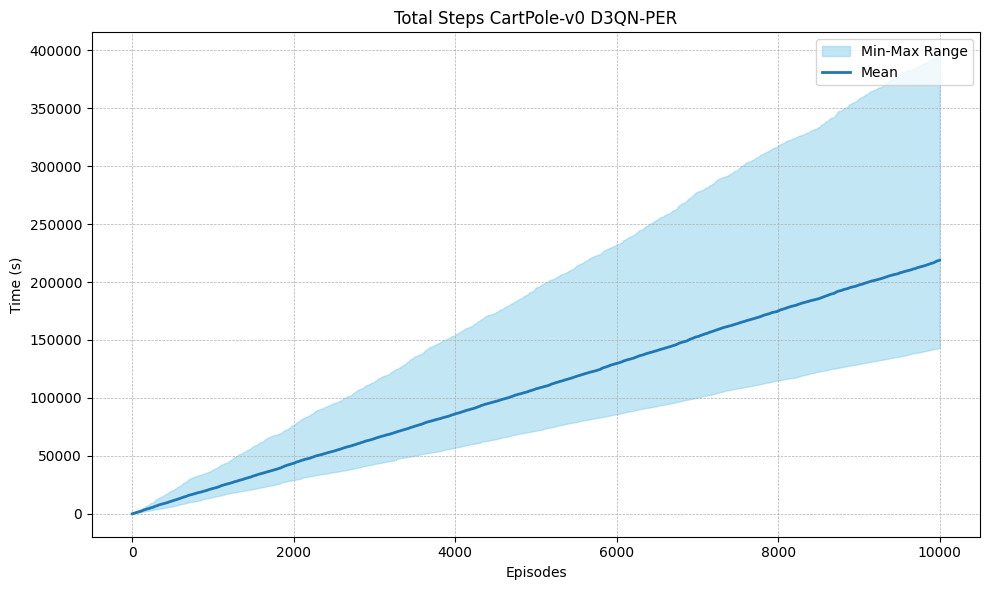

In [70]:
runDeepValueBasedAgents(5)

## Question 6

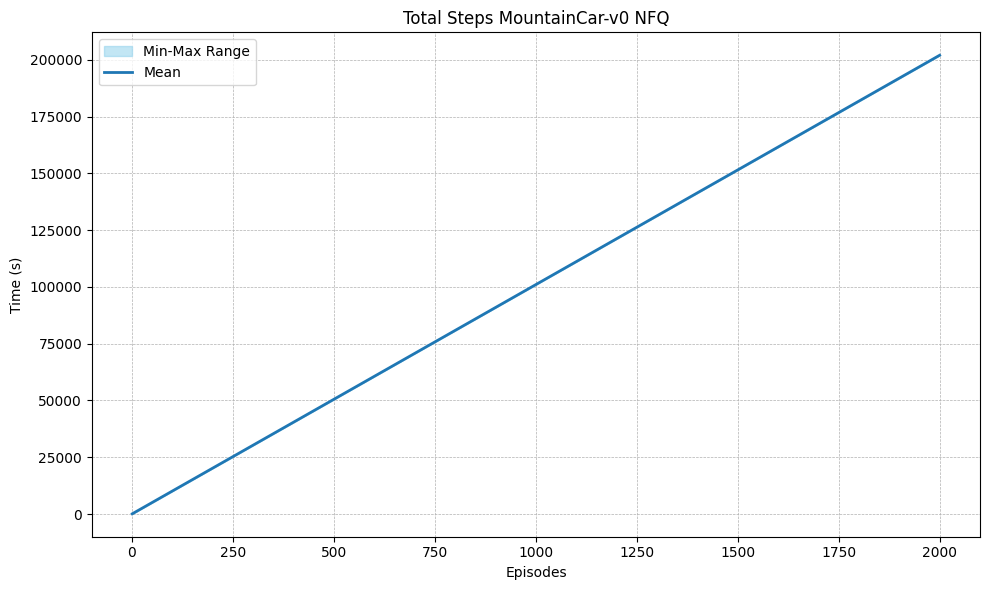

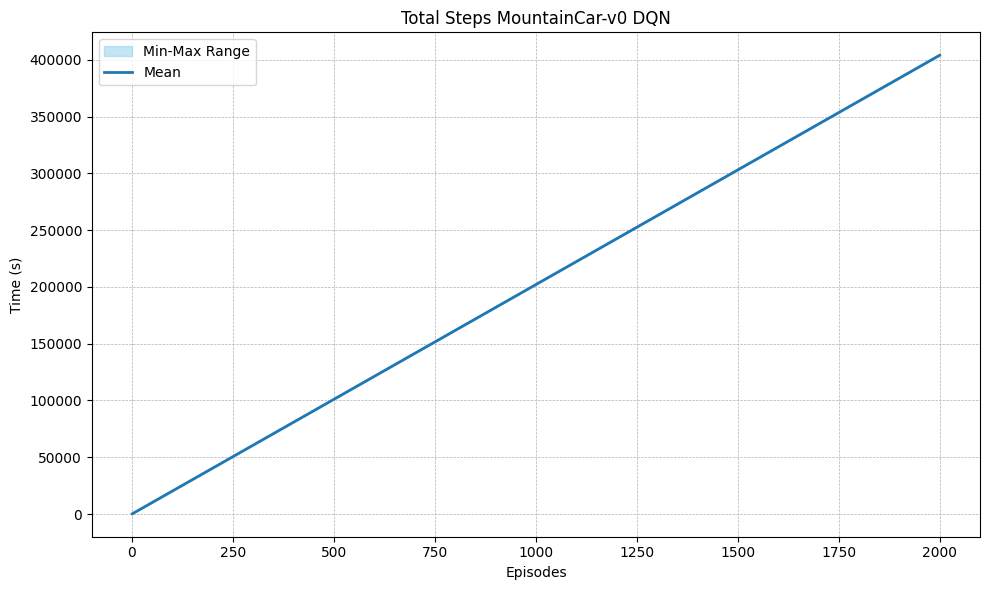

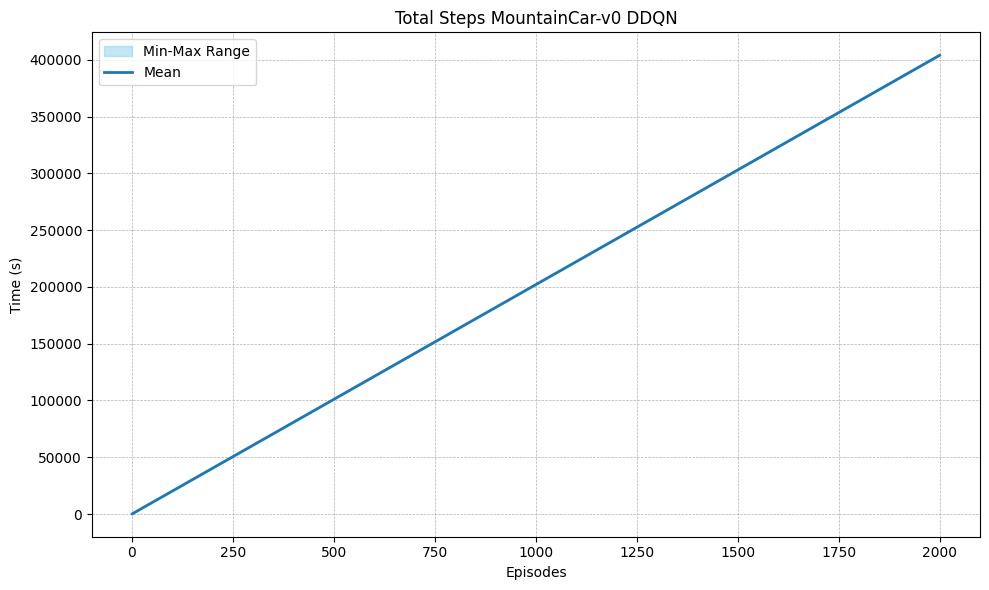

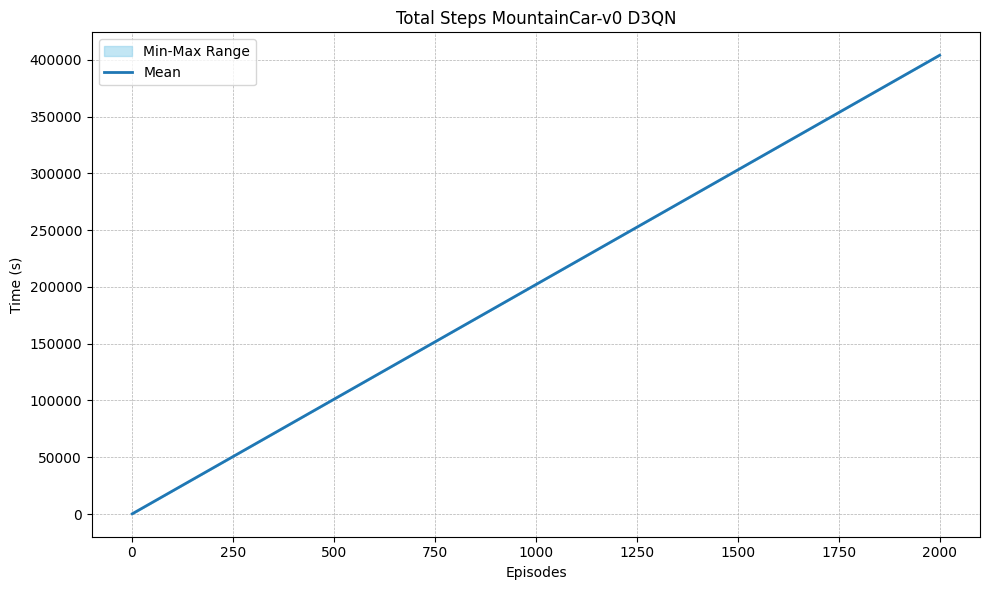

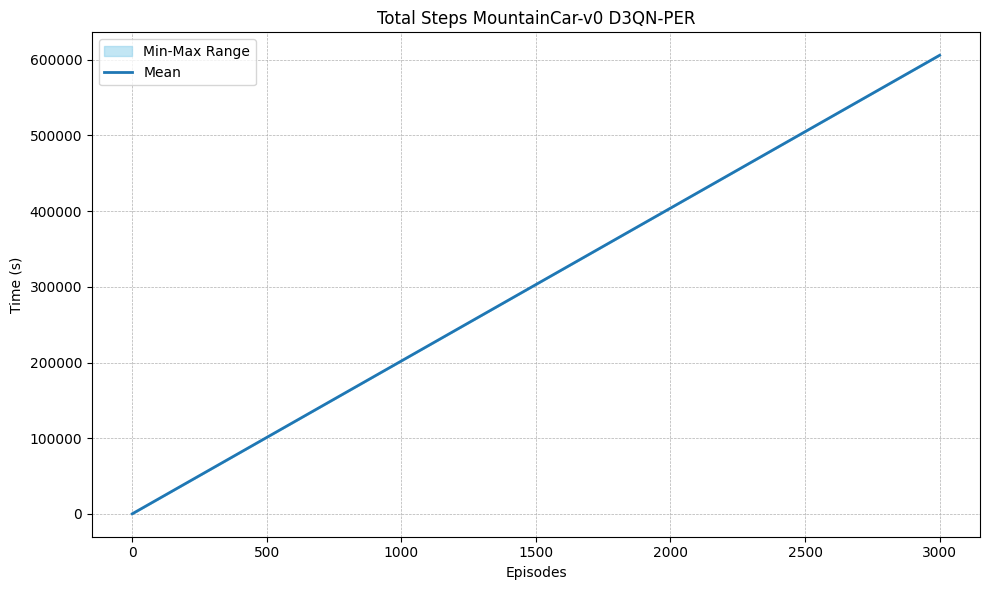

In [71]:
runDeepValueBasedAgents(6)

## Queestion 7

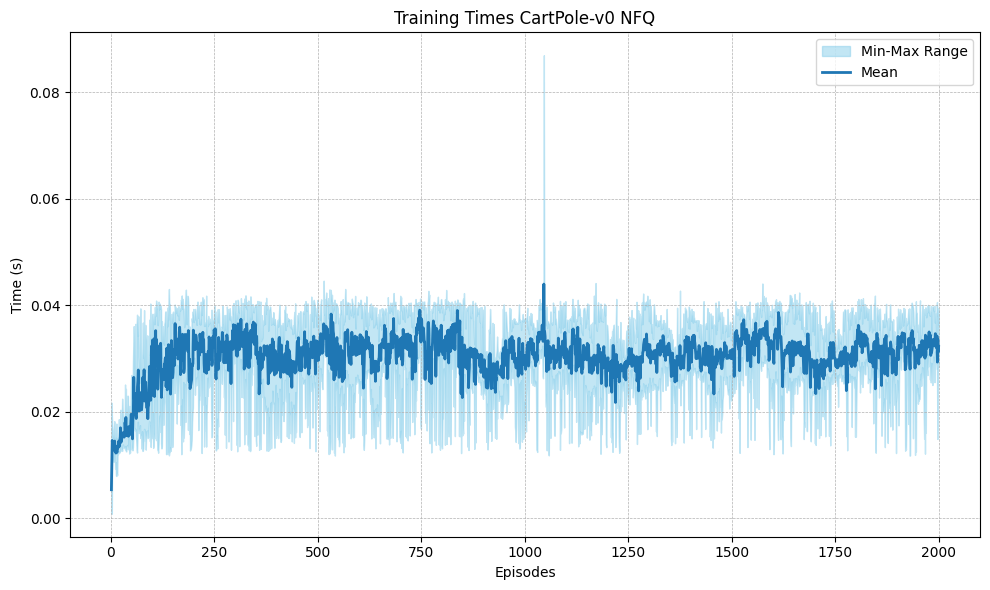

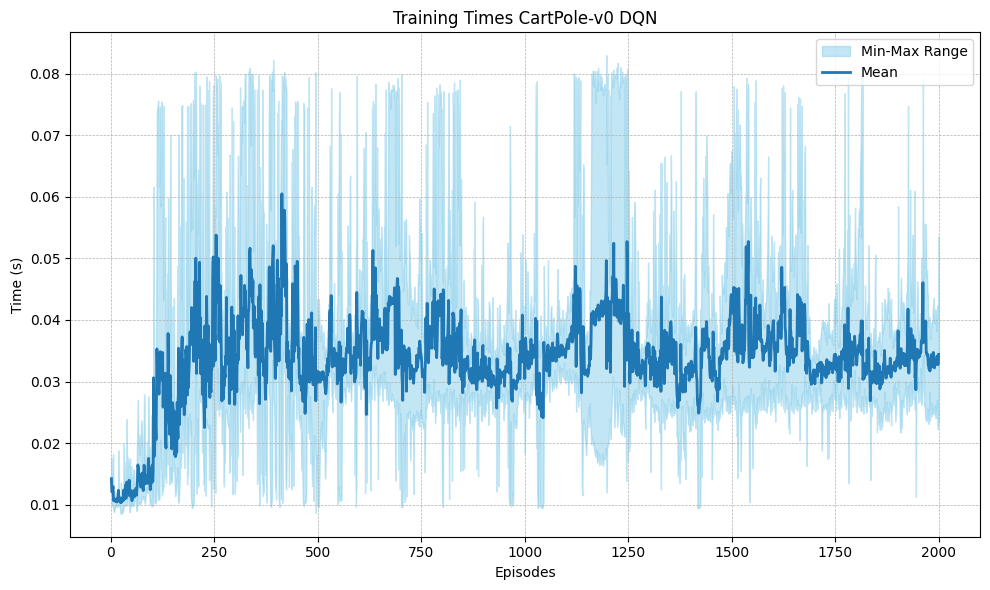

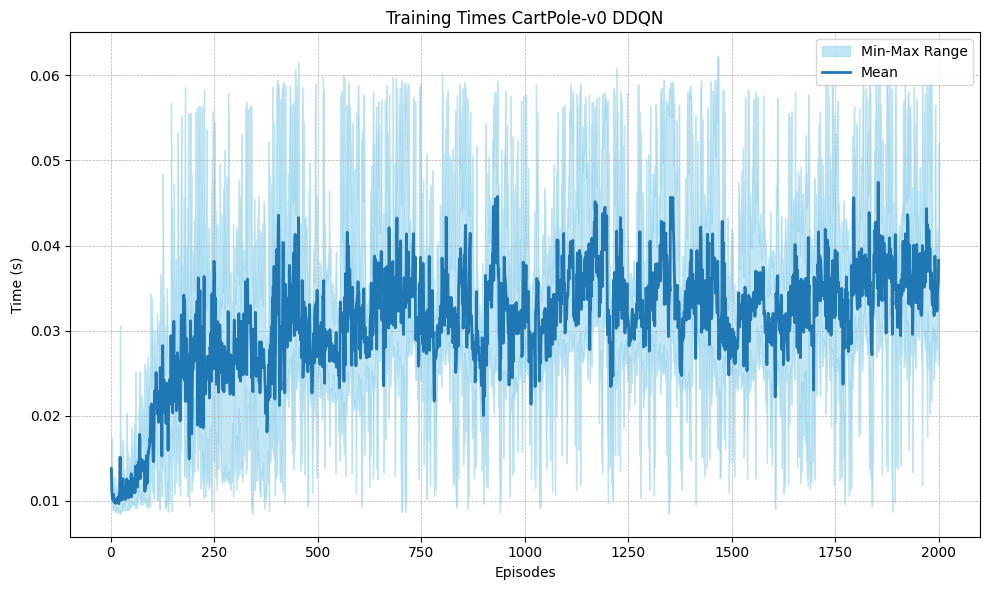

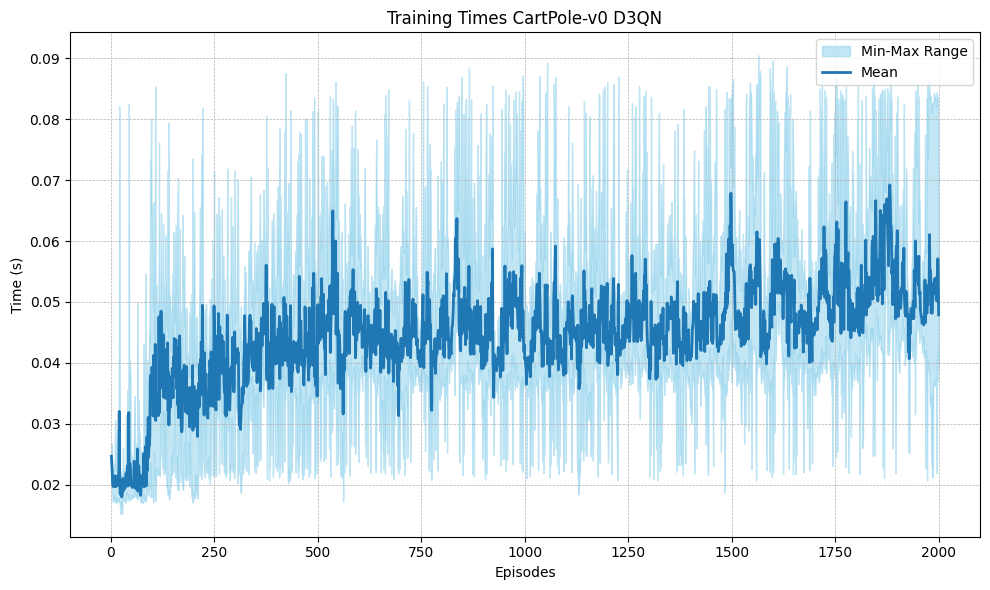

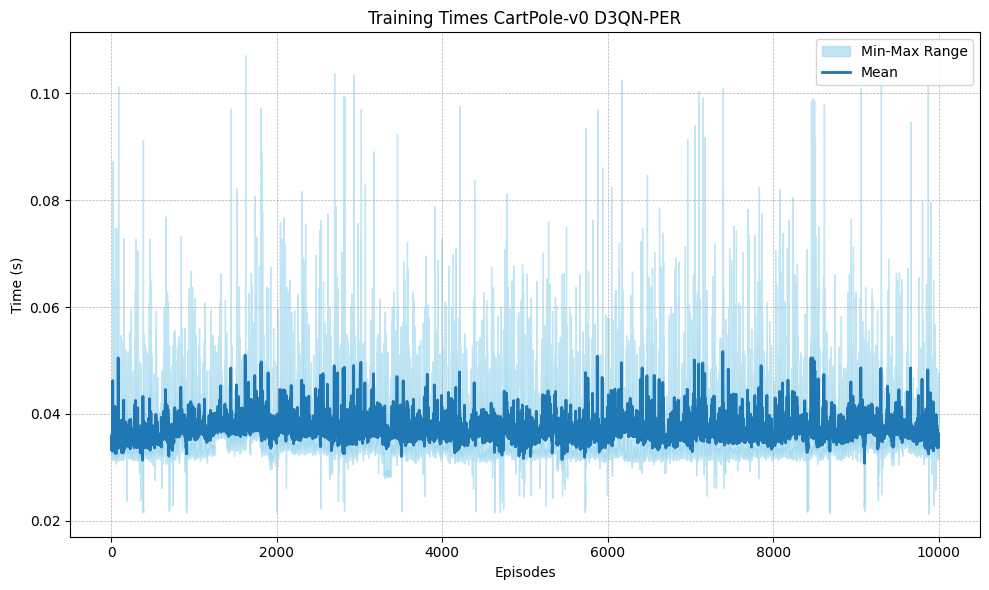

In [72]:
runDeepValueBasedAgents(7)

## Question 8

/home/rajarshi/autogpt/SemEval/str/lib/python3.10/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.goal_position to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.goal_position` for environment variables or `env.get_wrapper_attr('goal_position')` that will search the reminding wrappers.
  logger.warn(


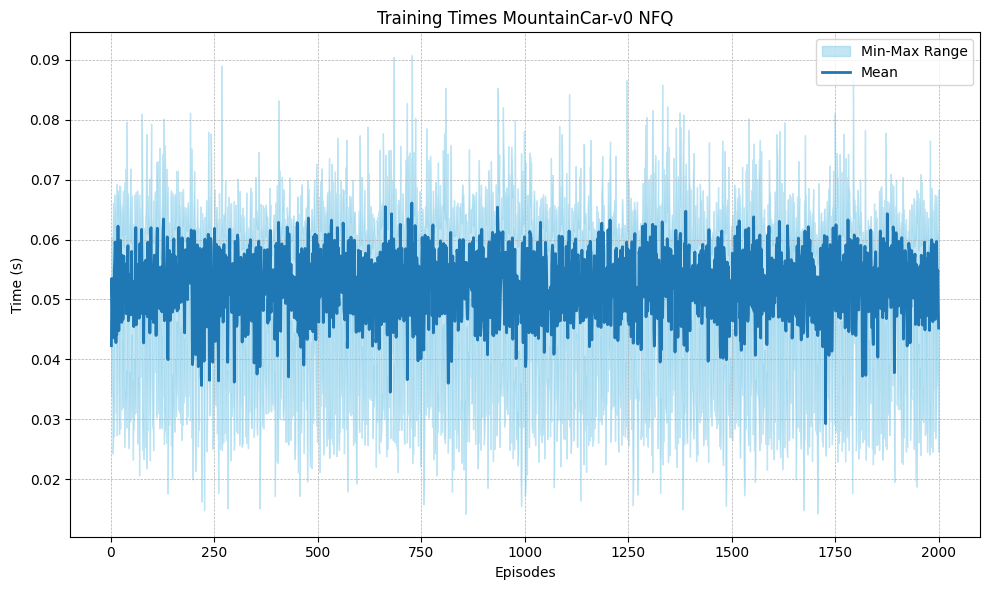

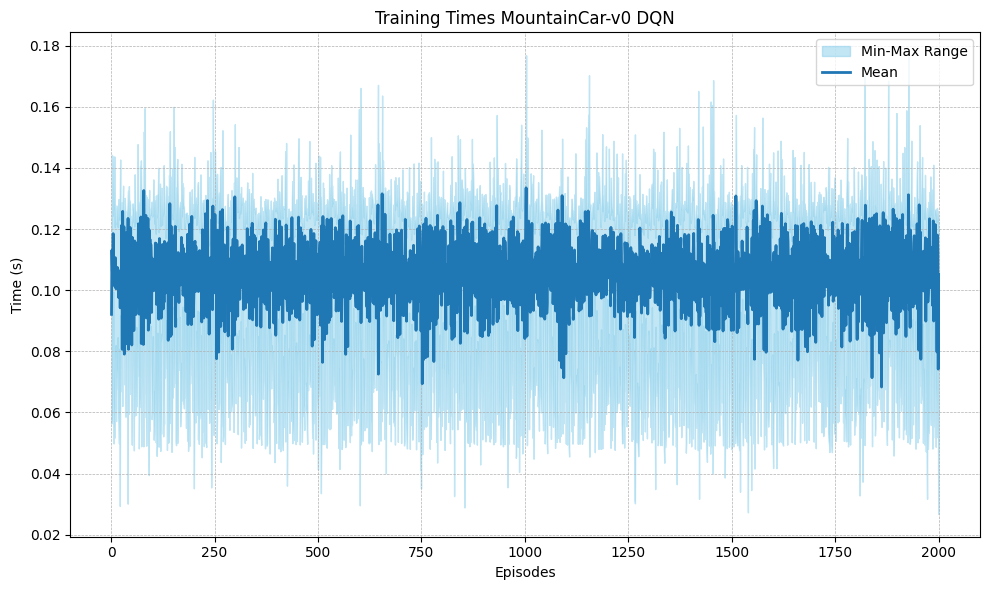

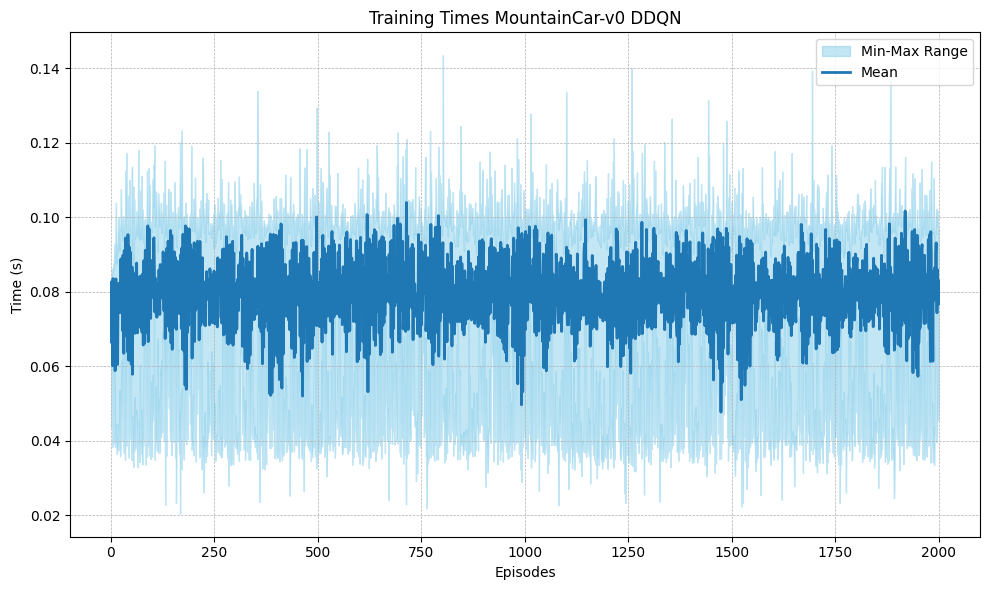

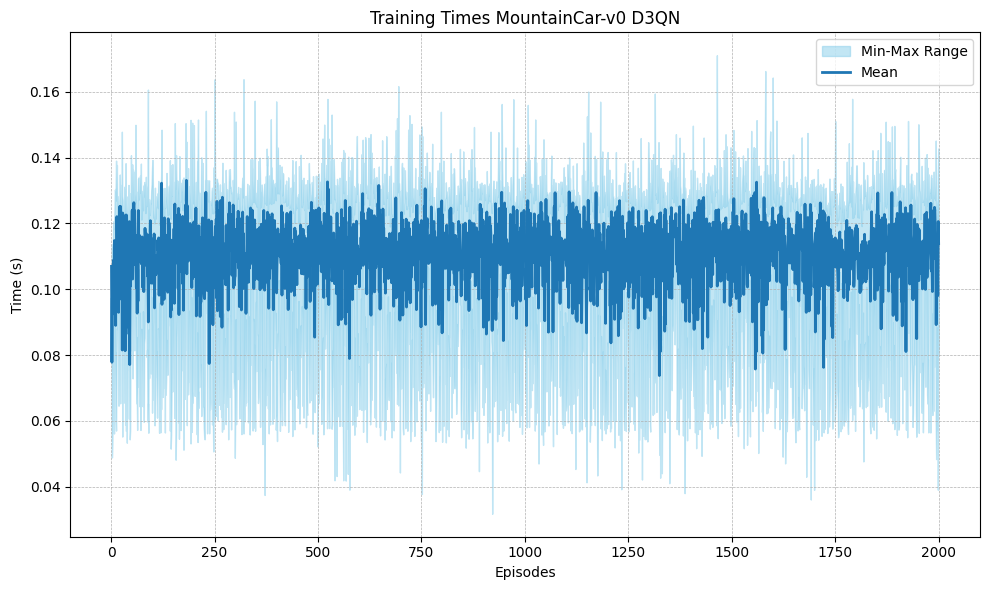

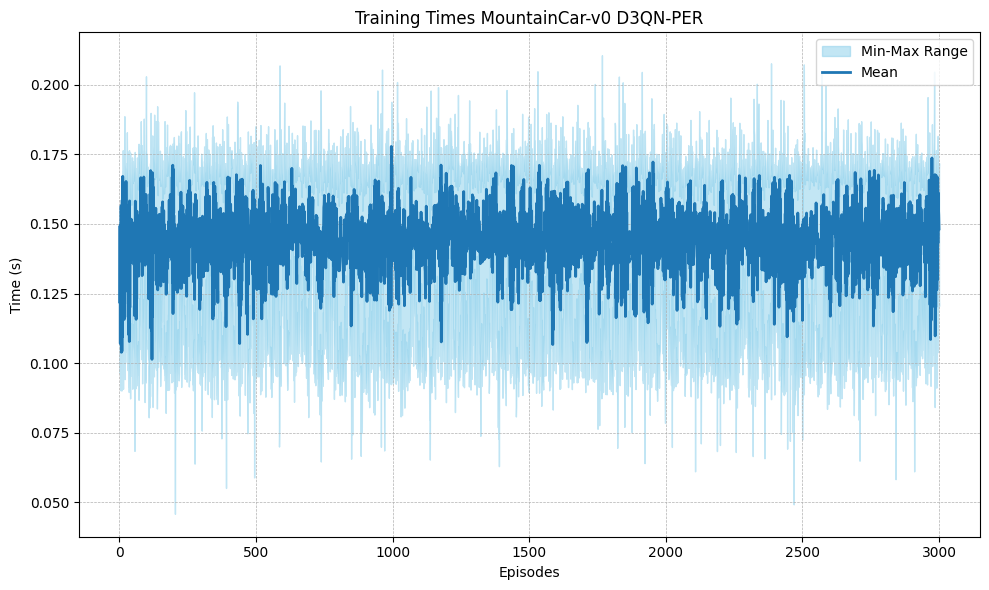

In [75]:
runDeepValueBasedAgents(8)

## Question 9

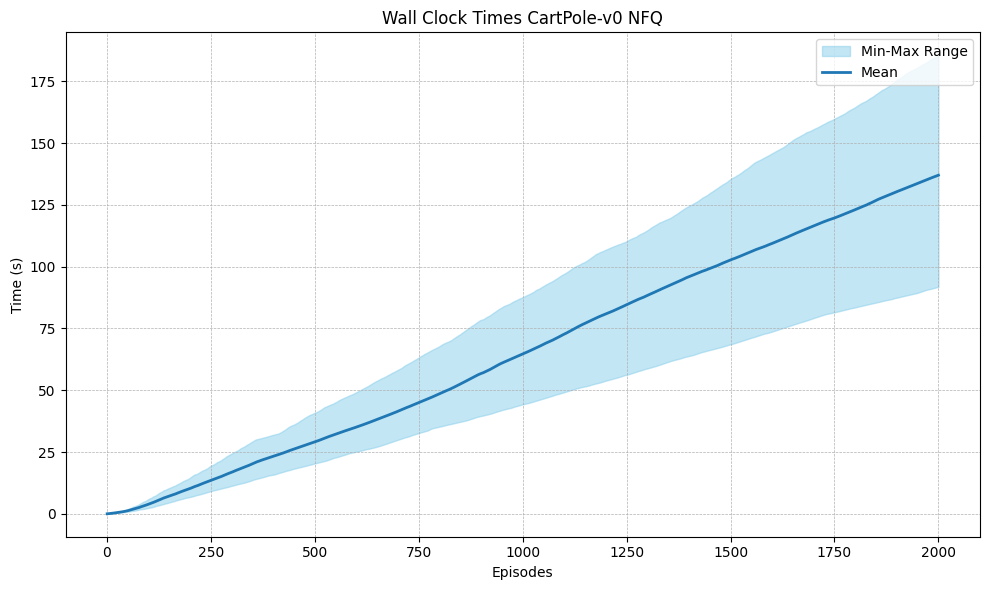

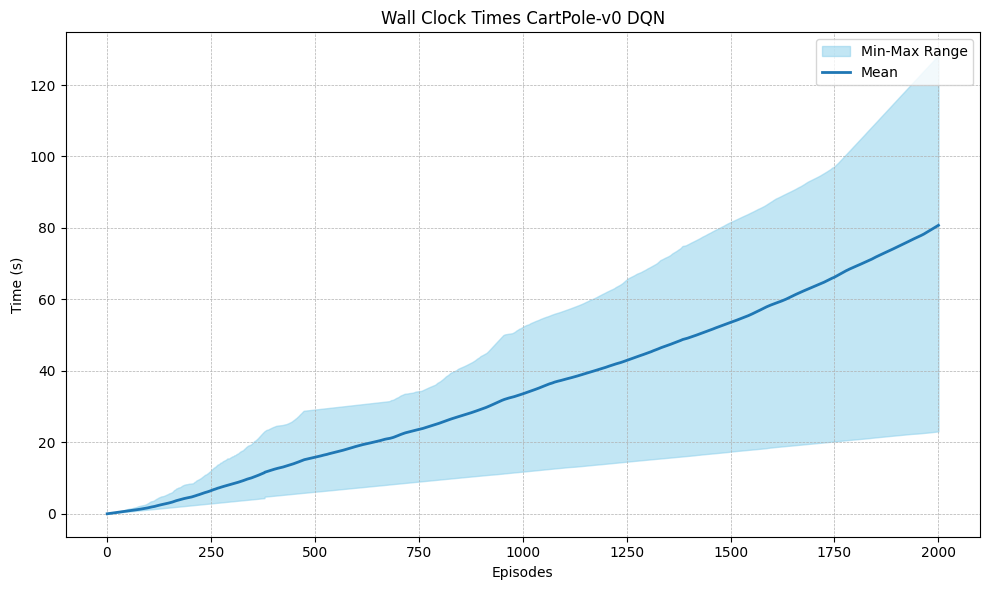

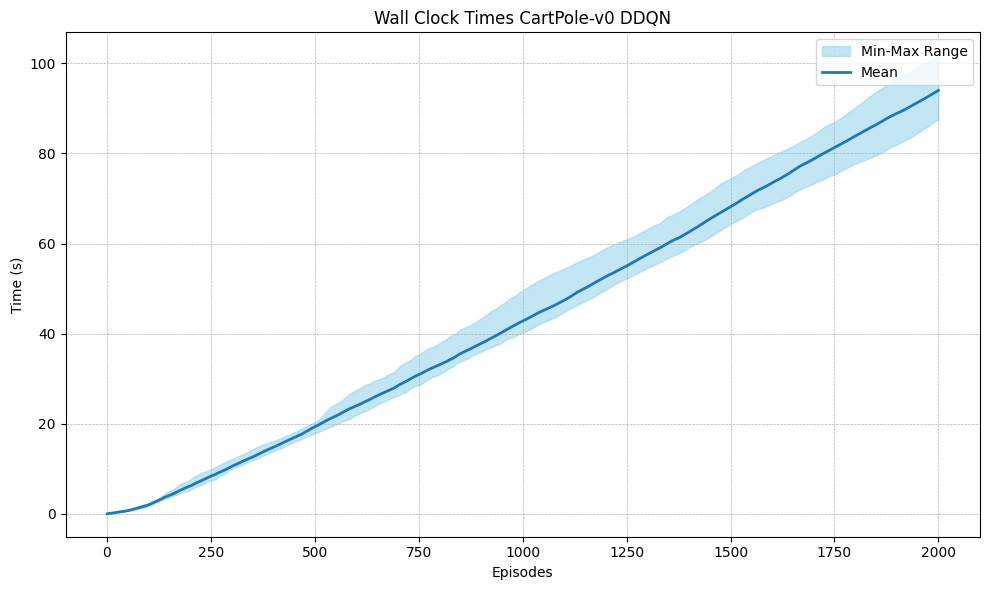

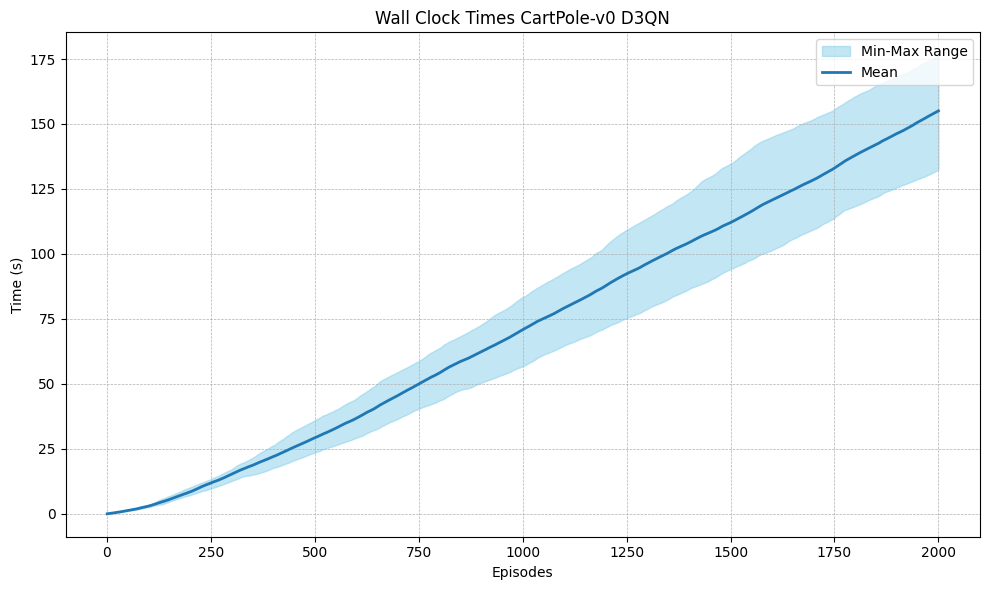

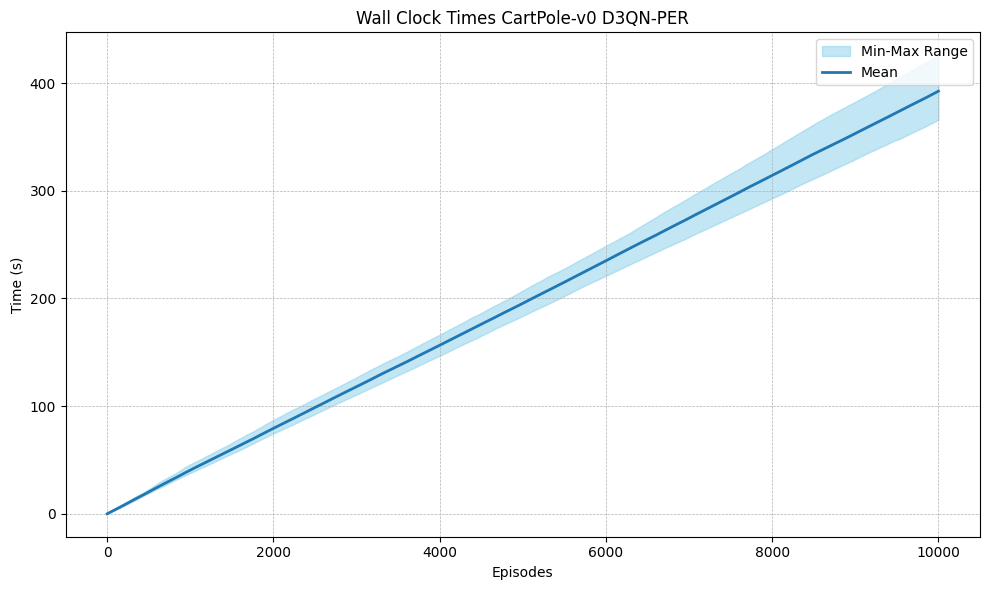

In [156]:
runDeepValueBasedAgents(9)

## Question 10

/home/rajarshi/autogpt/SemEval/str/lib/python3.10/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.goal_position to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.goal_position` for environment variables or `env.get_wrapper_attr('goal_position')` that will search the reminding wrappers.
  logger.warn(


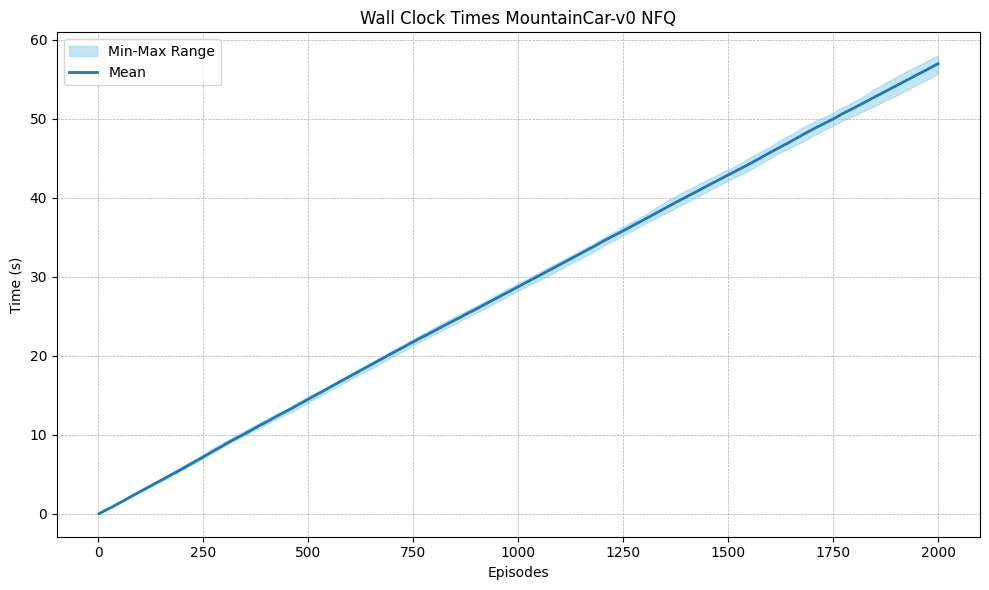

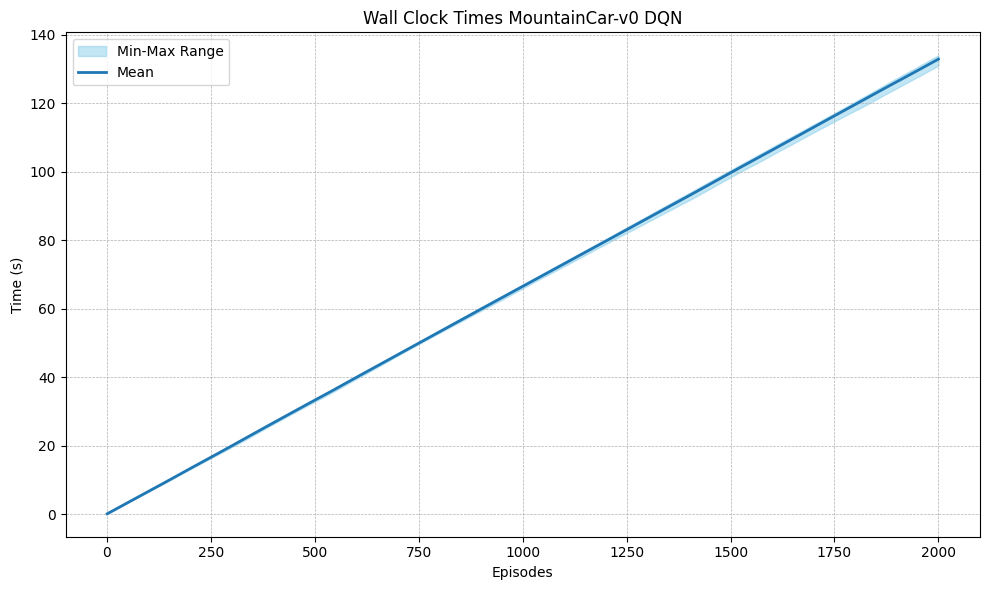

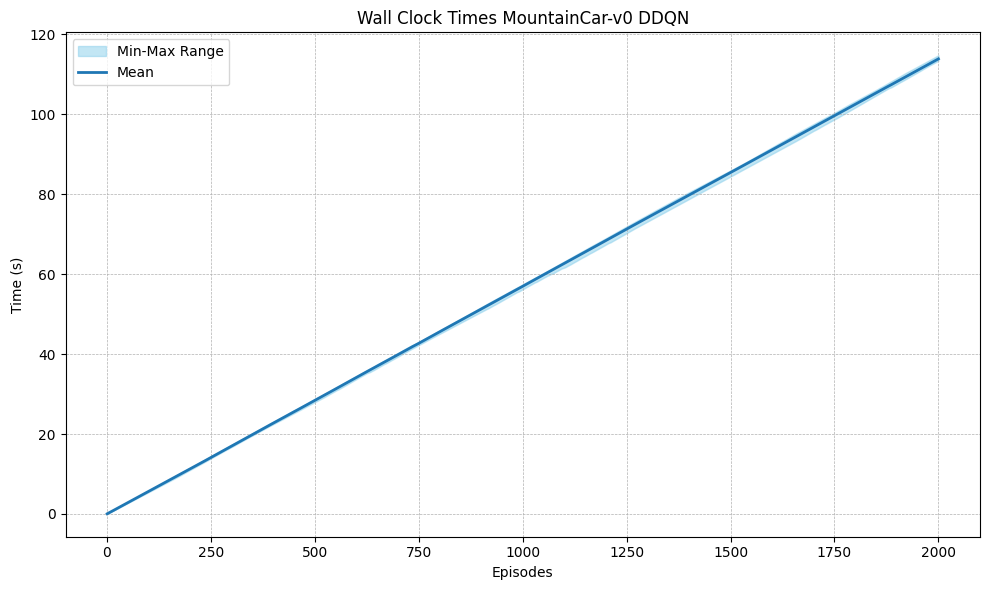

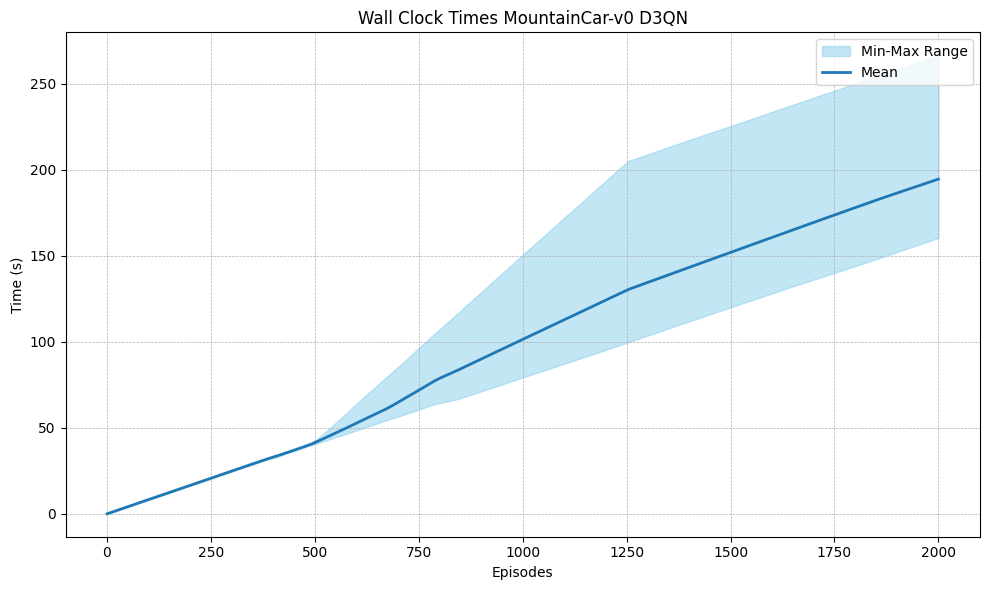

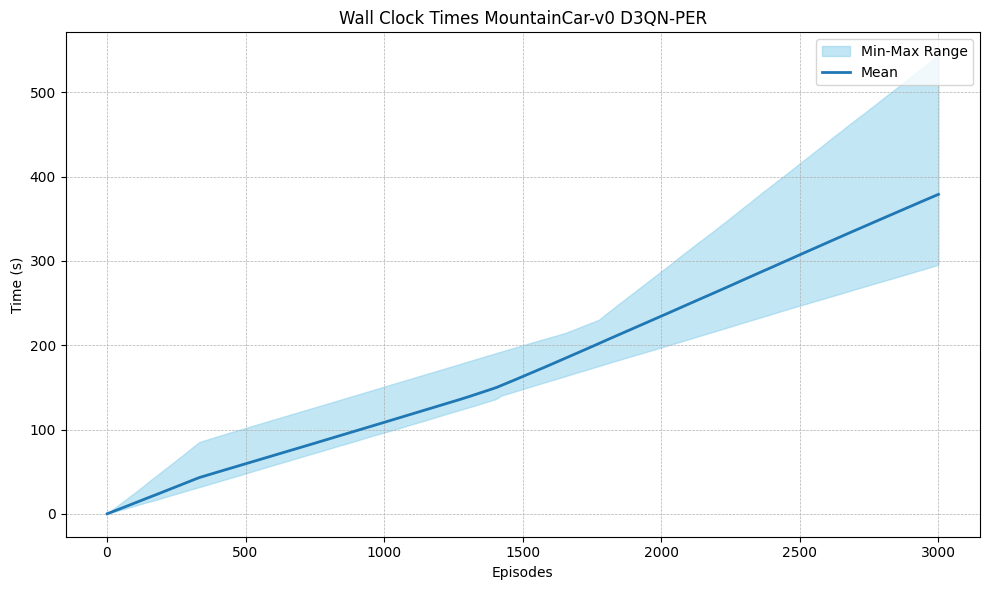

In [157]:
runDeepValueBasedAgents(10)

In [146]:
def runDeepPolicyBasedAgents(question_no):
    # this function will initialize 5 different instances of the env (using different seeds), run all the agents
    # over these different instances. Collects results and generate the plots state above.
    # generate your plots in the cells below
    # write the answers to part 11, 12 and 13 in the cells below the plot-cells.
    if question_no == 1: # train rewards for cartpole
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
    
    elif question_no == 2: # train rewards for mountain car
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = True, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
        
    elif question_no == 3: # eval rewards for cartpole
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = True)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = True)

    elif question_no == 4: # eval rewards for mountain car
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = True)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = True)
    
    elif question_no == 5: # total steps for cartpole
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = True, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = True, 
                plot_eval_rewards = False)
    
    elif question_no == 6: # total steps for mountain-car
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = True, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = False,
                plot_total_steps = True, 
                plot_eval_rewards = False)
    
    elif question_no == 7: # train times for cartpole
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = True, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = True, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
        
    elif question_no == 8: # train times for mountain-car
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = True, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = True, 
                plot_wall_clock_times = False,
                plot_total_steps = False, 
                plot_eval_rewards = False)
    
    elif question_no == 9:
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = True,
                plot_total_steps = False, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env1, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = True,
                plot_total_steps = False, 
                plot_eval_rewards = False)
    
    elif question_no == 10:
        
        plot_stats_reinforce(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = True,
                plot_total_steps = False, 
                plot_eval_rewards = False)

        plot_stats_vpg(num_instances = 5,
               train_episodes = 1000,
                chosen_env = env2, 
                plot_train_rewards = False, 
                plot_train_times = False, 
                plot_wall_clock_times = True,
                plot_total_steps = False, 
                plot_eval_rewards = False)
    

## Question 1

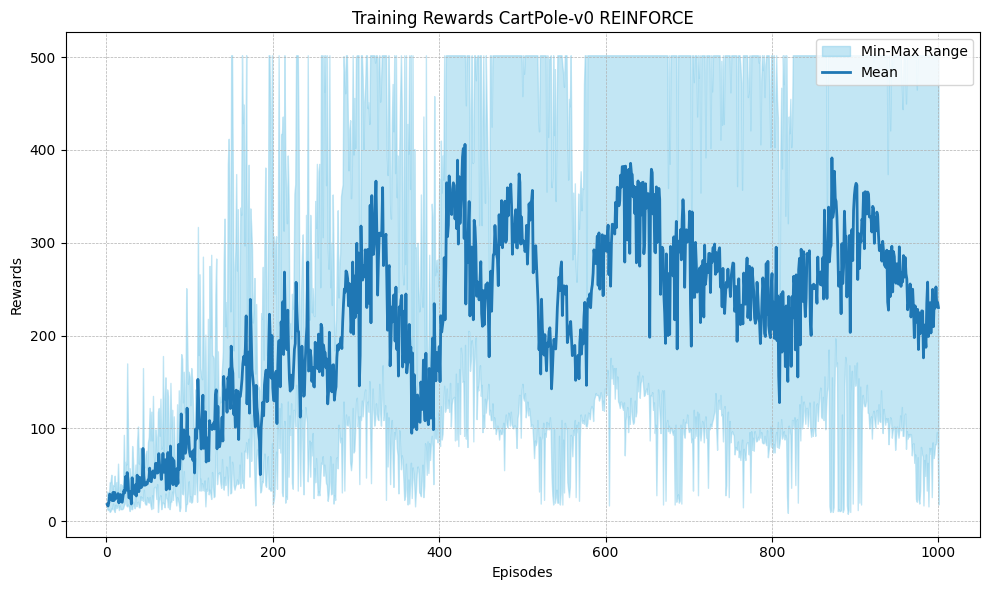

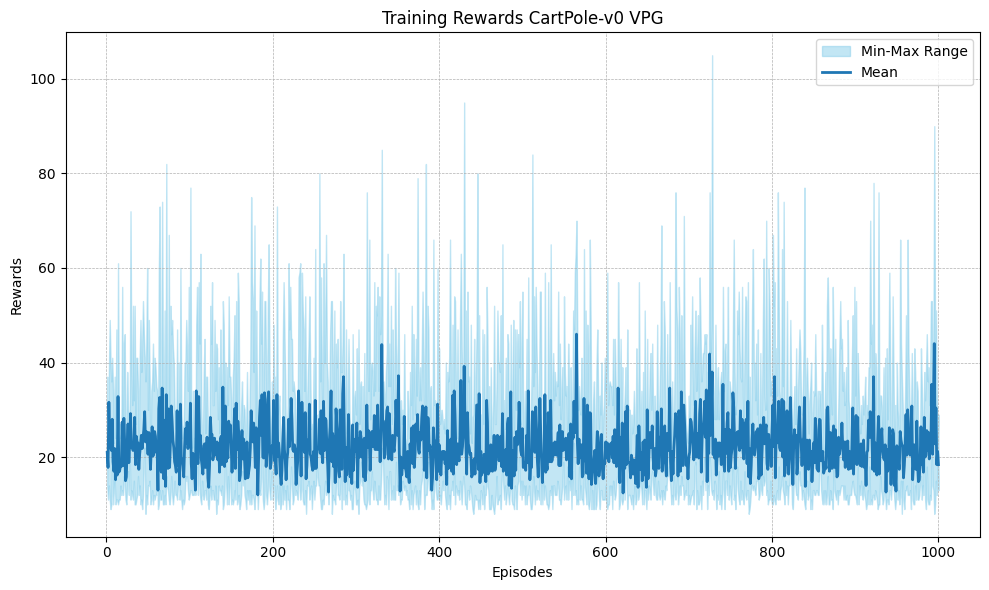

In [136]:
runDeepPolicyBasedAgents(1)

## Question 2

/home/rajarshi/autogpt/SemEval/str/lib/python3.10/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.goal_position to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.goal_position` for environment variables or `env.get_wrapper_attr('goal_position')` that will search the reminding wrappers.
  logger.warn(


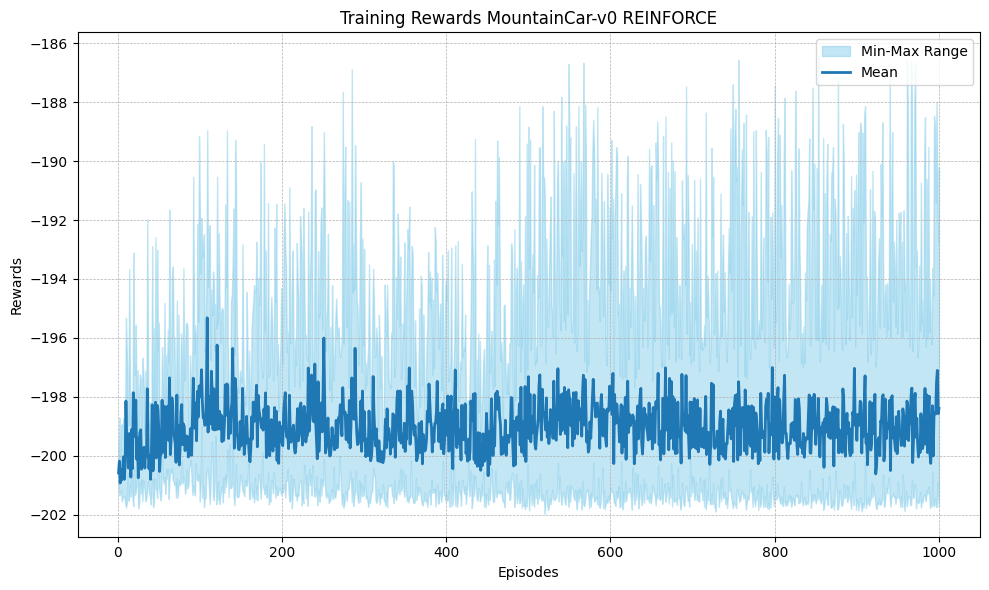

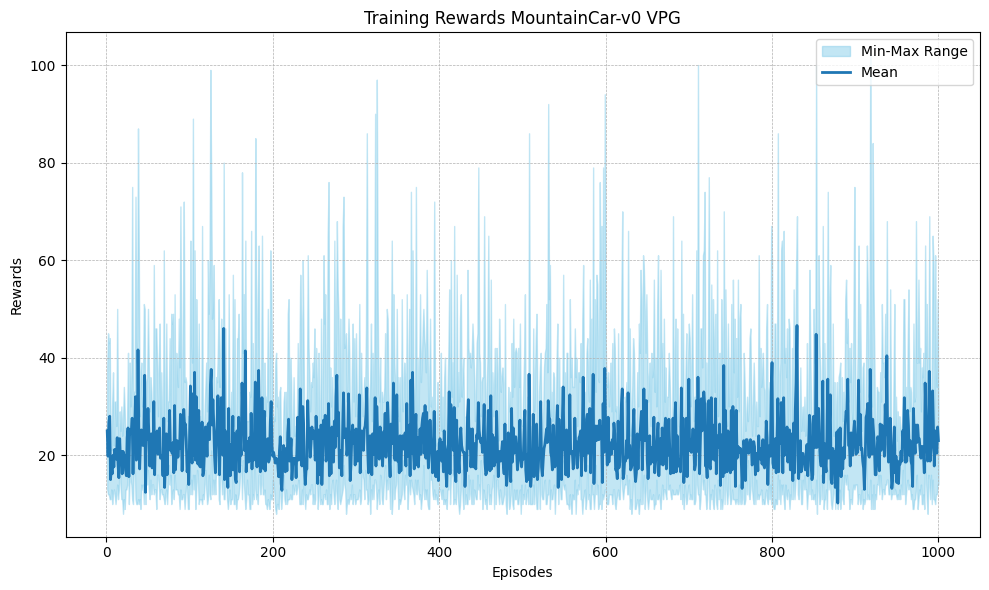

In [147]:
runDeepPolicyBasedAgents(2)

## Question 3

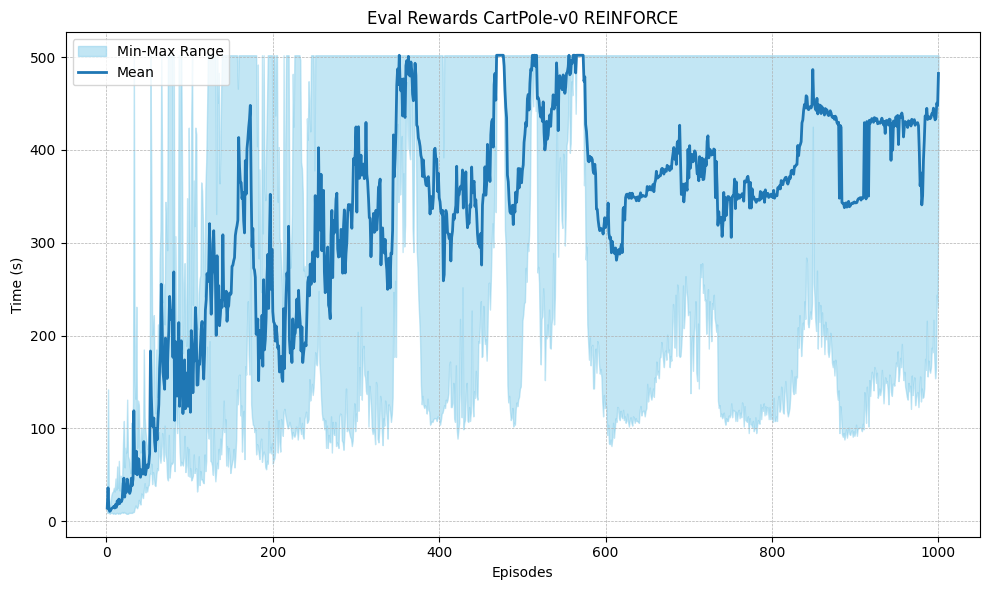

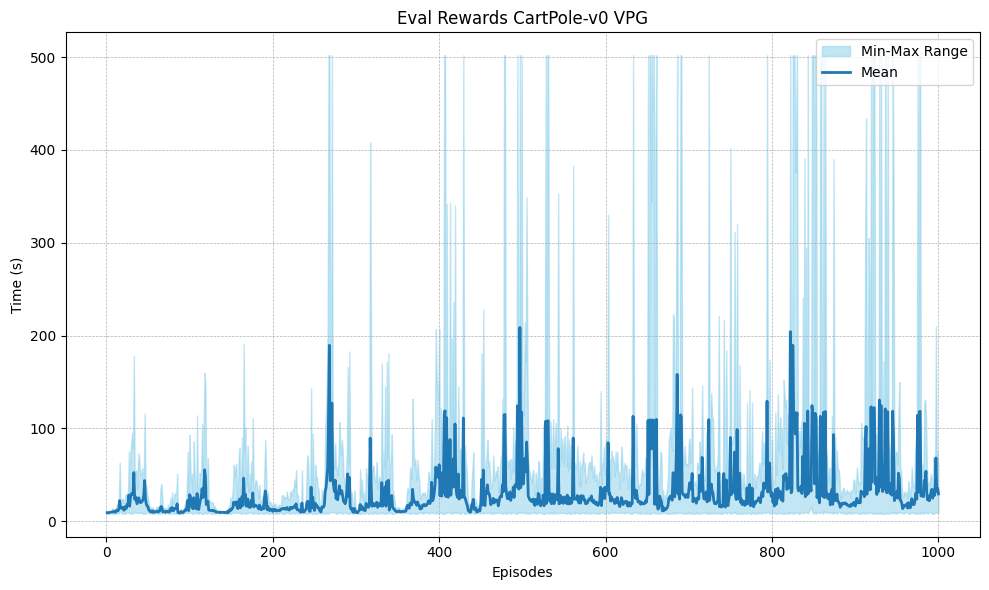

In [148]:
runDeepPolicyBasedAgents(3)

## Question 4

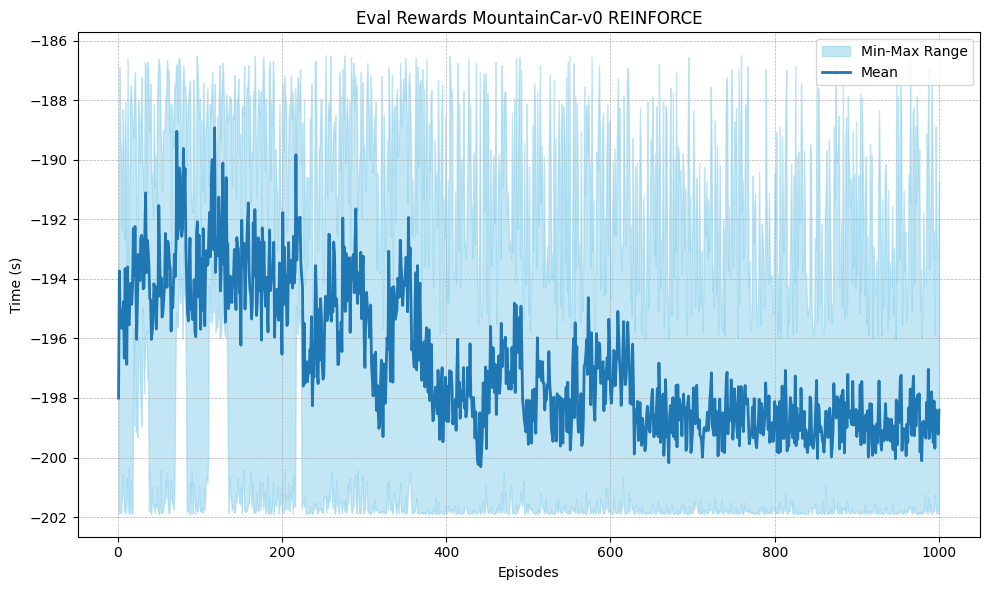

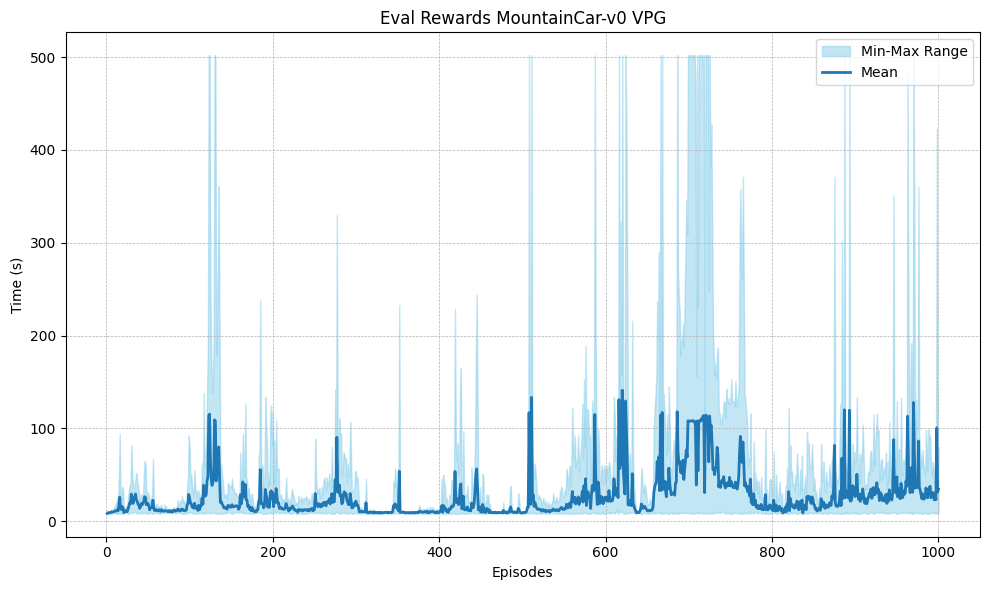

In [149]:
runDeepPolicyBasedAgents(4)

## Question 5

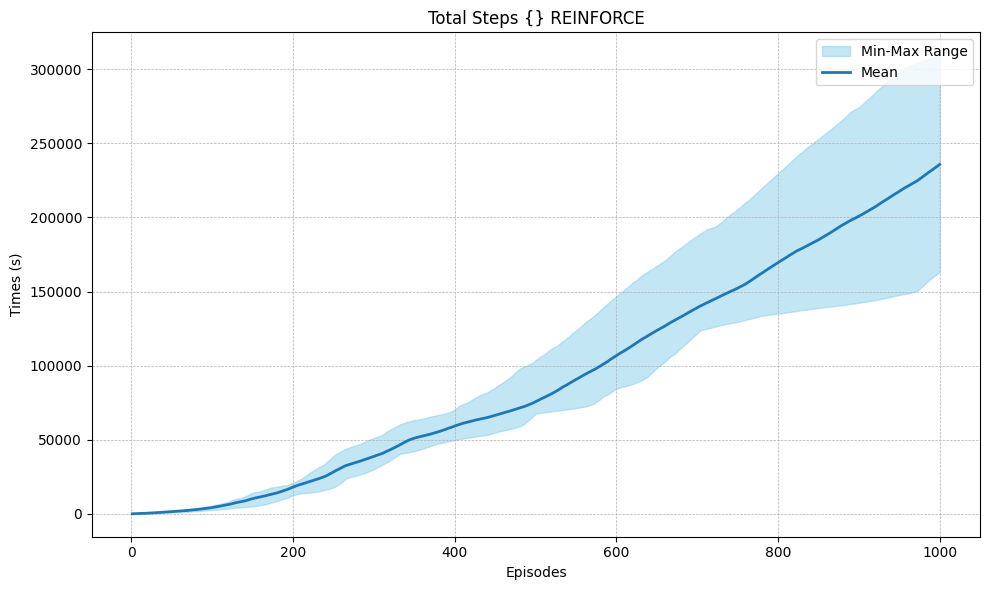

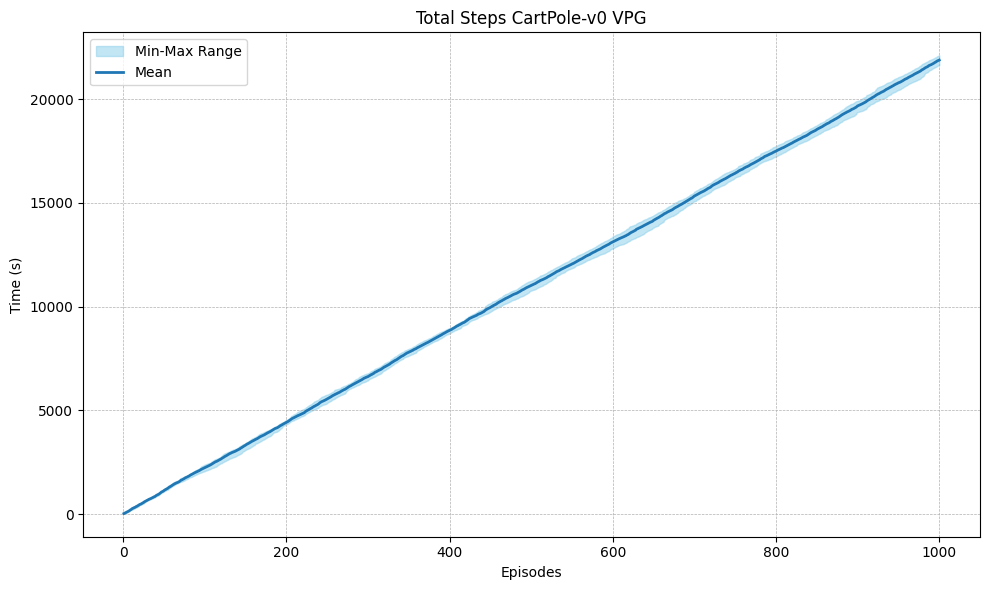

In [150]:
runDeepPolicyBasedAgents(5)

## Question 6

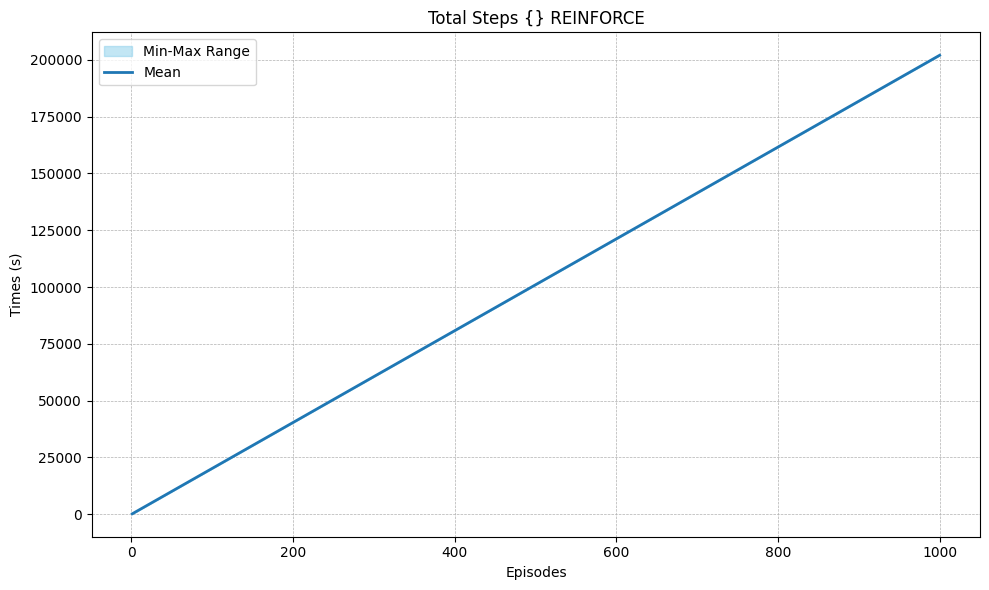

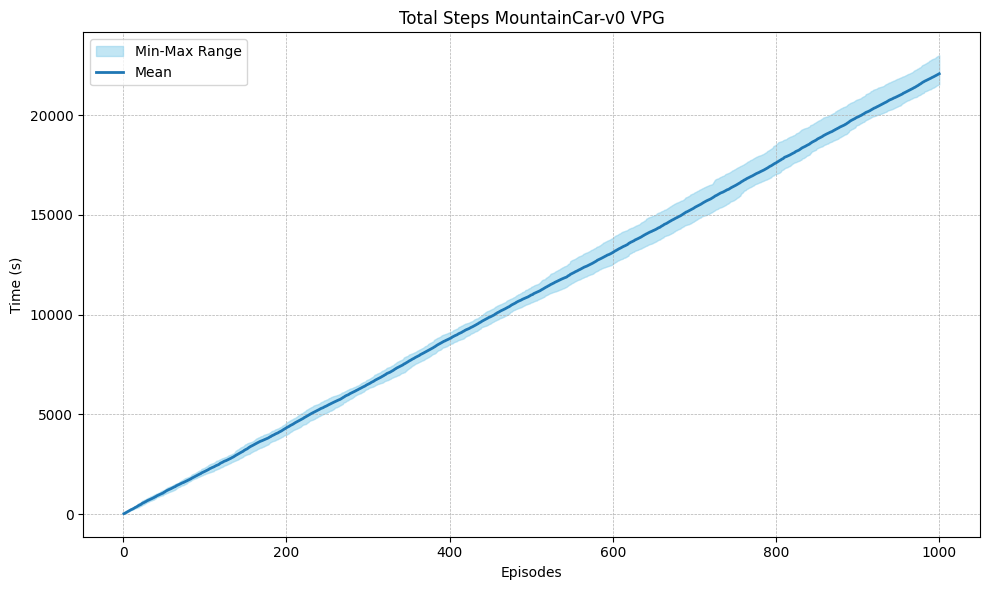

In [151]:
runDeepPolicyBasedAgents(6)

## Question 7

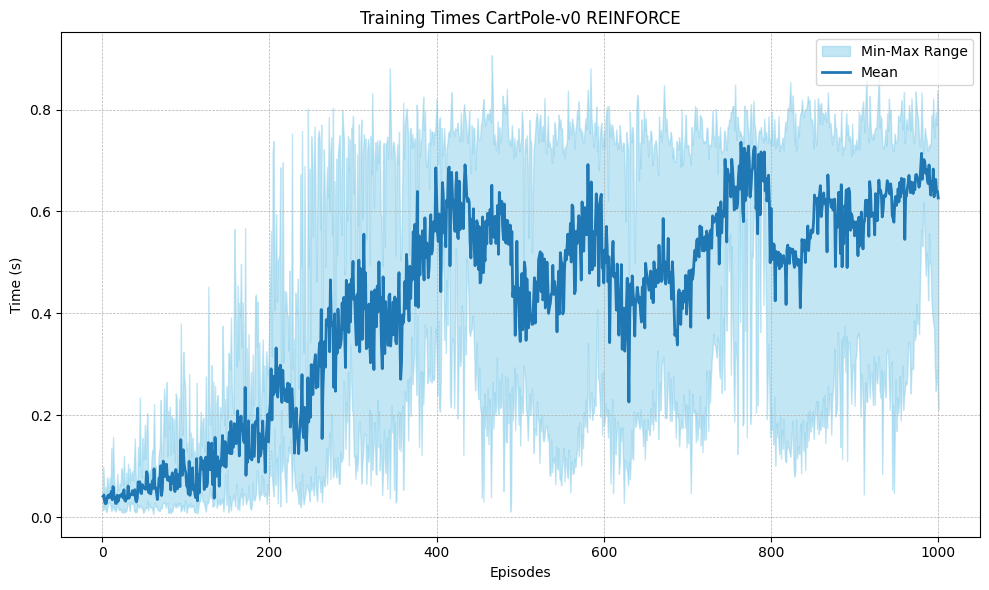

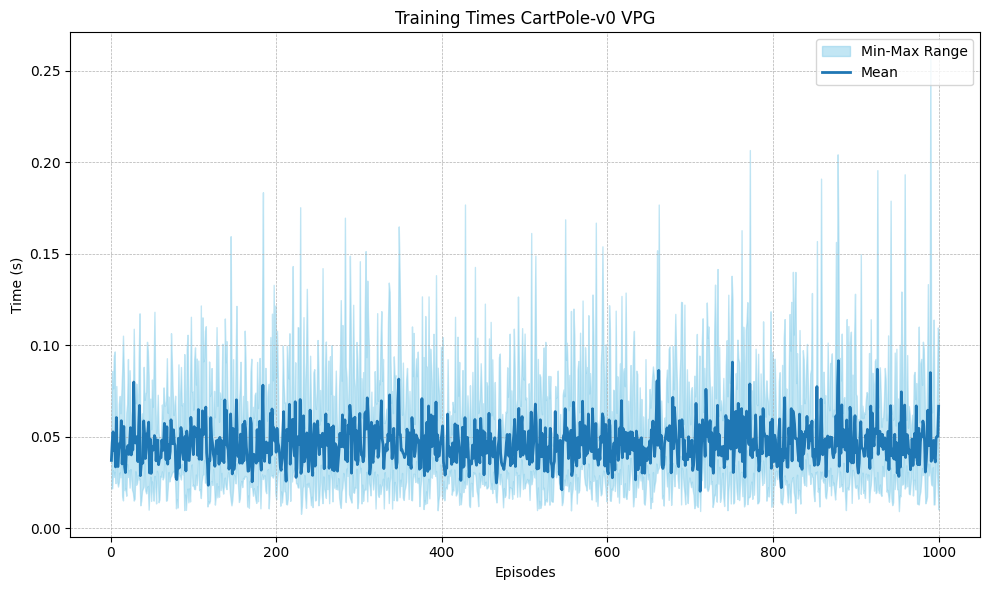

In [152]:
runDeepPolicyBasedAgents(7)

## Question 8

/home/rajarshi/autogpt/SemEval/str/lib/python3.10/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.goal_position to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.goal_position` for environment variables or `env.get_wrapper_attr('goal_position')` that will search the reminding wrappers.
  logger.warn(


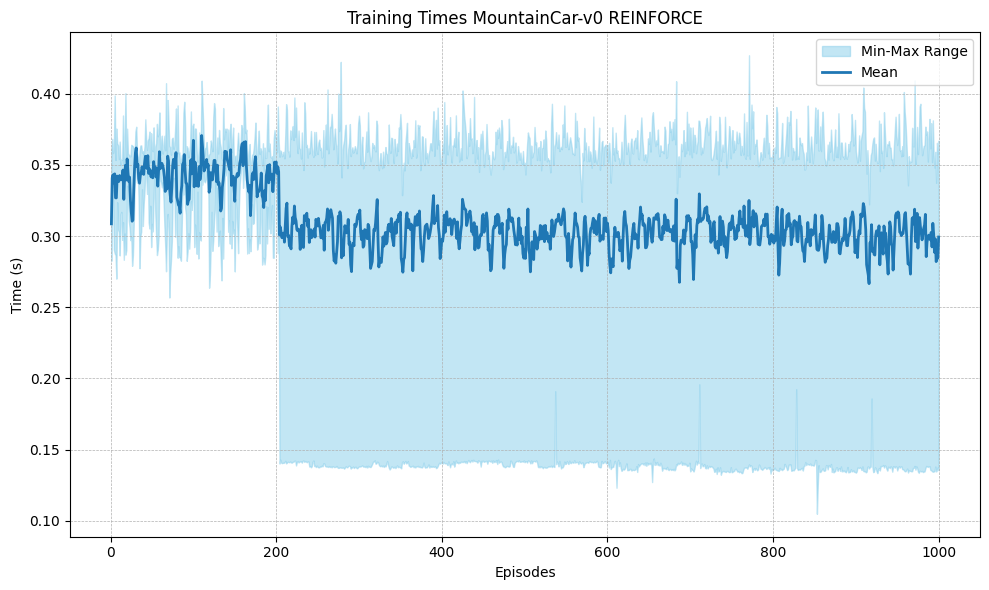

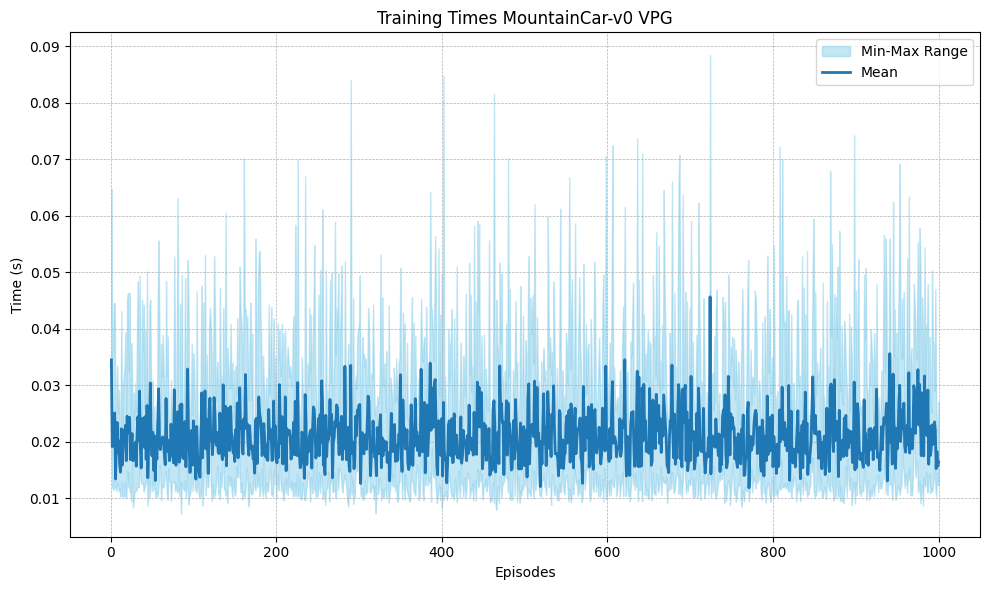

In [153]:
runDeepPolicyBasedAgents(8)

## Question 9

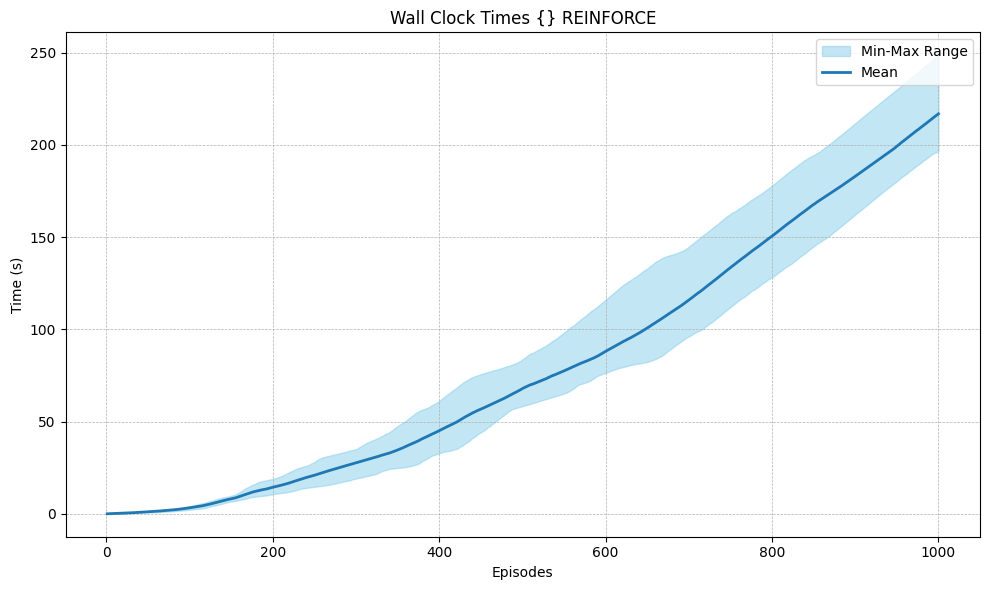

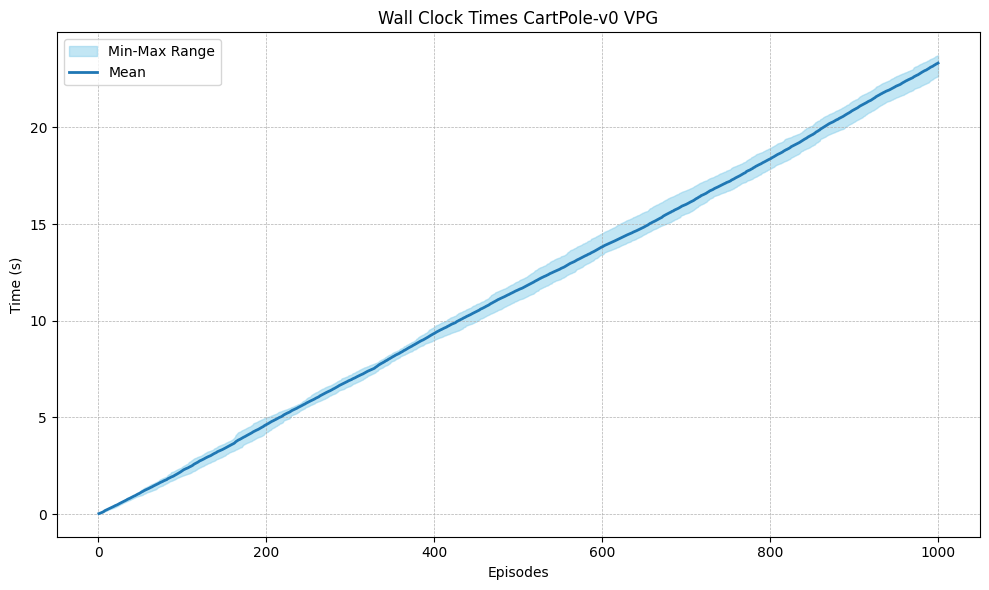

In [154]:
runDeepPolicyBasedAgents(9)

## Question 10

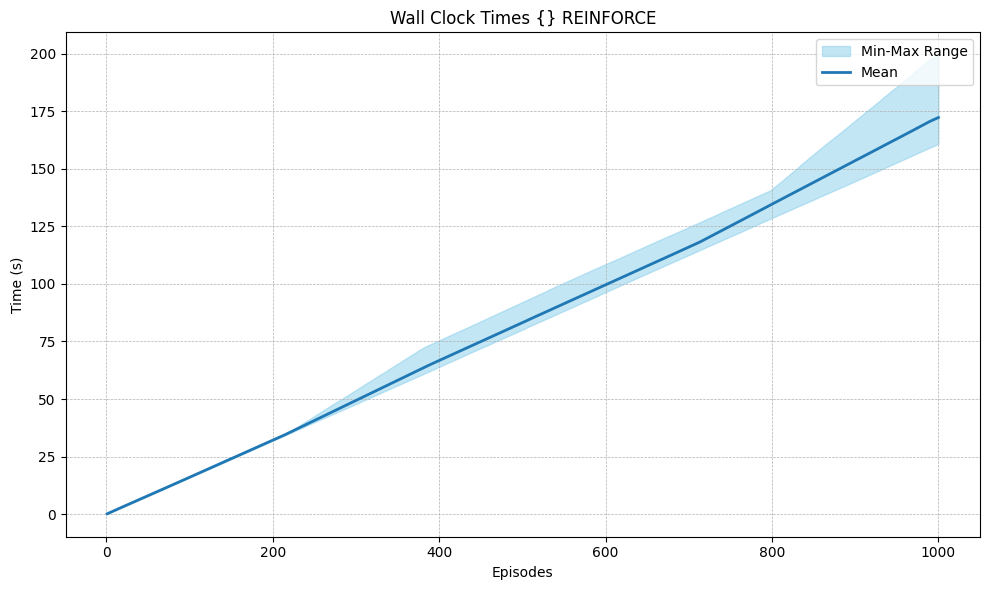

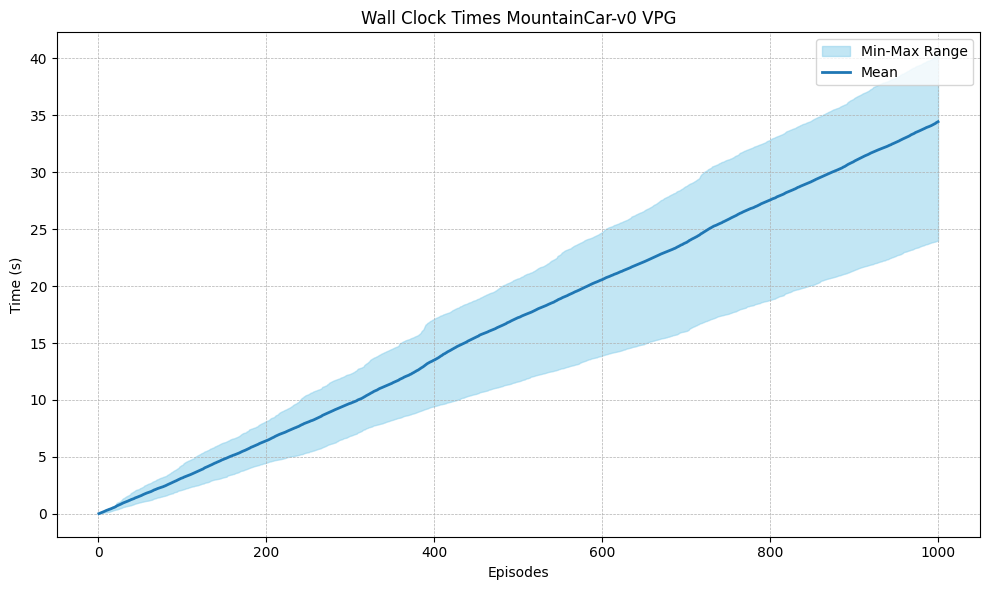

In [155]:
runDeepPolicyBasedAgents(10)

## Question 11

Based on the plots for different agents in the __Cartpole-v0__ environment, especially for the DDQN and DQN architecture produces the same plots apart from the fact that DDQN ovecomes the maximization bias problem and improves the sample efficiency. The __total steps__ and __wall clock times__ for almost all the agents (both value and policy based) are the same except for `D3QN-PER` the wall clock times are especially large lying in the range of `175` as compared to other agents. The __training rewards__ and __eval rewards__ are especially high in `DDQN` as compared to other agents and low in `NFQ`. The __eval rewards__ are the highest in `REINFORCE` algorithm. The `D3QN-PER` and `VPG` seems to take a lot of time for acheiving convergence in both training rewards and evaluation rewards when averaged over 2000 episodes. Apparently from the plots, it is also observed that `REINFORCE` takes the largest training times, whereas the __training times__ for `NFQ` essentially lies below 0.04 and that of `DQN` and `DDQN` oscillates in the range of `0.03-0.04`.

`REINFORCE` also seems to generate much better evaluation rewards for the agent in the cartpole environment as seen in the plot. It is a simple Monte-Carlo based method, `VPG` is way more sample-efficient and converges faster as compared to `REINFORCE`

## Question 12

Based on the plots for different agents in __MountainCar__ environment, the __training rewards__ seems to remain constant over all episodes on a value of -102 which signifies that the agent is unable to reach the goal withithn the max steps in a particular episode for all the Deep agents. I essentially performed reward shaping by increasing te rewards as a function of the current position of the agent denoted by `self.position` and the goal position of the car which is denoted by `self.env.goal_position` that is equal to `0.5`. The new rewards is represented as follows:

$reward = reward + (self.position + self.env.goal\_position)^{2}$

This reward shaping essentially removes the stagnant reward from all the agents and introduces some sort of stochasticity as seen from the plots. 

As for the policy based agents, the __wall clock times__ are essentially larger for `REINFORCE` as compared to `VPG`. The __training times__ are also larger for `REINFORCE` algorithm. Whereas for the value based methods, `NFQ` seems to genearte the maximum training rewards over the episodes followed by `DDQN`, as seen from the plots, `D3QN-PER` doesn't seem to perform that well since it oscillated over the episodes. The __training times__, __wall clock times__, __total steps__ are especialy the highest for the case of `D3QN-PER` adn the lowest for the case of `NFQ`. Overall, the models doesn'y perform that well in the __MountainCar__ environment espeically for the sparse reward structure on every action of the agent towards the goal. 

## Question 13

Based on both value based agents on both the environments, it is observed that the value based agents particularly fail to converge properly in the __MountainCar__ environment espeically because of the sparse reward structure of the environment, hence the rewards osciallted in the region of `[-202, -180]` whereas a clear convergence is observed for all the agents in the __Cartpole-v0__ environment. The __training times__, __total steps__ also seem to be higher for the __MountainCar__ environment as compared to the other environment. The __eval rewards__ also doesn't show a rise and convergence in the __MountainCar__ plots whereas they converge well over 2000 episodes for the __Cartpole-v0__ environment. The __total steps__ essentially shows a straight line for the __MountainCar__ environment suggesting that the agent on an average takes the same number of steps (which is the maximum number of steps until the episode terminates) which is cumulated over multiple episodes and hence shows a linearly increasing trend for all the value based agents. Thus the agent is unable to reach the goal which is `0.5` position within the stipulated number of steps allowed by the gym environment for most of the cases. 

# The-End
